
# Data Science Engineering Methods and Tools Combined Report

#**Abstract**

In this assignment, my aim is interpreting different models used to predict whether a patient has diabetes or not. The analysis aimed to evaluate the quality of the data and determine the important independent variables useful for predicting the target variable. The study involved performing data cleaning, feature selection, and evaluation of numeric variable distributions to identify missing data. The analysis also included selecting useful independent variables using different methods, evaluating their independence, and identifying the impact of outliers. AutoML libraries like H2O.ai were used to create predictive models, and SHAP analysis was performed to interpret the models. The SHAP analysis is used to interpret the models and compare them with other interpretability methods. The objective is to gain insights into the models and their predictive power in the context of the Diabetes dataset. The study provided valuable insights into the importance of data cleaning, feature selection, and predictive learning techniques, highlighting the significance of selecting useful independent variables and handling missing data. The research presents a comprehensive understanding of data analysis techniques and their applications in predictive learning.


# Dataset

### **Original Source:** National Institute of Diabetes and Digestive and Kidney
### **Dataset source:** [Kaggle](https://www.kaggle.com/datasets/nanditapore/healthcare-diabetes/data)
### **Purpose:** Development of predictive models for identifying individuals at risk of diabetes.


### Description:
This dataset provides a comprehensive collection of health-related attributes, carefully curated to assist in the development of predictive models for detecting individuals who may be at risk of developing diabetes. The data includes a range of demographic and physiological features that have been associated with diabetes risk.

### Columns:
* **Patient ID:** Unique identifier for each data entry.
* **Number of Pregnancies:** Total number of times pregnant.
* **Plasma Glucose Level:** Plasma glucose concentration over 2 hours in an oral glucose tolerance test.
* **Diastolic Blood Pressure:** Diastolic blood pressure (mm Hg).
* **Triceps Skinfold Thickness:** Thickness of triceps skinfold (mm).
* **2-Hour Serum Insulin Level:** 2-Hour serum insulin (mu U/ml).
* **Body Mass Index (BMI):** Body mass index (weight in kg / height in m^2).
* **Diabetes Pedigree Function:** Diabetes pedigree function, a genetic score of diabetes likelihood.
* **Age (in years):** Age of the individual.
* **Diabetes Outcome:** Binary classification indicating the presence (1) or absence (0) of diabetes.



# Part 1 - ML Data Cleaning and Feature Selection



#Installing required packages

In [67]:
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install pydot
!pip install graphviz
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


#Importing necessary libraries

In [68]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from scipy import stats
from scipy.stats import norm
import warnings
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
from sklearn.metrics import accuracy_score,classification_report
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from mlxtend.evaluate import bias_variance_decomp
from distutils.util import strtobool
import psutil
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import sklearn.metrics as metrics
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, SGDRegressor
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, SGDRegressor
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
from matplotlib.pyplot import figure
#sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

#Importing the data

In [69]:
# Reading the diabetes dataset
df=pd.read_csv("https://raw.githubusercontent.com/padekars/Healthcare-Diabetes/main/Healthcare-Diabetes.csv")

#EDA

In [70]:
# Viewing data in the file
df.head()


,Id,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,1,6,148,72,35,0,33.6,0.627,50,1
1,2,1,85,66,29,0,26.6,0.351,31,0
2,3,8,183,64,0,0,23.3,0.672,32,1
3,4,1,89,66,23,94,28.1,0.167,21,0
4,5,0,137,40,35,168,43.1,2.288,33,1


In [71]:
# checking if the any data is missing
df.isnull().sum()

Id                          0
Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

No data is missing from any column, which means imputing or removing from data is not required.

In [72]:
#Dropping "Id"
df.drop(columns=['Id'],inplace=True)
# saving a copy of original dataframe
df_copy = df.copy()

We are dropping "Id" as it has the row number which is not useful for our analysis

In [73]:
# This gives information about dataset like column data types, column labels, number of columns,
# number of cell in each column which are not null, range index
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2768 entries, 0 to 2767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               2768 non-null   int64  
 1   Glucose                   2768 non-null   int64  
 2   BloodPressure             2768 non-null   int64  
 3   SkinThickness             2768 non-null   int64  
 4   Insulin                   2768 non-null   int64  
 5   BMI                       2768 non-null   float64
 6   DiabetesPedigreeFunction  2768 non-null   float64
 7   Age                       2768 non-null   int64  
 8   Outcome                   2768 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 194.8 KB


In [74]:

# provides some statistical information of data in dataframe
df.describe()


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000
mean,3.742775,121.102601,69.134393,20.824422,80.127890,32.137392,0.471193,33.132225,0.343931
std,3.323801,32.036508,19.231438,16.059596,112.301933,8.076127,0.325669,11.777230,0.475104
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.244000,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,37.000000,32.200000,0.375000,29.000000,0.000000
75%,6.000000,141.000000,80.000000,32.000000,130.000000,36.625000,0.624000,40.000000,1.000000
max,17.000000,199.000000,122.000000,110.000000,846.000000,80.600000,2.420000,81.000000,1.000000


For the numerical data, we assume it is normally distributed. Therefore, with a Q-Q Plot, from the scatterplot of our data and its goodness of fitting with the line, we can have a glance of our data and see if it is indeed normally distributed.

#Distribution of each feature

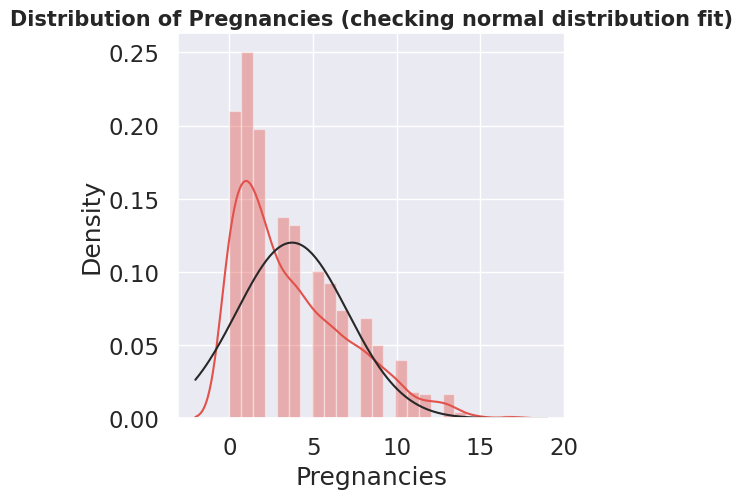

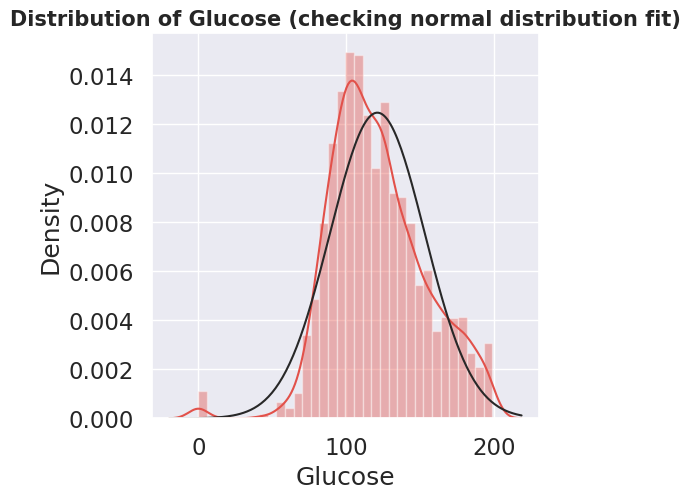

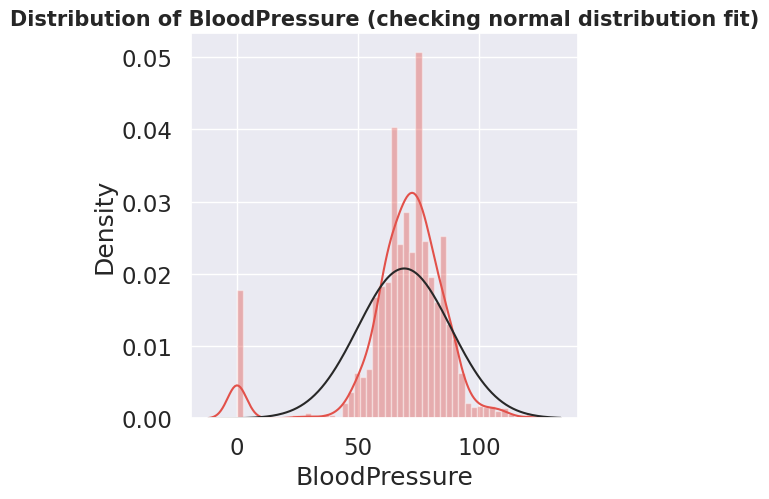

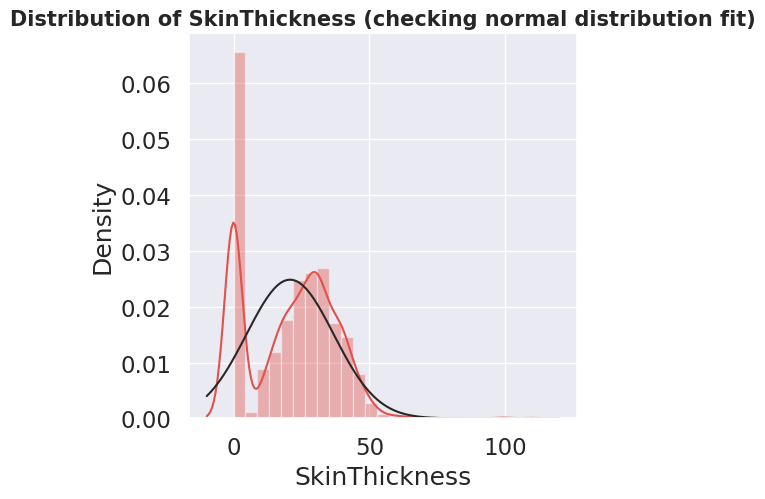

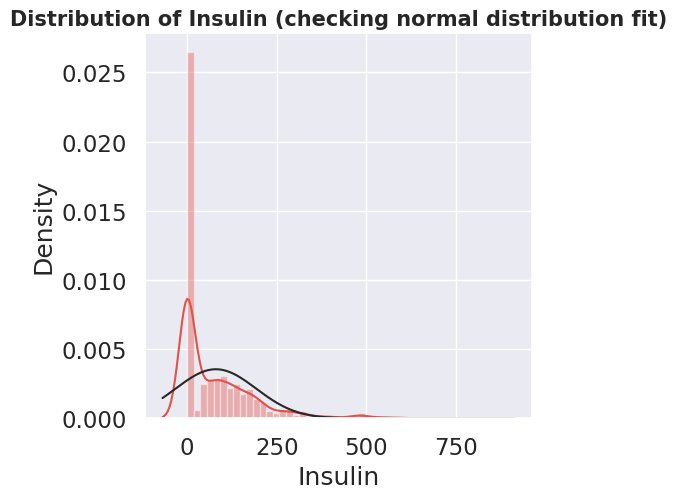

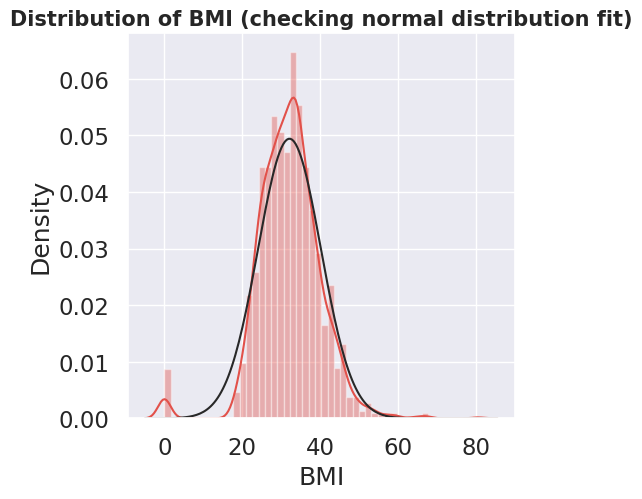

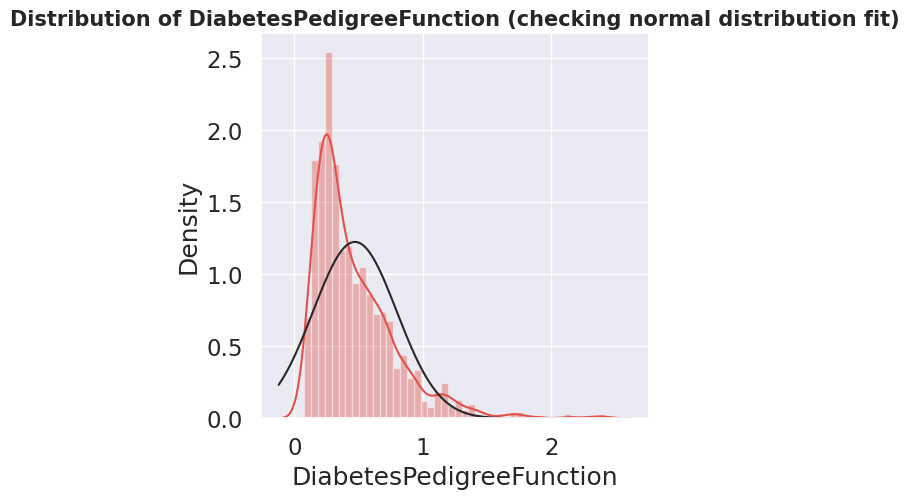

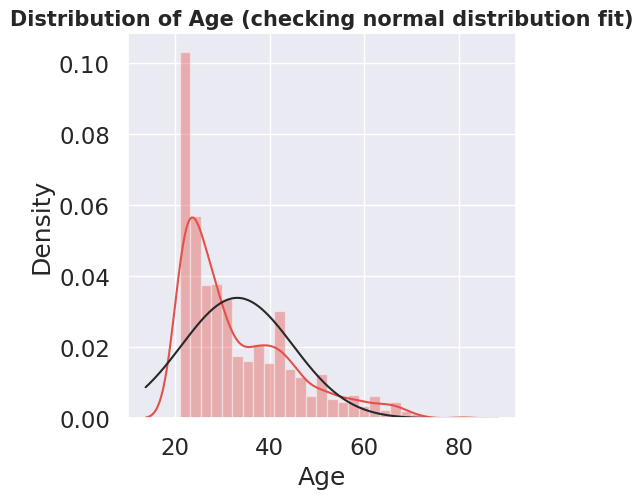

In [75]:
df1 = df[
    ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]
]
for i in df1:
    plt.figure(figsize= (5,5))
    sns.distplot(df1[i], fit = norm)
    plt.title(f"Distribution of {i} (checking normal distribution fit)",size = 15, weight = "bold")

<Figure size 800x500 with 0 Axes>

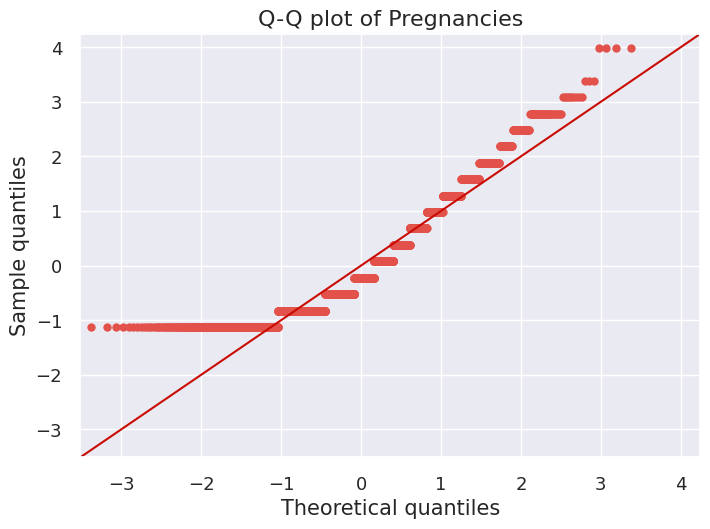

<Figure size 800x500 with 0 Axes>

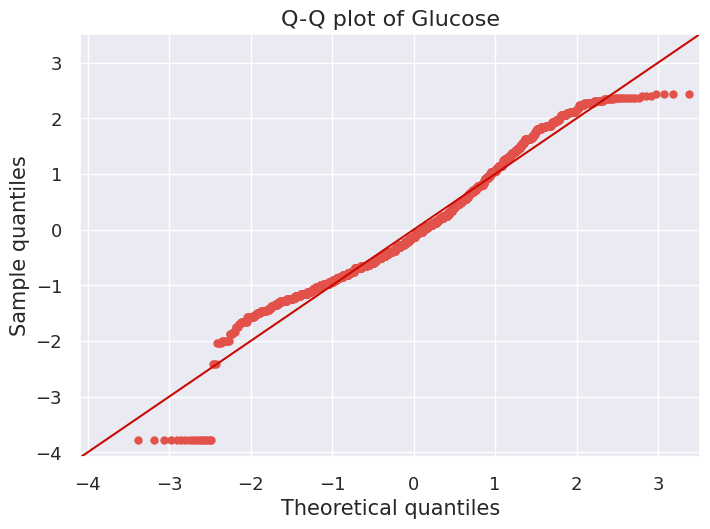

<Figure size 800x500 with 0 Axes>

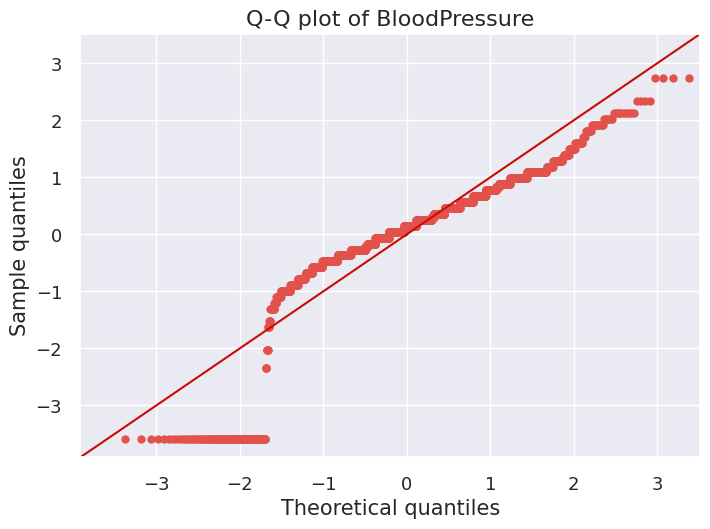

<Figure size 800x500 with 0 Axes>

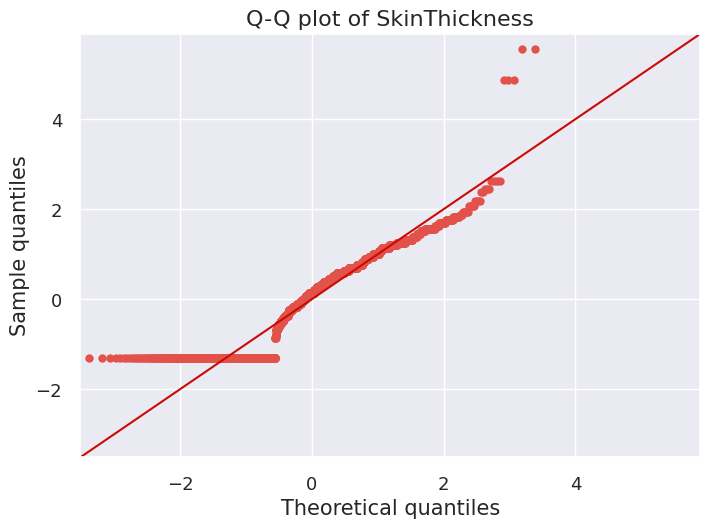

<Figure size 800x500 with 0 Axes>

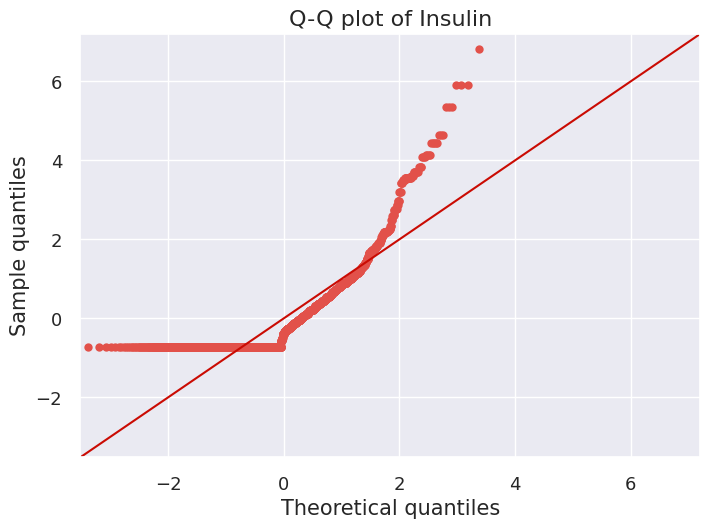

<Figure size 800x500 with 0 Axes>

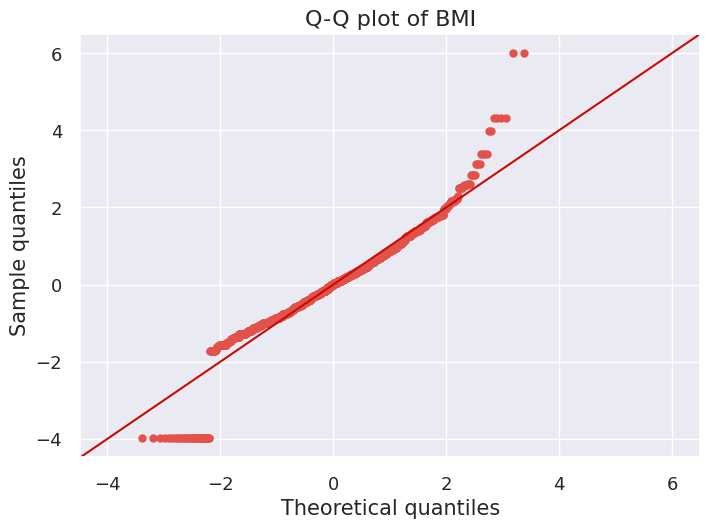

<Figure size 800x500 with 0 Axes>

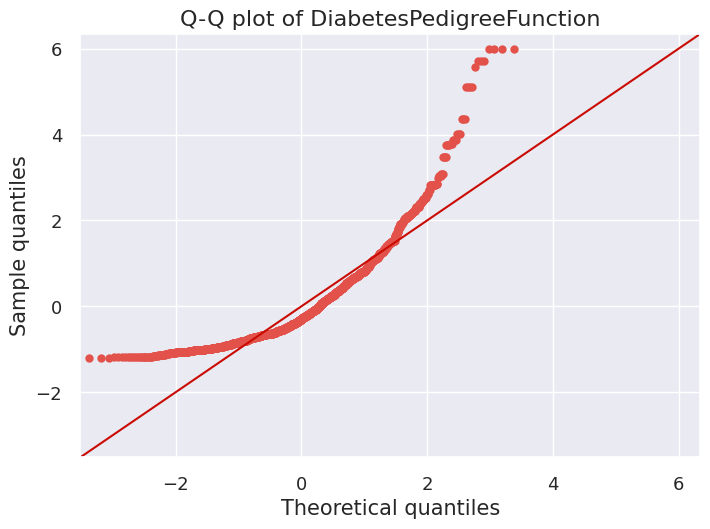

<Figure size 800x500 with 0 Axes>

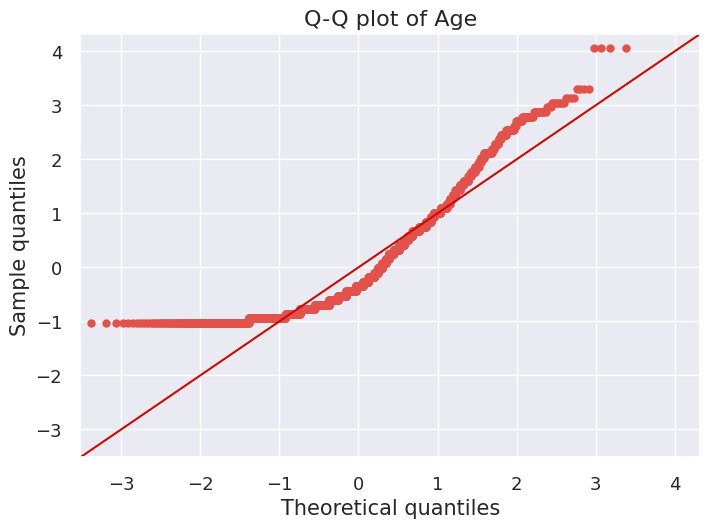

In [76]:

  # checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm = df[
    ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]
]
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

In [77]:
df["Outcome"].value_counts()

0    1816
1     952
Name: Outcome, dtype: int64

<Axes: >

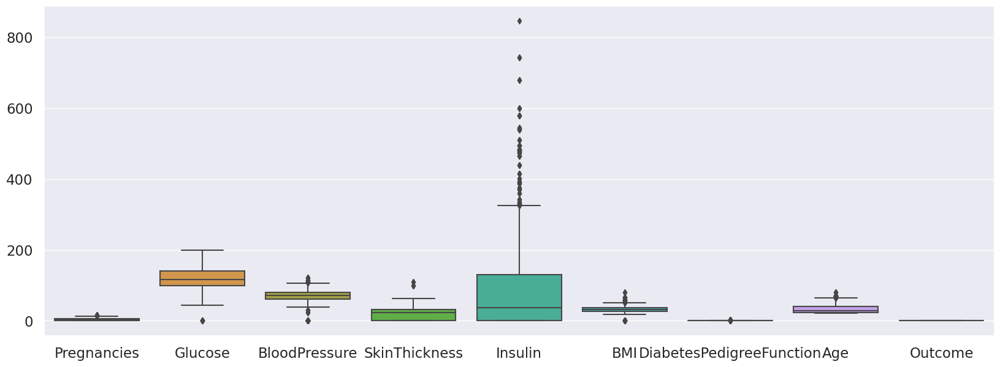

In [78]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=df)

Observations:

The range of Insulin is way too high as compared to other predictor variables. Therefore, we are not able to visualize the ranges for other predictor variables.
So what should be do next to visualize ranges of other predictor variables?

We will plot the charts separately to get the ranges of each one of them

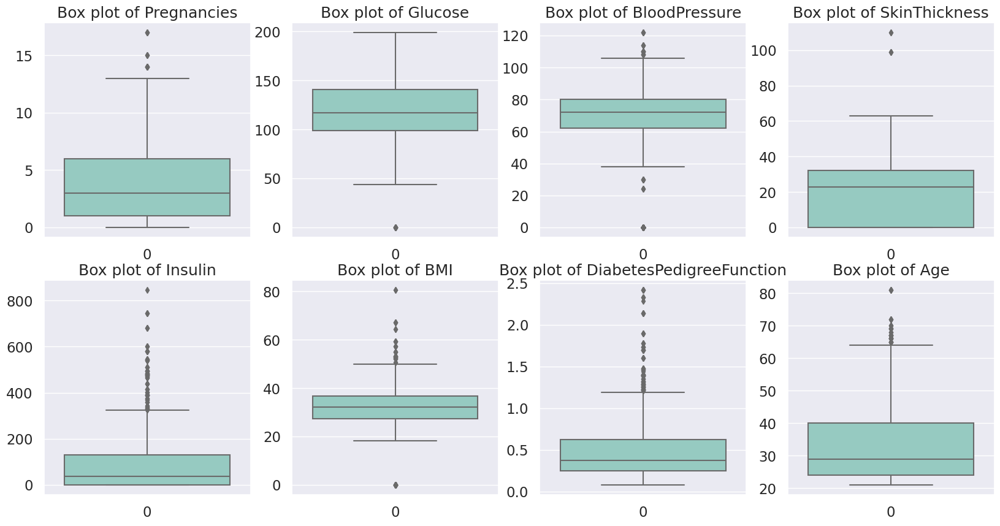

In [79]:
#Checking the Ranges of the predictor variables individually
cols = list(data_norm.columns)
f, axs = plt.subplots(2,4,figsize=(20,10))
for i in range(len(cols)):
  plt.subplot(2,4,i+1)
  plt.title('Box plot of '+ cols[i])
  sns.boxplot(data_norm[cols[i]], palette = 'Set3')
plt.show()

#Handling outliers

In [80]:
#  using IQR method to impute outliers
def handle_outliers_iqr(df, feature,fac): # df = dataframe , feature = each feature , fac = 1.5 or 2 based on the use case
    Qan1 = df[f"{feature}"].quantile(0.25)
    Qan3 = df[f"{feature}"].quantile(0.75)
    IQR=Qan3-Qan1
    lower_limit=Qan1-fac*IQR
    upper_limit=Qan3+fac*IQR
    df.loc[(df[feature] < lower_limit) | (df[feature] > upper_limit), feature] = df[feature].mean()
    return df

In [81]:
handle_outliers_iqr(df , "Insulin" , 1.5)
handle_outliers_iqr(df , "BloodPressure" , 1.5)
handle_outliers_iqr(df , "BMI" , 1.5)
handle_outliers_iqr(df , "Pregnancies" , 1.5)
handle_outliers_iqr(df , "SkinThickness" , 1.5)
handle_outliers_iqr(df , "Age" , 1.5)
handle_outliers_iqr(df , "DiabetesPedigreeFunction" , 1.5)
'''for col in df[["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]:'''


'for col in df[["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]:'

<Axes: >

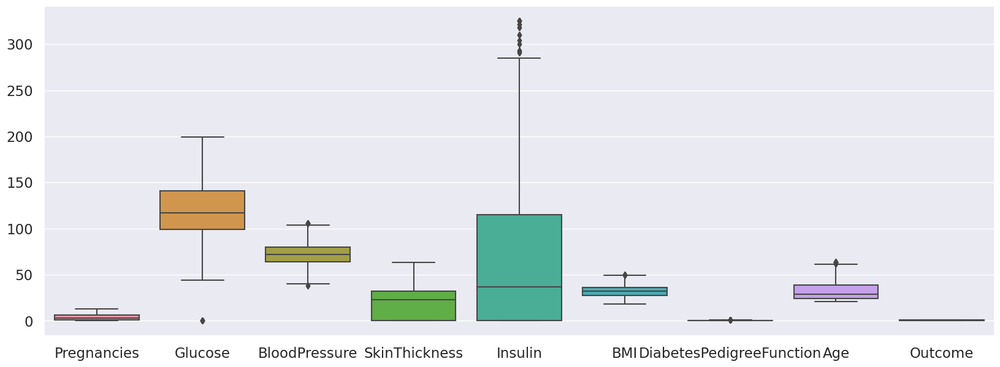

In [82]:
plt.figure(figsize=(20,7))
sns.boxplot(data = df)

In [83]:
# list of numerical columns which require normalization
num_cols=["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]

# Importing required library from sklearn for normalization
from sklearn import preprocessing
feature_to_scale = num_cols

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
df[feature_to_scale] = min_max_scaler.fit_transform(df[feature_to_scale])

In [84]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000,2768.000000
mean,0.282928,0.608556,0.499837,0.328179,0.202412,0.441514,0.319952,0.263346,0.343931
std,0.246991,0.160987,0.163755,0.248713,0.247360,0.201339,0.222527,0.243285,0.475104
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.076923,0.497487,0.382353,0.000000,0.000000,0.294811,0.149146,0.069767,0.000000
50%,0.230769,0.587940,0.500000,0.365079,0.113846,0.438283,0.266846,0.186047,0.000000
75%,0.461538,0.708543,0.617647,0.507937,0.353846,0.572327,0.453729,0.418605,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Text(0.5, 1.0, 'Box plot of predictor variables of the dataset')

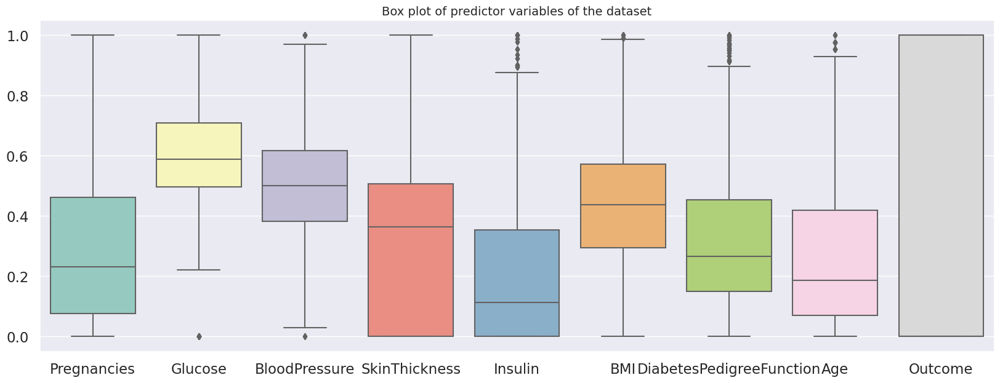

In [85]:
#Checking the Ranges of the predictor variables together after normalization of numerical variables
plt.figure(figsize=(20,7))
sns.boxplot(data=df, palette="Set3")
plt.title("Box plot of predictor variables of the dataset", size=14)

#Checking correlation

In [86]:
# checking the correlation between all the features in the data
df.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.113618,0.203113,-0.083804,-0.095495,0.024702,0.008606,0.575629,0.203827
Glucose,0.113618,1.000000,0.193328,0.044478,0.235952,0.209632,0.079091,0.243452,0.460644
BloodPressure,0.203113,0.193328,1.000000,0.059732,-0.033348,0.265461,0.025067,0.327302,0.170944
SkinThickness,-0.083804,0.044478,0.059732,1.000000,0.493459,0.388008,0.153118,-0.068633,0.072997
Insulin,-0.095495,0.235952,-0.033348,0.493459,1.000000,0.198967,0.213593,-0.036067,0.093804
BMI,0.024702,0.209632,0.265461,0.388008,0.198967,1.000000,0.125671,0.078289,0.289918
DiabetesPedigreeFunction,0.008606,0.079091,0.025067,0.153118,0.213593,0.125671,1.000000,0.058255,0.142107
Age,0.575629,0.243452,0.327302,-0.068633,-0.036067,0.078289,0.058255,1.000000,0.285523
Outcome,0.203827,0.460644,0.170944,0.072997,0.093804,0.289918,0.142107,0.285523,1.000000


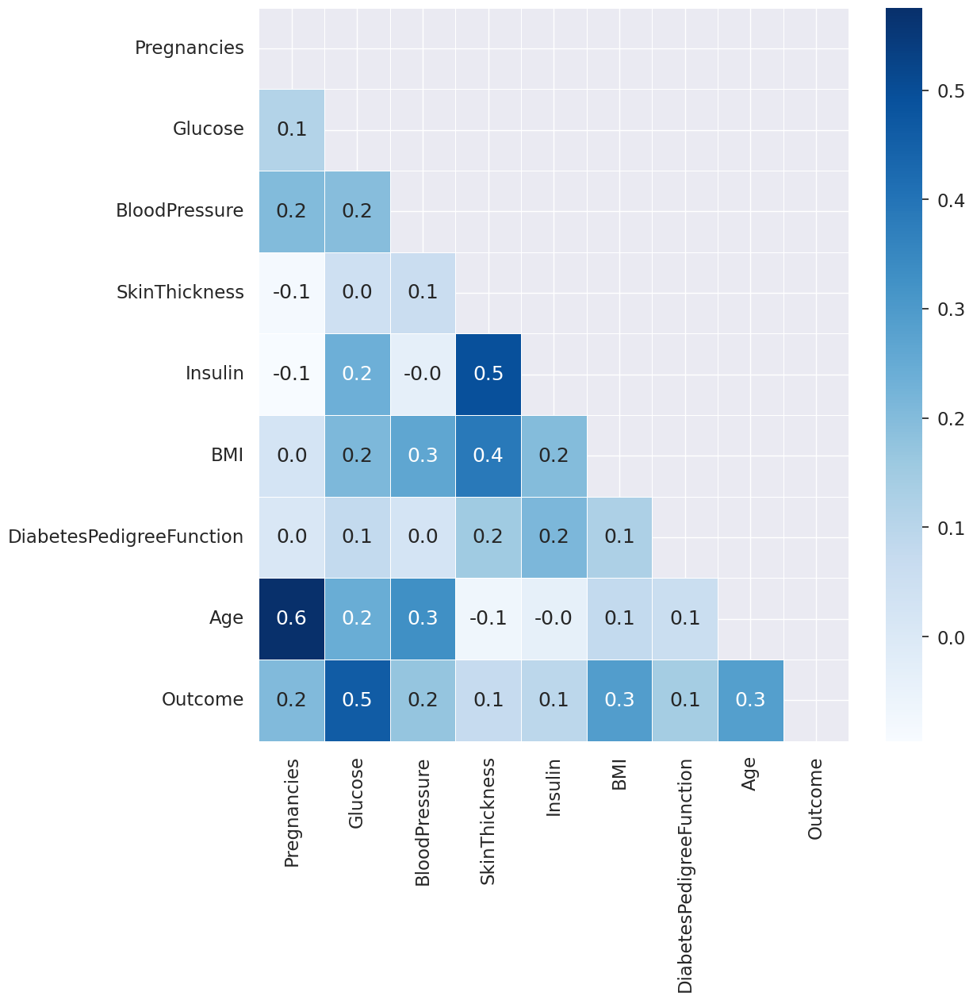

In [87]:
f,ax = plt.subplots(figsize=(12, 12))
mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(df.corr(), annot=True, linewidths=0.4,linecolor="white", fmt= '.1f',ax=ax,cmap="Blues",mask=mask)
plt.show()

<Axes: >

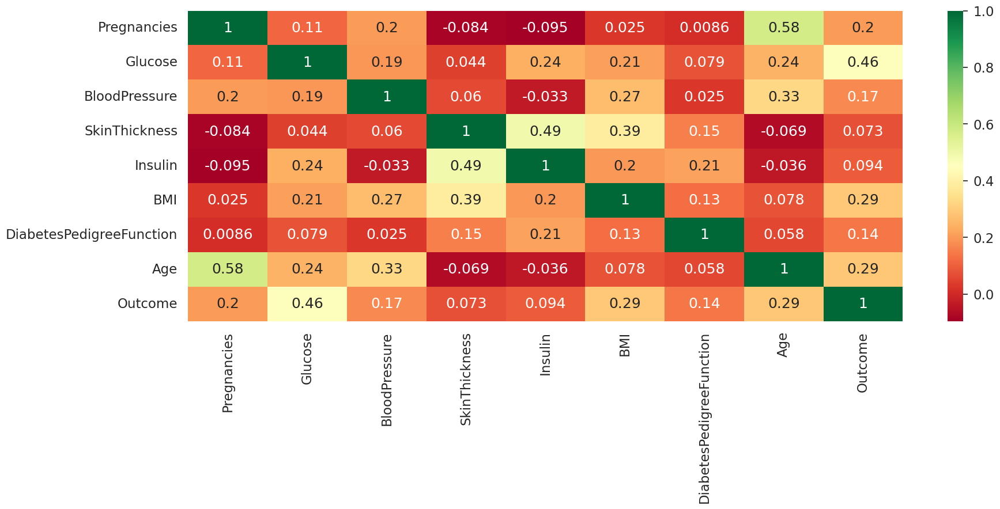

In [88]:
# the heat map of the correlation

plt.figure(figsize=(20,7))
sns.heatmap(df.corr(), annot=True, cmap='RdYlGn')

The heatmap reveals a notable correlation between the number of pregnancies and age. This association is likely due to the tendency for older individuals to have experienced a greater number of pregnancies. Additionally, the strong correlation between glucose levels and the diabetes outcome aligns with expectations, given the pivotal role of glucose in diabetes diagnosis compared to other factors.

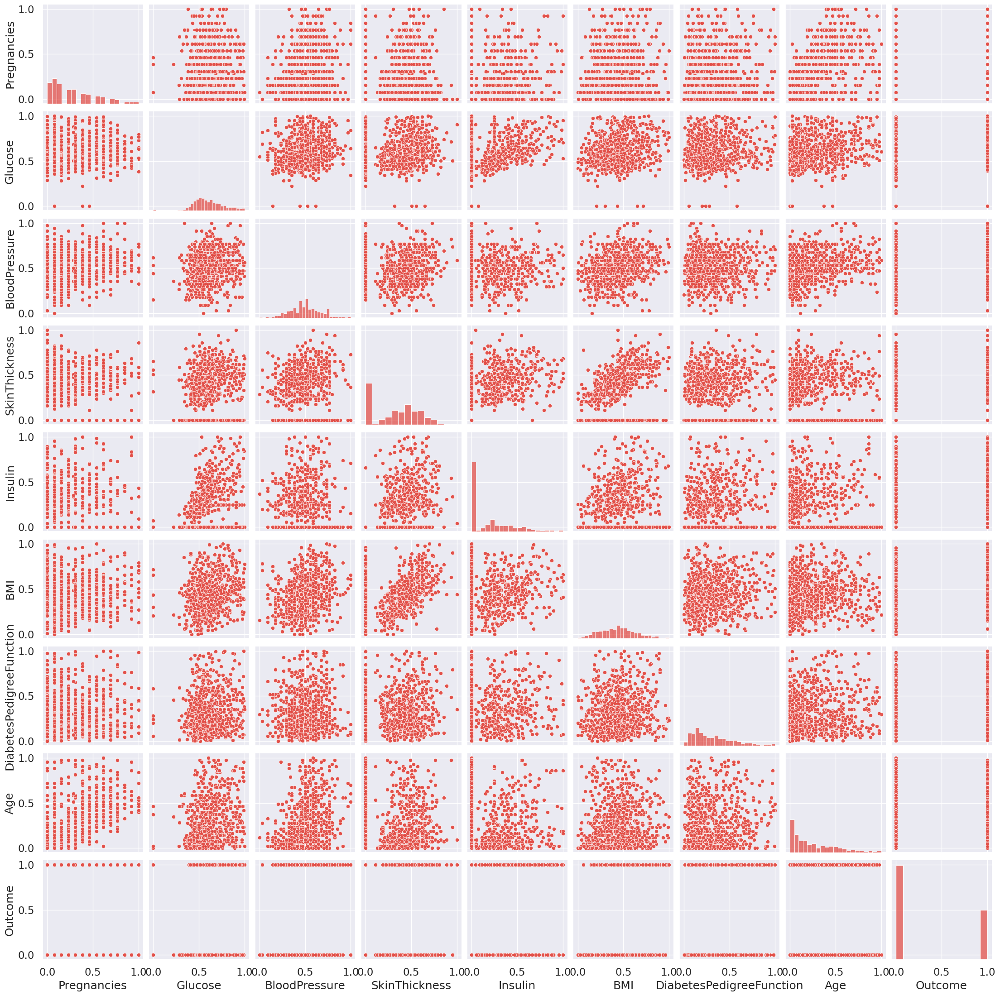

In [89]:
# pair plot to check the colinearity
sns.pairplot(df)


Creating a Train - Test split for our model training and predictions

#Model building

In [90]:
# Splitting our dataset into two dataframes - 1. Predictor Variables 2. Target Variable
y = df['Outcome']
x = df.drop('Outcome', axis = 1)
data_total = df


In [91]:
from sklearn.model_selection import  train_test_split

#Spliting data into Training 80% and Test set 20%

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)

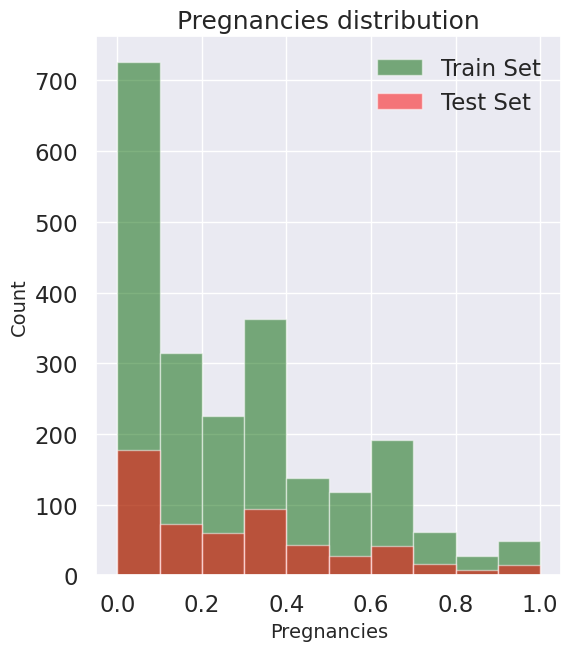

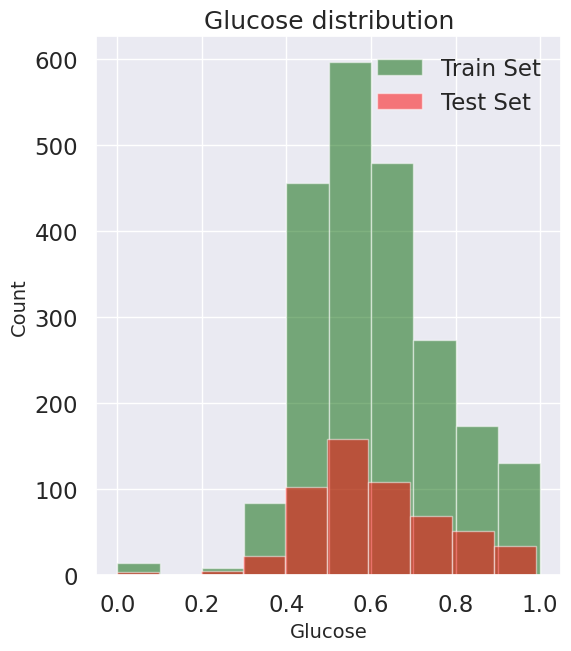

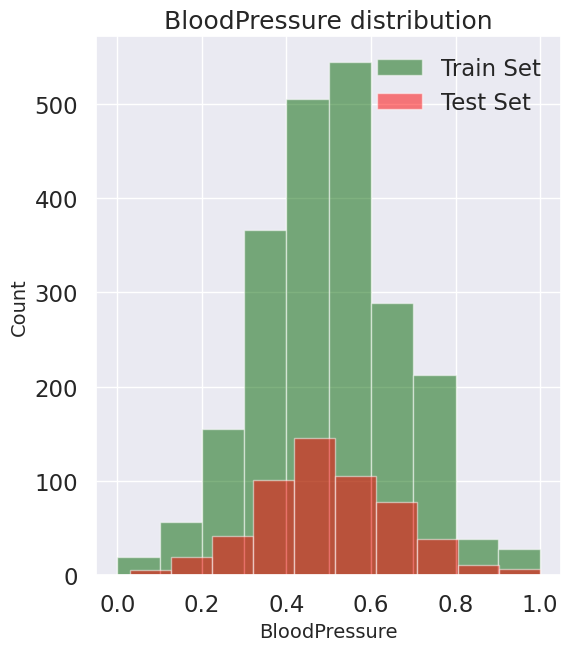

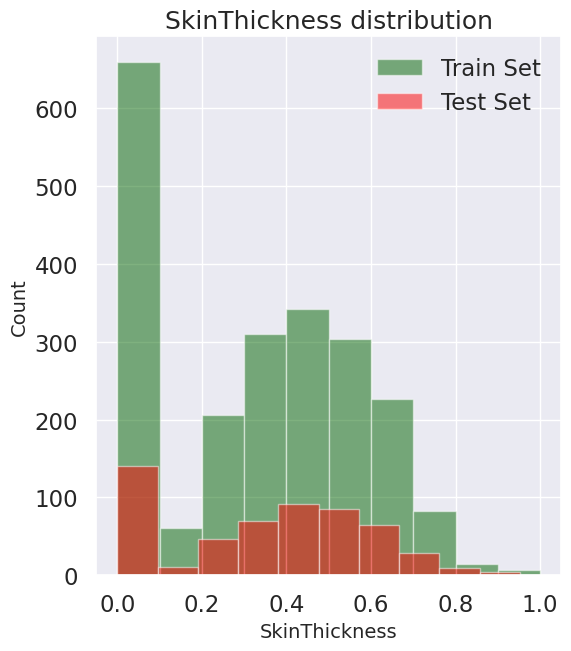

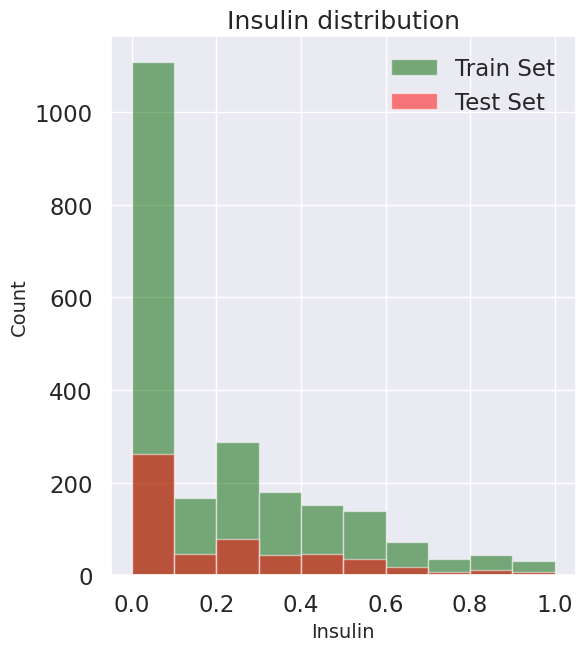

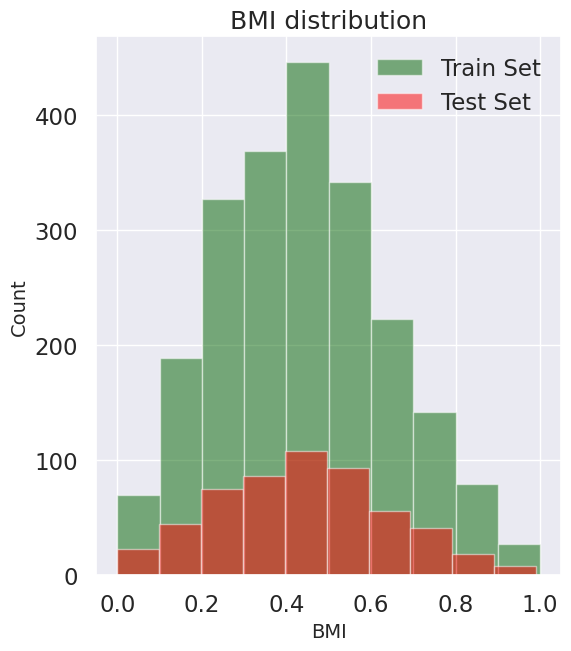

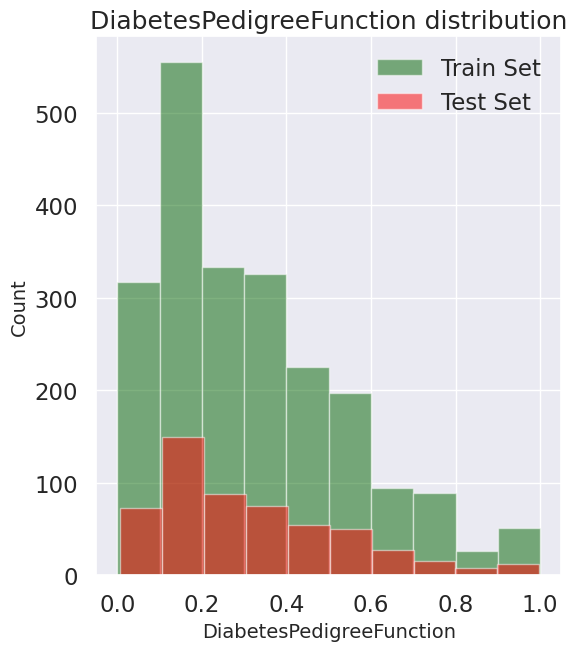

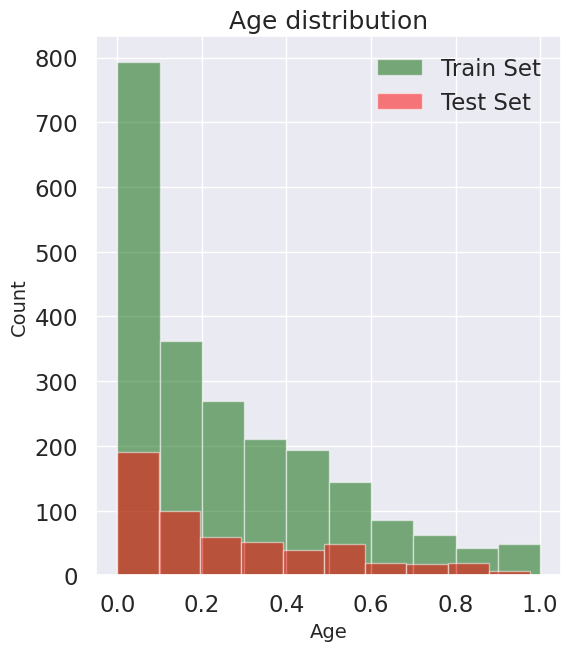

In [92]:
# Looking the data for test and training set
X_test_plot = X_test
X_train_plot = X_train

#Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
    plt.figure(figsize=(6,7))
    plt.hist(X_train_plot[c], bins=10, alpha=0.5, label="Train Set", color="darkgreen")
    plt.hist(X_test_plot[c], bins=10, alpha=0.5, label="Test Set", color ="red")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc='upper right')
    plt.title("{} distribution".format(c))
    plt.show()




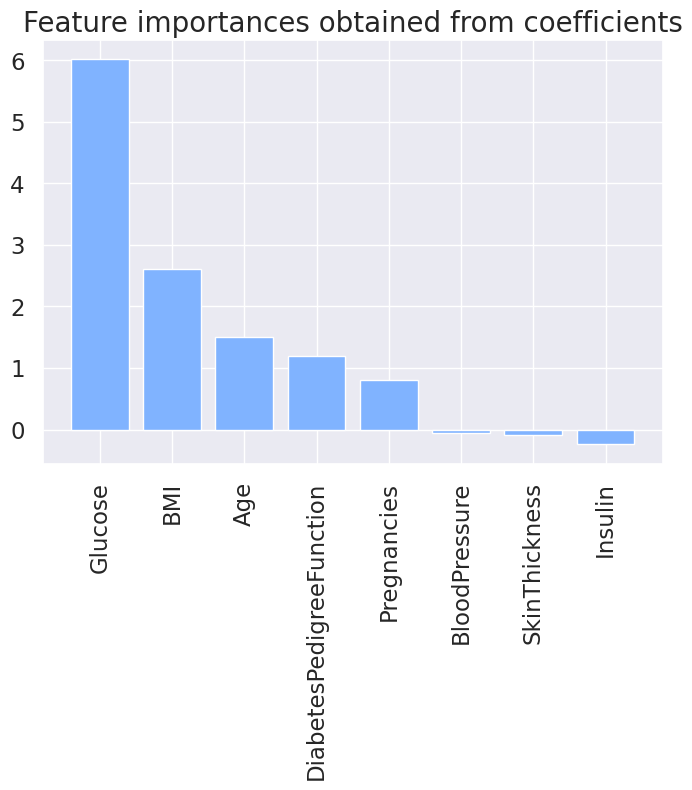

In [93]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
importances = pd.DataFrame(data={
    'Attribute': X_train.columns,
    'Importance': model.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending=False)

plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#80B3FF')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

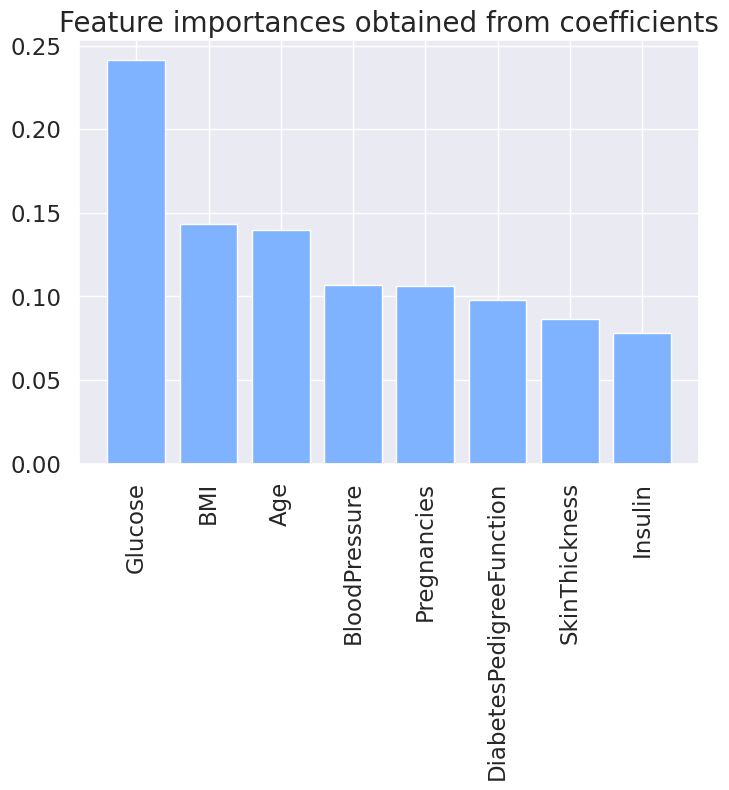

In [94]:
model = XGBClassifier()
model.fit(X_train, y_train)
importances = pd.DataFrame(data={
    'Attribute': X_train.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#80B3FF')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

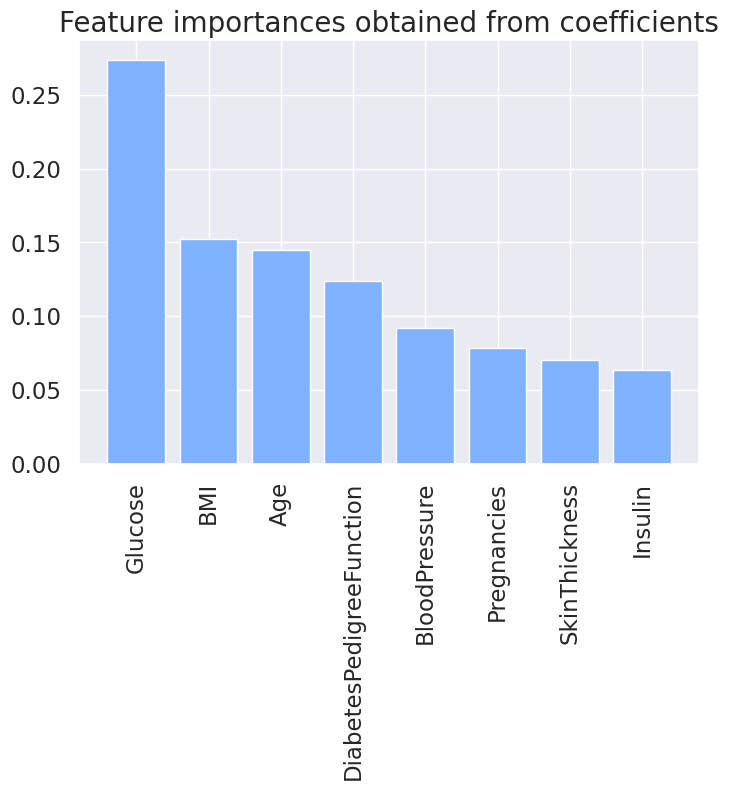

In [95]:
model = RandomForestClassifier()
model.fit(X_train, y_train)
importances = pd.DataFrame(data={
    'Attribute': X_train.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)

plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#80B3FF')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

#OLS

In [96]:
import statsmodels.api as sm

model = sm.OLS(df['Outcome'], df[["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                Outcome   R-squared (uncentered):                   0.481
Model:                            OLS   Adj. R-squared (uncentered):              0.479
Method:                 Least Squares   F-statistic:                              319.6
Date:                Tue, 12 Dec 2023   Prob (F-statistic):                        0.00
Time:                        03:05:06   Log-Likelihood:                         -1543.0
No. Observations:                2768   AIC:                                      3102.
Df Residuals:                    2760   BIC:                                      3149.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Pregnancies                  0.0488      0.040      1.233      0.218      -0.029       0.126
Glucose                      0.5428      0.042     12.819      0.000       0.460       0.626
BloodPressure               -0.4514      0.049     -9.191      0.000      -0.548      -0.355
SkinThickness               -0.1029      0.040     -2.599      0.009      -0.181      -0.025
Insulin                     -0.0099      0.039     -0.253      0.800      -0.087       0.067
BMI                          0.3921      0.045      8.624      0.000       0.303       0.481
DiabetesPedigreeFunction     0.0499      0.036      1.373      0.170      -0.021       0.121
Age                          0.3805      0.042      9.032      0.000       0.298       0.463
==============================================================================
Omnibus:                     2301.595   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              290.709
Skew:                           0.523   Prob(JB):                     7.47e-64
Kurtosis:                       1.805   Cond. No.                         8.39
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [97]:
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7581227436823105


In [98]:
# Make predictions using the testing set
y_pred = model.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test, y_pred))
r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)
rmse1= np.sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: %f'% rmse1)

Mean squared error: 0.24
Coefficient of determination: -0.07
R^2 score on test set = -0.07339502602660497
RMSE: 0.491810


3 metrics will be calculated for evaluating predictions.

Mean Absolute Error (MAE) shows the difference between predictions and actual values.

Root Mean Square Error (RMSE) shows how accurately the model predicts the response.

R^2 will be calculated to find the goodness of fit measure.

In [99]:
from tabulate import tabulate
lr_y_predict_out = model.predict(X_test)

print("Model Performance with Test set")

d = [ ["Accuracy_score", f'{round(accuracy_score(y_test, lr_y_predict_out),2)}'],
     ["Precision_score", f'{round(precision_score(y_test, lr_y_predict_out),2)}'],
     ["Recall_score", f'{round(recall_score(y_test, lr_y_predict_out),2)}'],
     ["F1-score",f'{round(f1_score(y_test, lr_y_predict_out),2)}']]

print(tabulate(d, headers=["Metrics", "Score"]))

Model Performance with Test set
Metrics            Score
---------------  -------
Accuracy_score      0.76
Precision_score     0.68
Recall_score        0.56
F1-score            0.61


Calculating accuracy with Outliers

In [100]:
# Splitting our dataset into two dataframes - 1. Predictor Variables 2. Target Variable
y1 = df_copy['Outcome']
x1 = df_copy.drop('Outcome', axis = 1)


from sklearn.model_selection import  train_test_split

#Spliting data into Training 80% and Test set 20%

X_train1, X_test1, y_train1, y_test1 = train_test_split(x1, y1, test_size=0.2, random_state=1)

In [101]:
modelLogistic_out = LogisticRegression()
modelLogistic_out.fit(X_train1,y_train1)

prediction1 = modelLogistic_out.predict(X_test1)
from tabulate import tabulate

print("Model Performance with Test set")

d = [ ["Accuracy_score", f'{round(accuracy_score(y_test1, prediction1),2)}'],
     ["Precision_score", f'{round(precision_score(y_test1, prediction1),2)}'],
     ["Recall_score", f'{round(recall_score(y_test1, prediction1),2)}'],
     ["F1-score",f'{round(f1_score(y_test1, prediction1),2)}']]

print(tabulate(d, headers=["Metrics", "Score"]))



Model Performance with Test set
Metrics            Score
---------------  -------
Accuracy_score      0.76
Precision_score     0.69
Recall_score        0.56
F1-score            0.62


In [102]:

data1=df.copy()


#Delete 1% randomly and fill by mean

In [103]:
# delete 1%
import random, math

rand = random.sample(range(0, 2767), 27)
for j in rand:
    for i in range(8):
        data1.iloc[rand, i] = None
    print(j)

1470
2254
203
1847
274
2627
872
2069
2318
2213
509
1769
50
1471
832
2265
2716
2353
2687
2540
21
2494
146
2544
350
1826
1166


In [104]:
data1.isnull().sum()
# imputate by mean
data1 = data1.fillna(df.mean())
data1.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [105]:
from sklearn.model_selection import  train_test_split

X = data1[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']

#Spliting data into Training 90%, Test set 20%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [106]:
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print('Accuracy: ',accuracyScore)
# Make predictions using the testing set
y_pred = model.predict(X_test)
# estimate bias and variance
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

Accuracy:  0.7527075812274369
MSE: 0.247
Bias: 0.229
Variance: 0.018


#Delete 5% randomly and fill by mean




In [107]:

data2=df.copy()


In [108]:
# 5%
import random, math

rand = random.sample(range(0, 2767), 27 * 5)
for j in rand:
    for i in range(8):
        data2.iloc[rand, i] = None
    print(j)

1771
1246
181
334
1806
40
667
1241
2099
257
1298
741
205
458
2383
1775
345
218
1913
2626
1389
535
18
101
1533
2145
2101
1802
1377
2686
331
2020
828
2462
2518
2611
466
2757
1481
523
2360
1857
1685
326
2315
1868
1781
46
463
2498
2076
1344
1689
494
1263
874
740
2276
705
2006
2111
2737
644
840
2139
1029
134
235
1578
781
2456
2042
108
2583
127
787
2357
2482
2637
1942
2171
1247
1449
2173
358
1199
2230
258
651
1291
405
1905
2430
2610
982
396
241
2187
2455
2751
2596
532
1149
2633
2750
1067
2011
1386
2271
462
2348
1911
908
1186
140
81
907
935
1145
301
562
2570
1622
1701
1682
2588
2761
2614
919
2605
1649
2128
365
552
83


In [109]:
data2.isnull().sum()
# imputate by mean
data2 = data2.fillna(df.mean())
data2.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [110]:
from sklearn.model_selection import  train_test_split

X = data2[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']

#Spliting data into Training 90%, Test set 20%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [111]:
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print('Accuracy: ',accuracyScore)
# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

Accuracy:  0.7563176895306859
MSE: 0.249
Bias: 0.231
Variance: 0.018


#Delete 10% randomly and fill by mean


In [112]:
# Reading the diabetes dataset

data3=df.copy()


In [113]:
# 10%
import random, math

rand = random.sample(range(0, 2767), 27 * 10)
for j in rand:
    for i in range(8):
        data3.iloc[rand, i] = None
    print(j)

2028
2103
1773
1478
851
912
365
294
2261
1560
333
2093
970
2160
2137
2432
42
2571
1951
2742
1357
1492
1246
2078
641
902
430
1322
2391
533
954
2026
2651
2238
881
1092
2098
266
1086
2229
1180
170
2333
1579
2000
2691
676
2090
1138
2171
1281
1774
270
770
612
938
2254
1338
1476
255
932
1526
2154
1826
525
562
1462
977
2347
1421
326
2679
227
284
1702
450
762
949
1636
1247
1353
969
295
1116
2421
1750
817
1724
948
2293
2597
1554
482
1632
167
744
400
1898
20
2662
2073
2319
1753
2363
1153
351
2224
798
1917
1017
222
1744
1292
2655
1593
2187
2113
2290
2531
791
2298
521
502
662
416
1783
1282
1368
2541
2148
349
1871
2280
208
2223
1042
657
2130
848
897
1097
654
1187
2257
1983
51
458
183
248
399
2517
837
2482
2658
1385
2599
2009
1290
1709
833
640
1021
172
2647
2303
2206
2687
1708
952
1964
370
1571
1075
745
1183
2122
946
917
700
213
2640
1316
1305
2521
1165
1414
2071
1527
1059
1633
782
1417
1272
441
157
1914
855
1342
1373
140
784
1355
2670
63
1958
888
1986
1623
189
86
2715
2539
2506
2622
996
757
372
152

In [114]:
data3.isnull().sum()


Pregnancies                 270
Glucose                     270
BloodPressure               270
SkinThickness               270
Insulin                     270
BMI                         270
DiabetesPedigreeFunction    270
Age                         270
Outcome                       0
dtype: int64

In [115]:
# imputate by mean
data3 = data3.fillna(df.mean())
data3.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [116]:
from sklearn.model_selection import  train_test_split

X = data3[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']

#Spliting data into Training 90%, Test set 20%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [117]:
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print('Accuracy: ',accuracyScore)
# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

Accuracy:  0.7527075812274369
MSE: 0.251
Bias: 0.234
Variance: 0.017


#Delete1% and using ffill

In [118]:

data4=df.copy()


In [119]:
# delete 1%
import random, math

rand = random.sample(range(0, 2767), 27)
for j in rand:
    for i in range(8):
        data4.iloc[rand, i] = None
    print(j)

603
1234
581
2453
1718
723
1921
1407
228
473
986
909
1355
905
1012
853
1104
1160
44
142
2062
1597
1346
2294
30
135
240


In [120]:
data4.isnull().sum()

Pregnancies                 27
Glucose                     27
BloodPressure               27
SkinThickness               27
Insulin                     27
BMI                         27
DiabetesPedigreeFunction    27
Age                         27
Outcome                      0
dtype: int64

In [121]:

# drop column
data4 = data4.fillna(method = 'ffill')

In [122]:
data4.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [123]:
from sklearn.model_selection import  train_test_split
X = data4[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

print(X.shape)
print(y.shape)
y = df['Outcome']

#Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

(2768, 8)
(2768,)


In [124]:
# print accuracy
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7545126353790613


In [125]:

# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.250
Bias: 0.232
Variance: 0.017


#deleting 5% and using ffill

In [126]:

data5=df.copy()


In [127]:
# delete 5%
import random, math

rand = random.sample(range(0, 2767), 27*5)
for j in rand:
    for i in range(8):
        data5.iloc[rand, i] = None
    print(j)

1103
2329
886
294
946
1537
330
1960
1502
1659
1795
2466
2035
1134
448
648
174
2518
193
1778
1911
288
1189
1515
1963
191
2494
1096
2373
384
2096
2366
2603
2495
757
1653
2124
2092
2498
2543
960
2670
1498
76
1698
401
1074
1120
1447
1809
1114
935
1806
1901
2012
2081
1385
1012
2431
2542
1270
2374
970
1273
39
1350
2700
444
1733
2428
9
646
147
1926
1888
1179
749
1493
305
2506
2328
2587
2078
2687
2632
926
2218
1228
1490
2276
2469
1980
1246
2694
2640
2570
2222
1607
2153
1245
1747
1609
2112
1063
49
151
1223
1968
1415
720
883
1296
1250
1608
1264
1611
878
1644
934
919
809
208
2219
1860
2604
1499
1349
958
2355
46
1455
281
2376
1907
1195


In [128]:
data5.isnull().sum()

Pregnancies                 135
Glucose                     135
BloodPressure               135
SkinThickness               135
Insulin                     135
BMI                         135
DiabetesPedigreeFunction    135
Age                         135
Outcome                       0
dtype: int64

In [129]:
data5 = data5.fillna(method = 'ffill')

In [130]:
data5.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [131]:
from sklearn.model_selection import  train_test_split
X = data5[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']
print(X.shape)
print(y.shape)

#Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

(2768, 8)
(2768,)


In [132]:
# print accuracy
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7472924187725631


In [133]:

# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.253
Bias: 0.234
Variance: 0.019


#Deleting 10% and using ffill

In [134]:

data6=df.copy()


In [135]:
# delete 10%
import random, math

rand = random.sample(range(0, 2767), 27*10)
for j in rand:
    for i in range(8):
        data6.iloc[rand, i] = None
    print(j)

2012
2009
500
859
2276
2055
1190
2696
1936
2007
1501
2243
2311
2061
520
2341
2600
1780
2241
1929
630
879
2083
2176
485
475
138
1365
503
1057
1635
2516
1984
1319
2027
1037
1669
61
80
1272
176
318
896
1405
356
628
2442
1236
319
1871
1011
2254
1812
33
1348
907
2094
1575
1282
1229
818
1682
1064
1399
2198
1815
1408
1617
553
1988
1383
592
468
1909
2401
1556
1475
1858
1577
2457
2263
544
682
1032
1645
1521
2710
2123
1447
86
1330
1873
30
2298
1171
1977
1415
209
2588
1594
115
2569
2318
1150
1739
925
2236
117
1869
2330
1887
522
459
122
1075
477
2672
914
1781
2554
2296
599
698
2064
1461
1418
2099
1411
1548
88
344
2297
1831
668
29
1186
1403
811
1522
967
2671
1665
1231
625
402
2052
1196
230
598
602
311
1524
2472
1540
1614
1253
2048
2599
2433
166
2499
2720
791
1917
488
159
676
165
365
2602
2609
1803
1673
1877
696
1459
1285
2597
1155
1252
606
2218
1843
2682
39
2429
622
417
1943
1717
1372
2643
1758
2214
1706
2627
1872
1652
1799
1135
1096
507
1003
2285
1798
2283
1336
2270
2658
8
2417
2180
1973
1611
1890

In [136]:
data6.isnull().sum()

Pregnancies                 270
Glucose                     270
BloodPressure               270
SkinThickness               270
Insulin                     270
BMI                         270
DiabetesPedigreeFunction    270
Age                         270
Outcome                       0
dtype: int64

In [137]:
data6 = data6.fillna(method = 'ffill')

In [138]:
data6.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [139]:
from sklearn.model_selection import  train_test_split
X = data6[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']
print(X.shape)
print(y.shape)

#Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

(2768, 8)
(2768,)


In [140]:
# print accuracy
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7382671480144405


In [141]:

# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.266
Bias: 0.247
Variance: 0.019


# Deleting 1% and using forward interpolation method

In [142]:

data7=df.copy()


In [143]:
# delete 1%
import random, math

rand = random.sample(range(0, 2767), 27)
for j in rand:
    for i in range(8):
        data7.iloc[rand, i] = None
    print(j)

1512
2050
2080
575
2293
813
1678
1567
1431
1778
1406
2298
940
1712
2442
896
18
1684
2740
1600
1372
391
1761
1454
2739
614
584


In [144]:
data7.isnull().sum()

Pregnancies                 27
Glucose                     27
BloodPressure               27
SkinThickness               27
Insulin                     27
BMI                         27
DiabetesPedigreeFunction    27
Age                         27
Outcome                      0
dtype: int64

In [145]:
data7 = data7.interpolate(method='linear', limit_direction='forward', axis=0)


In [146]:
data7.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [147]:
from sklearn.model_selection import  train_test_split
X = data7[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']
print(X.shape)
print(y.shape)

#Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

(2768, 8)
(2768,)


In [148]:
# print accuracy
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7509025270758123


In [149]:

# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.247
Bias: 0.228
Variance: 0.019


# Deleting 5% and using forward interpolation method

In [150]:

data8=df.copy()


In [151]:
# delete 5%
import random, math

rand = random.sample(range(0, 2767), 27*5)
for j in rand:
    for i in range(8):
        data8.iloc[rand, i] = None
    print(j)

290
1303
520
2258
251
1554
1904
80
1008
1667
2292
1770
2085
1154
935
2245
2150
1384
1367
1462
442
1928
1307
2740
2422
1203
394
39
1264
2735
2123
2493
2377
333
787
1814
161
837
1469
415
248
1829
1417
1448
2153
2165
1300
2160
2492
1561
710
278
738
820
2618
989
1757
1057
2186
2766
389
2374
1536
2065
969
1253
2135
1678
1722
2295
1259
2276
1368
771
2261
2533
2724
2757
1713
249
2509
120
1304
709
1197
2472
2370
1560
2706
2061
1654
1159
1620
1346
2649
1847
881
2208
1907
2415
805
1515
866
2196
1165
908
97
2253
2471
2344
1225
534
558
2647
539
182
718
554
911
2012
239
1971
1015
604
2121
1152
1859
2406
2152
1114
2376
2475
2145
1488
944


In [152]:
data8.isnull().sum()

Pregnancies                 135
Glucose                     135
BloodPressure               135
SkinThickness               135
Insulin                     135
BMI                         135
DiabetesPedigreeFunction    135
Age                         135
Outcome                       0
dtype: int64

In [153]:
data8 = data8.interpolate(method='linear', limit_direction='forward', axis=0)


In [154]:
data8.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [155]:
from sklearn.model_selection import  train_test_split
X = data8[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']
print(X.shape)
print(y.shape)

#Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

(2768, 8)
(2768,)


In [156]:
# print accuracy
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7545126353790613


In [157]:

# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.250
Bias: 0.234
Variance: 0.017


# Deleting 10% and using forward interpolation method

In [158]:

data9=df.copy()


In [159]:
# delete 10%
import random, math

rand = random.sample(range(0, 2767), 27*10)
for j in rand:
    for i in range(8):
        data9.iloc[rand, i] = None
    print(j)

1884
1162
706
910
374
801
2680
401
2287
656
1615
469
2378
1490
2583
1435
1120
1256
2572
1257
2336
585
1081
682
354
2266
1566
9
626
370
844
784
2137
462
1231
569
1001
1072
899
1620
2210
2518
2117
986
1415
2059
2563
1790
2273
2291
1260
837
1053
76
1430
1153
84
274
2203
286
2374
2205
2629
13
1603
817
1942
977
133
1823
1328
1299
406
165
34
1802
1514
124
1028
1638
740
2523
1269
2021
1715
2316
2451
231
2581
1644
330
220
1135
1947
2541
312
433
2627
1123
2204
2049
127
2195
1848
2152
2409
1065
1292
609
2755
1994
146
296
775
1304
2731
1272
1851
1295
223
2427
1708
2341
1197
891
1410
1789
906
752
1811
2298
204
905
2225
827
2269
1866
318
2126
2256
2713
1309
961
1706
2641
1898
929
148
2219
2267
2440
577
132
2344
2382
1113
44
403
2490
967
1906
688
946
452
620
779
1489
1361
640
1363
1888
143
1733
355
115
1972
1264
1798
456
2470
782
2684
1691
1937
404
2070
2345
2661
925
2217
1108
2469
1971
1021
6
2711
1157
1663
796
662
693
865
2082
2748
736
2394
2476
55
360
2758
244
2638
1976
798
2495
1761
638
1159
202

In [160]:
data9.isnull().sum()

Pregnancies                 270
Glucose                     270
BloodPressure               270
SkinThickness               270
Insulin                     270
BMI                         270
DiabetesPedigreeFunction    270
Age                         270
Outcome                       0
dtype: int64

In [161]:
data9 = data9.interpolate(method='linear', limit_direction='forward', axis=0)


In [162]:
data9.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [163]:
from sklearn.model_selection import  train_test_split
X = data9[ [ "Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI","DiabetesPedigreeFunction","Age"]]

y = df['Outcome']
print(X.shape)
print(y.shape)

#Spliting data into Training 90%, Test set 10%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

(2768, 8)
(2768,)


In [164]:
# print accuracy
model=LogisticRegression()
model.fit(X_train,y_train)
prediction = model.predict(X_test)
accuracyScore = accuracy_score(prediction,y_test)
print(accuracyScore)

0.7472924187725631


In [165]:

# Make predictions using the testing set
y_pred = model.predict(X_test)
mse, bias, var = bias_variance_decomp(model, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
# summarize results
print('MSE: %.3f' % mse)
print('Bias: %.3f' % bias)
print('Variance: %.3f' % var)

MSE: 0.260
Bias: 0.242
Variance: 0.019


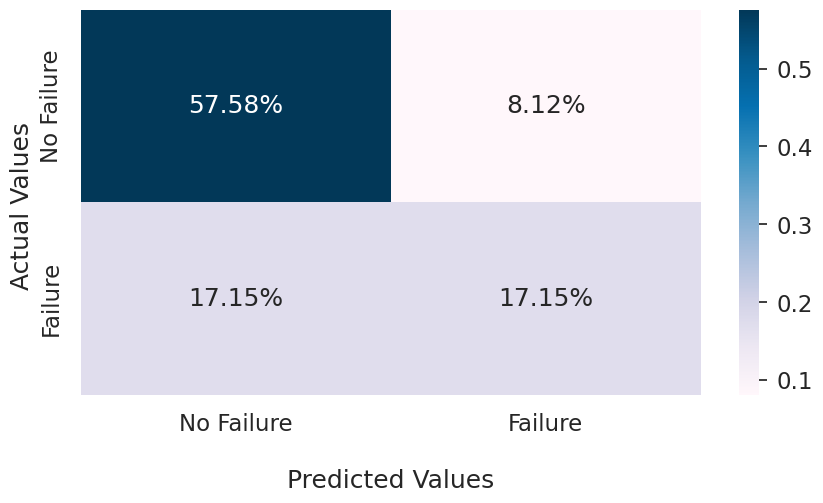

In [166]:
con_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,5))
ax = sns.heatmap(con_matrix/np.sum(con_matrix),fmt='.2%', annot=True, cmap='PuBu')
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');
ax.xaxis.set_ticklabels(['No Failure','Failure'])
ax.yaxis.set_ticklabels(['No Failure','Failure'])
plt.show()

#Assignment Questions and Answers

##Question 1: What are the data types? (Only numeric and categorical)
These are the datatypes of the dataset

Numerical - Id, Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, DiabetesPedigreeFunction,	Age

Categorical - Outcome

##Question 2 : Are there missing values?
No data is missing from any of the columns

##Question 3: What are the likely distributions of the numeric variables? and What are the distributions of the predictor variables?
Looking at QQ plot we can say only the variable Pregnancies, Glucose, Blood Pressure, SkinThickness, BMI and Age roughly follows normal distribution Insulin and DiabetesPedigreeFunction don't follow

##Question 4 : Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

The three methods used are Linear Regression, Random Forest Classifier and XBG Classifier. Glucose, BMI and Age are the three independnt variables most uselful to predict the target variable outcome.

##Question 5 : Which independent variables have missing data? How much?
Independent variables dont have missing data

##Question 6 : Do the training and test sets have the same data?
Observations:
Yes, the data in test and train is same.
The ratio of 80%-20% for train-test split appears to be distributed correctly for all the variables.

##Question 7 : In the predictor variables independent of all the other predictor variables?
Observations:

It is very clear from the heatmap that most of the variables are not dependent on each other

Degree of collinearity is significantly less for most variables

The correlation between Age and Pregnancies is 0.6 which is highest.
Except this all other correlations are quite low.

##Question 8 : Which predictor variables are the most important?

The variable having p-value = 0 are most important.

Hence Glucose, Blood Pressure, BMI and Age are the most important features in determing whether or not a person has diabetes.

##Question 9: Do the ranges of the predictor variables make sense?
Yes, the range does make sense.
Yes, the ranges make sense.

1) For age, all patients are at an age between 25-40, it makes sense because usually people at this age are more likely to have diabetes.

2) For Glucose level, the value lies between 100-135, it seems correct as people with diabetes have high glucose level.

3) BMI value ranges from 35-45, which is correct as most of the people having diabetes have BMI greater than 25.

4) Pregnancies value ranges from 2-6 which makes sense.

5) Diastolic blood pressure should br less than 80 for normal human being. Here the range is 100-135 which makes sense.

##Question 10 : Remove outliers and keep outliers (does if have an effect of the final predictive model)?
Yes, it does have a small difference in scores with and with out outliers.

##Question 11 : Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?
Calculated the error for 3 methods and 3 datasets. the three methods used are forward fill, mean and forward interpolation. We can conclude that forward fill imputation works best for imputing data on my dataset.

##Question 12 : What code is yours and what have you adapted?
Data cleaning, analysis method and visualizing data is my original code, model creation, feature selection, regression analysis and other parts refer to the following reference.



# Part 2 - H2O AutoML Diabetes Prediction


# H2O Initialization

In [167]:
min_mem_size=6
run_time=333

pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

2


In [168]:
port_no=random.randint(5555,55555)

try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no)
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:44810..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp25q3wk4f
  JVM stdout: /tmp/tmp25q3wk4f/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp25q3wk4f/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:44810
Connecting to H2O server at http://127.0.0.1:44810 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,1 month and 3 days
H2O_cluster_name:,H2O_from_python_unknownUser_knxvw3
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


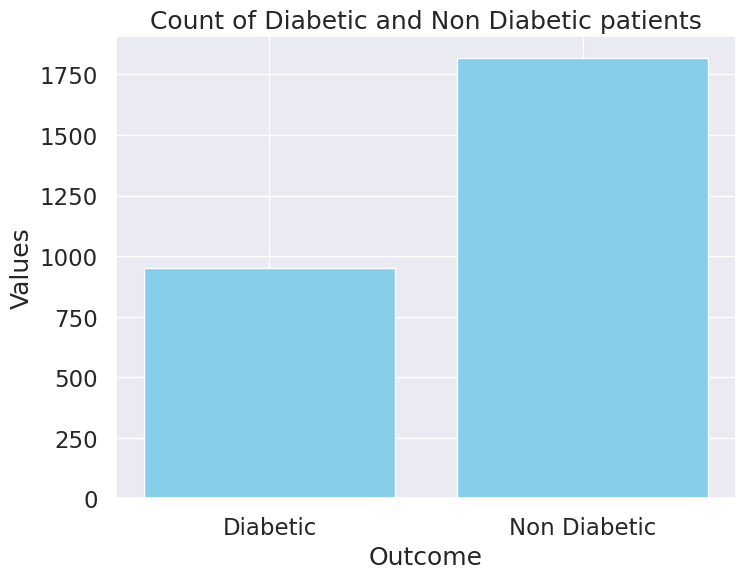

In [169]:
import matplotlib.pyplot as plt


categories = ['Diabetic', 'Non Diabetic']
values = [df[df['Outcome']==1].shape[0], df[df['Outcome']==0].shape[0]]


plt.figure(figsize=(8, 6))
plt.bar(categories, values, color='skyblue')


plt.title('Count of Diabetic and Non Diabetic patients')
plt.xlabel('Outcome')
plt.ylabel('Values')

plt.show()

The count of the non diabetic patients is almost double to the count of diabetic patients. However, the data is assumed to be correct for this assignment and I will explore the effect of this unbalance later.

In [170]:
import statsmodels.api as sm

In [171]:
x_columns = [col for col in df.columns if col!='Outcome']
y_column = 'Outcome'

In [172]:
X = df[x_columns]
y = df[y_column]

# Variance Inflation Factor (VIF)
It indicates the multi-collinearity among different independent variables. High VIF with values greater than 10 indicates that some independent variables are highly correlated with some other variables.

In [173]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
vif["variables"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif

,variables,VIF
0,Pregnancies,3.411629
1,Glucose,10.982131
2,BloodPressure,10.316628
3,SkinThickness,4.112049
4,Insulin,2.424107
5,BMI,7.525238
6,DiabetesPedigreeFunction,3.104923
7,Age,3.526227


"Glucose", "BloodPressure", "BMI" and "Age" have high VIF values, indicating potential multicollinearity issues. This suggests that these variables may be correlated with each other, and it might be necessary to further investigate their relationships in the regression model.

# Ordinary Least Squares (OLS)

In [174]:
model = sm.OLS(y, X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                Outcome   R-squared (uncentered):                   0.481
Model:                            OLS   Adj. R-squared (uncentered):              0.479
Method:                 Least Squares   F-statistic:                              319.6
Date:                Tue, 12 Dec 2023   Prob (F-statistic):                        0.00
Time:                        03:05:48   Log-Likelihood:                         -1543.0
No. Observations:                2768   AIC:                                      3102.
Df Residuals:                    2760   BIC:                                      3149.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Pregnancies                  0.0488      0.040      1.233      0.218      -0.029       0.126
Glucose                      0.5428      0.042     12.819      0.000       0.460       0.626
BloodPressure               -0.4514      0.049     -9.191      0.000      -0.548      -0.355
SkinThickness               -0.1029      0.040     -2.599      0.009      -0.181      -0.025
Insulin                     -0.0099      0.039     -0.253      0.800      -0.087       0.067
BMI                          0.3921      0.045      8.624      0.000       0.303       0.481
DiabetesPedigreeFunction     0.0499      0.036      1.373      0.170      -0.021       0.121
Age                          0.3805      0.042      9.032      0.000       0.298       0.463
==============================================================================
Omnibus:                     2301.595   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              290.709
Skew:                           0.523   Prob(JB):                     7.47e-64
Kurtosis:                       1.805   Cond. No.                         8.39
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

From the output, we can make the following references:

* **R-squared (uncentered): 0.481:** The R-squared value is a measure of how well the independent variables explain the variation in the dependent variable. In this case, about 48.1% of the variation in the dependent variable is explained by the independent variables.

* **Adj. R-squared (uncentered): 0.479:** The adjusted R-squared is a modified version of R-squared that takes into account the number of independent variables in the model. It penalizes for including unnecessary variables. Here, it's very close to the R-squared value, **indicating that the model is not overly complex**.

* **F-statistic: 319.6:** The F-statistic tests the overall significance of the model. In this case, it's very high, indicating that at least one of the independent variables is significantly related to the dependent variable. This makes sense, since we saw that Glucose has a high correlation with the outcome.

* **Prob (F-statistic): 0.00:** The probability associated with the F-statistic. A very low value (close to 0) indicates that the model as a whole is statistically significant.

* **Covariance Type: nonrobust:** This specifies the type of covariance estimator used in the regression analysis.

As can be seen from the above table, the P-values for SkinThickness, Insulin and Age is greater than 0.05 which reaafirms their high VIF values.


* **Omnibus:** The Omnibus statistic is 2301.595	. This indicates that the model's fit is being evaluated. The higher the Omnibus value, the worse the model fits the data. In this case, the relatively high value suggests that there may be room for improvement in the model's fit.

* **Durbin-Watson:** The Durbin-Watson statistic is 2.008. This value is close to 2, which indicates that there is likely no significant autocorrelation present in the residuals. This is good because it means that the residuals (errors) in the model are not correlated with each other.

* **Prob(Omnibus):** The probability associated with the Omnibus statistic is 0.000. This very low p-value suggests that the model does not fit the data well. In other words, the observed data is significantly different from what would be expected by chance under the model.

* **Jarque-Bera (JB):** The Jarque-Bera statistic is 290.709. Like the Omnibus, this statistic evaluates the model's fit. A higher JB value indicates a worse fit, which is the case here. The relatively high JB value further suggests that there may be room for improvement in the model's fit.

* **Skew:** The skewness value is 0.523. Skewness measures the asymmetry in the distribution of the residuals. A positive skewness value indicates a longer tail on the right side, meaning that the distribution of residuals is slightly skewed to the right.

* **Prob(JB):** The probability associated with the Jarque-Bera statistic is 7.47e-64, which is extremely low. This reinforces the indication from the JB statistic that the model does not fit the data well.

* **Kurtosis:** The kurtosis value is 1.805. Kurtosis measures the "tailedness" of the distribution of residuals. A value of 1.805 suggests that the tails are lighter than in a normal distribution.

* **Cond. No.:** The condition number is 8.39. This value is relatively low, which suggests that there is not a severe issue with multicollinearity in the model. A higher condition number would indicate a greater concern for multicollinearity.


All the above observations indicate a need for a more complex model and simple regressive models are unable to capture the patterns properly.

---
Let's see what happens by dropping the Insulin column.





In [175]:
X_new = [col for col in X.columns if col!='Insulin']

X_new_df = X[X_new]
X_new_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,BMI,DiabetesPedigreeFunction,Age
0,0.461538,0.743719,0.500000,0.555556,0.484277,0.493261,0.674419
1,0.076923,0.427136,0.411765,0.460317,0.264151,0.245283,0.232558
2,0.615385,0.919598,0.382353,0.000000,0.160377,0.533693,0.255814
3,0.076923,0.447236,0.411765,0.365079,0.311321,0.079964,0.000000
4,0.000000,0.688442,0.029412,0.555556,0.783019,0.353273,0.279070


Recalculating VIF:

In [176]:
vif = pd.DataFrame()
vif["variables"] = X_new_df.columns
vif["VIF"] = [variance_inflation_factor(X_new_df.values, i) for i in range(X_new_df.shape[1])]
vif

,variables,VIF
0,Pregnancies,3.387965
1,Glucose,10.337147
2,BloodPressure,10.032909
3,SkinThickness,3.271399
4,BMI,7.514833
5,DiabetesPedigreeFunction,3.052319
6,Age,3.524641


Recalculating OLS:

In [177]:
model = sm.OLS(y, X_new_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                Outcome   R-squared (uncentered):                   0.481
Model:                            OLS   Adj. R-squared (uncentered):              0.480
Method:                 Least Squares   F-statistic:                              365.4
Date:                Tue, 12 Dec 2023   Prob (F-statistic):                        0.00
Time:                        03:05:49   Log-Likelihood:                         -1543.0
No. Observations:                2768   AIC:                                      3100.
Df Residuals:                    2761   BIC:                                      3142.
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Pregnancies                  0.0496      0.039      1.259      0.208      -0.028       0.127
Glucose                      0.5402      0.041     13.152      0.000       0.460       0.621
BloodPressure               -0.4494      0.048     -9.279      0.000      -0.544      -0.354
SkinThickness               -0.1075      0.035     -3.043      0.002      -0.177      -0.038
BMI                          0.3926      0.045      8.641      0.000       0.303       0.482
DiabetesPedigreeFunction     0.0487      0.036      1.352      0.177      -0.022       0.119
Age                          0.3803      0.042      9.030      0.000       0.298       0.463
==============================================================================
Omnibus:                     2288.763   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              290.431
Skew:                           0.522   Prob(JB):                     8.58e-64
Kurtosis:                       1.806   Cond. No.                         7.86
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

---
Let's see what happens by dropping the Age column.





In [178]:
X_new = [col for col in X.columns if col!='Age']

X_new_df = X[X_new]
X_new_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction
0,0.461538,0.743719,0.500000,0.555556,0.000000,0.484277,0.493261
1,0.076923,0.427136,0.411765,0.460317,0.000000,0.264151,0.245283
2,0.615385,0.919598,0.382353,0.000000,0.000000,0.160377,0.533693
3,0.076923,0.447236,0.411765,0.365079,0.289231,0.311321,0.079964
4,0.000000,0.688442,0.029412,0.555556,0.516923,0.783019,0.353273


Recalculating VIF:

In [179]:
vif = pd.DataFrame()
vif["variables"] = X_new_df.columns
vif["VIF"] = [variance_inflation_factor(X_new_df.values, i) for i in range(X_new_df.shape[1])]
vif

,variables,VIF
0,Pregnancies,2.454583
1,Glucose,10.904219
2,BloodPressure,9.990520
3,SkinThickness,4.084540
4,Insulin,2.423016
5,BMI,7.521768
6,DiabetesPedigreeFunction,3.103589


Recalculating OLS:

In [180]:
model = sm.OLS(y, X_new_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                Outcome   R-squared (uncentered):                   0.466
Model:                            OLS   Adj. R-squared (uncentered):              0.464
Method:                 Least Squares   F-statistic:                              343.6
Date:                Tue, 12 Dec 2023   Prob (F-statistic):                        0.00
Time:                        03:05:49   Log-Likelihood:                         -1583.3
No. Observations:                2768   AIC:                                      3181.
Df Residuals:                    2761   BIC:                                      3222.
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Pregnancies                  0.2380      0.034      6.992      0.000       0.171       0.305
Glucose                      0.5750      0.043     13.434      0.000       0.491       0.659
BloodPressure               -0.3725      0.049     -7.598      0.000      -0.469      -0.276
SkinThickness               -0.1322      0.040     -3.301      0.001      -0.211      -0.054
Insulin                     -0.0024      0.040     -0.061      0.952      -0.080       0.076
BMI                          0.3833      0.046      8.312      0.000       0.293       0.474
DiabetesPedigreeFunction     0.0567      0.037      1.538      0.124      -0.016       0.129
==============================================================================
Omnibus:                     5194.014   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              349.651
Skew:                           0.595   Prob(JB):                     1.19e-76
Kurtosis:                       1.728   Cond. No.                         8.05
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

My assumption that Insulin or Age might be contributing to other high values fails since dropping them does not reduce the other values. Continuing forward, I keep the Insulin and Age columns. Similar approach can be conducted for the other columns which have high values, but I keep that for future exploration.

#Regularization

In [181]:

#Spliting data into Training 70%, Test set 30%

X_train, X_test, y_train, y_test = tts(X, y, test_size=0.3, random_state=1)

In [182]:
# Ridge regression with an alpha of 0.5
ridge = Ridge(fit_intercept=True, alpha=0.5)
ridge.fit(X_train, y_train)

Ridge(alpha=0.5)

In [183]:
# rmse after regularization
y_pred = ridge.predict(X_test)

rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
rmse

0.41730918784234877

# Pairplot

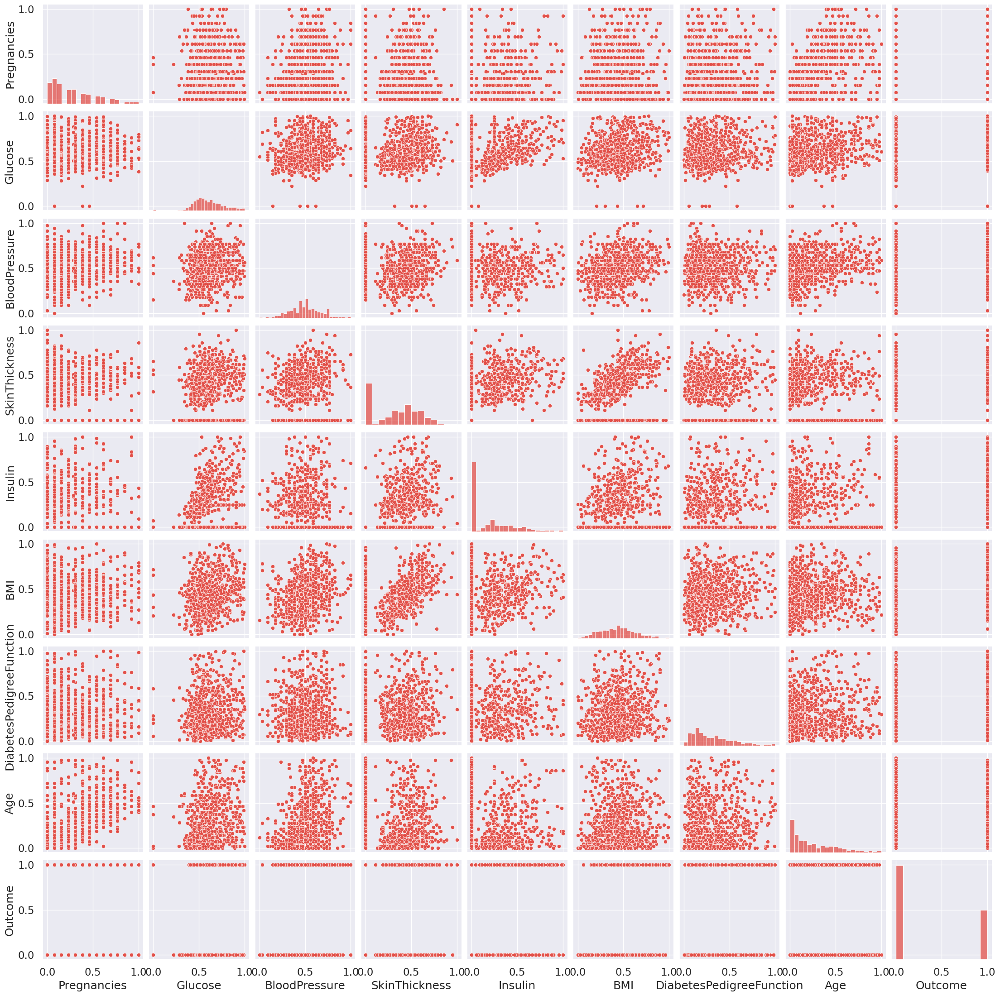

In [184]:
sns.pairplot(df)

# H2O AutoML

In [185]:
df[df["Outcome"]==1]["Outcome"]="Yes"
df[df["Outcome"]==0]["Outcome"]="No"

h2o_df = h2o.H2OFrame(df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [186]:
h2o_df["Outcome"] = h2o_df["Outcome"].asfactor()

In [187]:
h2o_df.head()

Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0.461538,0.743719,0.5,0.555556,0,0.484277,0.493261,0.674419,1
0.0769231,0.427136,0.411765,0.460317,0,0.264151,0.245283,0.232558,0
0.615385,0.919598,0.382353,0,0,0.160377,0.533693,0.255814,1
0.0769231,0.447236,0.411765,0.365079,0.289231,0.311321,0.0799641,0,0
0,0.688442,0.0294118,0.555556,0.516923,0.783019,0.353273,0.27907,1
0.384615,0.582915,0.529412,0,0,0.232704,0.110512,0.209302,0
0.230769,0.39196,0.176471,0.507937,0.270769,0.402516,0.15274,0.116279,1
0.769231,0.577889,0.457859,0,0,0.537736,0.0503145,0.186047,0
0.153846,0.98995,0.470588,0.714286,0.246547,0.386792,0.0718778,0.744186,1
0.615385,0.628141,0.852941,0,0,0.438283,0.138365,0.767442,1


In [188]:
train, test = h2o_df.split_frame([0.8])

In [189]:
aml = H2OAutoML(max_models = 25, max_runtime_secs = run_time, seed = 1)

In [190]:
aml.train(x = x_columns, y = y_column, training_frame=train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20231212_30645


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    41                 41                          104603                 14           20           16.878        180           220           197.976

ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.015252747823595954
RMSE: 0.12350201546369984
LogLoss: 0.06976012753434638
Mean Per-Class Error: 0.010394098461371666
AUC: 0.998987649413189
AUCPR: 0.9981878431370489
Gini: 0.9979752988263779

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4117647058823529
       0     1    Error    Rate
-----  ----  ---  -------  -------------
0      1453  13   0.0089   (13.0/1466.0)
1      9     746  0.0119   (9.0/755.0)
Total  1462  759  0.0099   (22.0/2221.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.411765     0.985469  142
max f2                       0.368421     0.987328  146
max f0point5                 0.615385     0.986395  120
max accuracy                 0.421053     0.990095  141
max precision                1            1         0
max recall                   0.0833333    1         228
max specificity              1            1         0
max absolute_mcc             0.411765     0.977963  142
max min_per_class_accuracy   0.411765     0.988079  142
max mean_per_class_accuracy  0.411765     0.989606  142
max tns                      1            1466      0
max fns                      1            419       0
max fps                      0            1466      300
max tps                      0.0833333    755       228
max tnr                      1            1         0
max fnr                      1            0.554967  0
max fpr                      0            1         300
max tpr                      0.0833333    1         228

Gains/Lift Table: Avg response rate: 33.99 %, avg score: 33.71 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.151283                    1                  2.94172   2.94172            1                1           1                           1                   0.445033        0.445033                   194.172   194.172            0.445033
2        0.204412                    0.933333           2.94172   2.94172            1                0.950823    1                           0.987218            0.156291        0.601325                   194.172   194.172            0.601325
3        0.300315                    0.789474           2.92791   2.93731            0.995305         0.872318    0.998501                    0.950526            0.280795        0.882119                   192.791   193.731            0.881437
4        0.40027                     0.148148           1.16609   2.495              0.396396         0.40482     0.848144                    0.814253            0.116556        0.998675                   16.6088   149.5              0.906588
5        0.500225                    0.0611471          0.013251  1.9991             0.0045045        0.0911952   0.679568                    0.669772      

In [191]:
aml.leaderboard

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
DRF_1_AutoML_1_20231212_30645,0.995792,0.113141,0.992998,0.0281723,0.163489,0.0267287
XRT_1_AutoML_1_20231212_30645,0.995606,0.114537,0.992914,0.0261856,0.163563,0.0267528
GBM_grid_1_AutoML_1_20231212_30645_model_1,0.994955,0.0727209,0.992909,0.0231359,0.139271,0.0193965
GBM_4_AutoML_1_20231212_30645,0.992726,0.0830839,0.989157,0.024679,0.148854,0.0221576
GBM_5_AutoML_1_20231212_30645,0.992466,0.0843877,0.98847,0.0284339,0.144887,0.0209922
GBM_3_AutoML_1_20231212_30645,0.992239,0.0842865,0.987477,0.0300597,0.147349,0.0217118
GBM_2_AutoML_1_20231212_30645,0.991258,0.0911357,0.983111,0.0303809,0.151581,0.0229768
GBM_grid_1_AutoML_1_20231212_30645_model_3,0.988396,0.103871,0.972179,0.0243181,0.154716,0.023937
GBM_grid_1_AutoML_1_20231212_30645_model_2,0.98769,0.11153,0.971249,0.02203,0.157813,0.0249049
XGBoost_grid_1_AutoML_1_20231212_30645_model_4,0.987437,0.136445,0.978311,0.032126,0.181602,0.0329795


#Comparing the top 2 best models

The models are ranked by a default metric based on the problem type (the second column of the leaderboard). In binary classification problems, that metric is AUC.
The models listed in the leaderboard are ranked based on their auc, where a higher value indicates better performance. The top row in the leaderboard represents the best-performing model with the highest auc. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is

DRF_1_AutoML_1_20231212_30645 with an auc of 0.995792

The second best model is

XRT_1_AutoML_1_20231212_30645 with an auc of 0.995606

In [192]:
leaderboard = aml.leaderboard.as_data_frame()

In [193]:
best_model = h2o.get_model(leaderboard.at[0, 'model_id'])

In [196]:
top_model = aml.leaderboard.as_data_frame().iloc[0]['model_id']
second_best_model = aml.leaderboard.as_data_frame().iloc[1]['model_id']


In [197]:
best_model = h2o.get_model(top_model)
second_best_model = h2o.get_model(second_best_model)


In [198]:
best_model.algo

'drf'

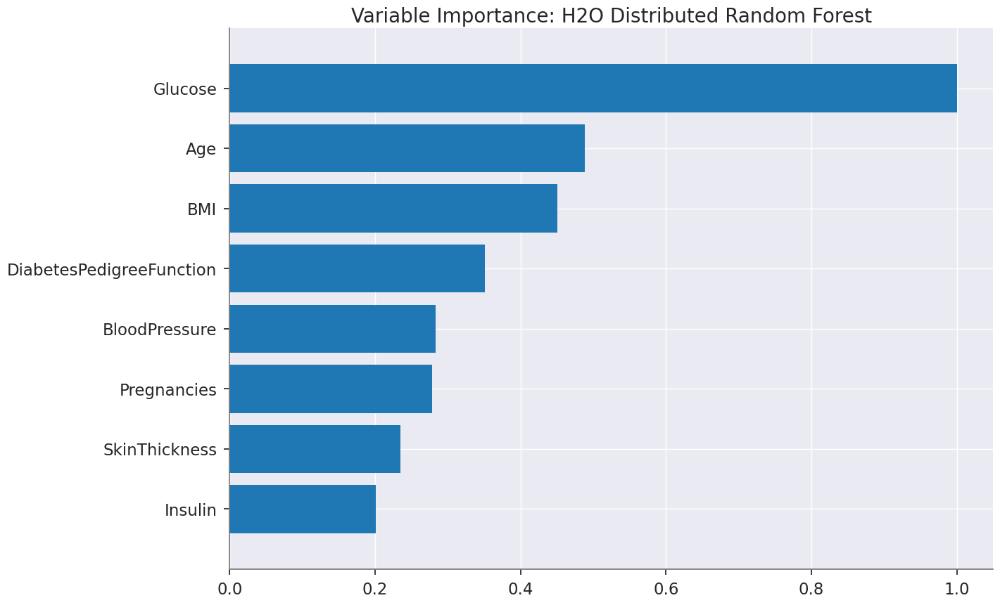

<Figure size 800x550 with 0 Axes>

In [200]:
best_model.varimp_plot()

In [201]:
best_model

Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_1_AutoML_1_20231212_30645


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    41                 41                          104603                 14           20           16.878        180           220           197.976

ModelMetricsBinomial: drf
** Reported on train data. **

MSE: 0.015252747823595954
RMSE: 0.12350201546369984
LogLoss: 0.06976012753434638
Mean Per-Class Error: 0.010394098461371666
AUC: 0.998987649413189
AUCPR: 0.9981878431370489
Gini: 0.9979752988263779

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4117647058823529
       0     1    Error    Rate
-----  ----  ---  -------  -------------
0      1453  13   0.0089   (13.0/1466.0)
1      9     746  0.0119   (9.0/755.0)
Total  1462  759  0.0099   (22.0/2221.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.411765     0.985469  142
max f2                       0.368421     0.987328  146
max f0point5                 0.615385     0.986395  120
max accuracy                 0.421053     0.990095  141
max precision                1            1         0
max recall                   0.0833333    1         228
max specificity              1            1         0
max absolute_mcc             0.411765     0.977963  142
max min_per_class_accuracy   0.411765     0.988079  142
max mean_per_class_accuracy  0.411765     0.989606  142
max tns                      1            1466      0
max fns                      1            419       0
max fps                      0            1466      300
max tps                      0.0833333    755       228
max tnr                      1            1         0
max fnr                      1            0.554967  0
max fpr                      0            1         300
max tpr                      0.0833333    1         228

Gains/Lift Table: Avg response rate: 33.99 %, avg score: 33.71 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.151283                    1                  2.94172   2.94172            1                1           1                           1                   0.445033        0.445033                   194.172   194.172            0.445033
2        0.204412                    0.933333           2.94172   2.94172            1                0.950823    1                           0.987218            0.156291        0.601325                   194.172   194.172            0.601325
3        0.300315                    0.789474           2.92791   2.93731            0.995305         0.872318    0.998501                    0.950526            0.280795        0.882119                   192.791   193.731            0.881437
4        0.40027                     0.148148           1.16609   2.495              0.396396         0.40482     0.848144                    0.814253            0.116556        0.998675                   16.6088   149.5              0.906588
5        0.500225                    0.0611471          0.013251  1.9991             0.0045045        0.0911952   0.679568                    0.669772      

In [202]:
X = df.drop("Outcome", axis = 1)
y = df["Outcome"]

In [203]:
X_train, X_test, y_train, y_test = tts(X, y, test_size = 0.2, random_state = 1)

In [204]:
model_normalized = sm.OLS(X_train, sm.add_constant(X_train)).fit()

In [205]:
y_pred = model_normalized.predict(sm.add_constant(X_test))

In [206]:
residuals = y_test - y_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 0           NaN
1           NaN
2           NaN
3           NaN
4       0.79094
         ...   
2745        NaN
2751        NaN
2758        NaN
2764        NaN
2765        NaN
Length: 560, dtype: float64


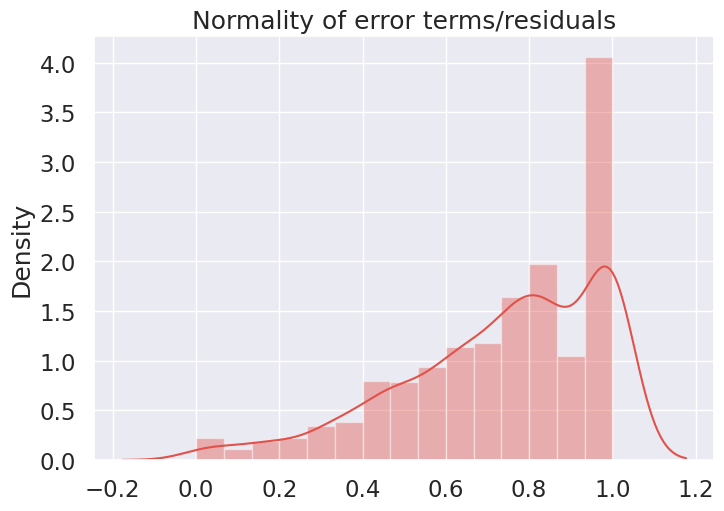

In [207]:
p = sns.distplot(residuals, kde=True)
p = plt.title('Normality of error terms/residuals')

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## DRF_1_AutoML_1_20231212_30645

,0,1,Error,Rate
0,347.0,3.0,0.0086,(3.0/350.0)
1,1.0,196.0,0.0051,(1.0/197.0)
Total,348.0,199.0,0.0073,(4.0/547.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

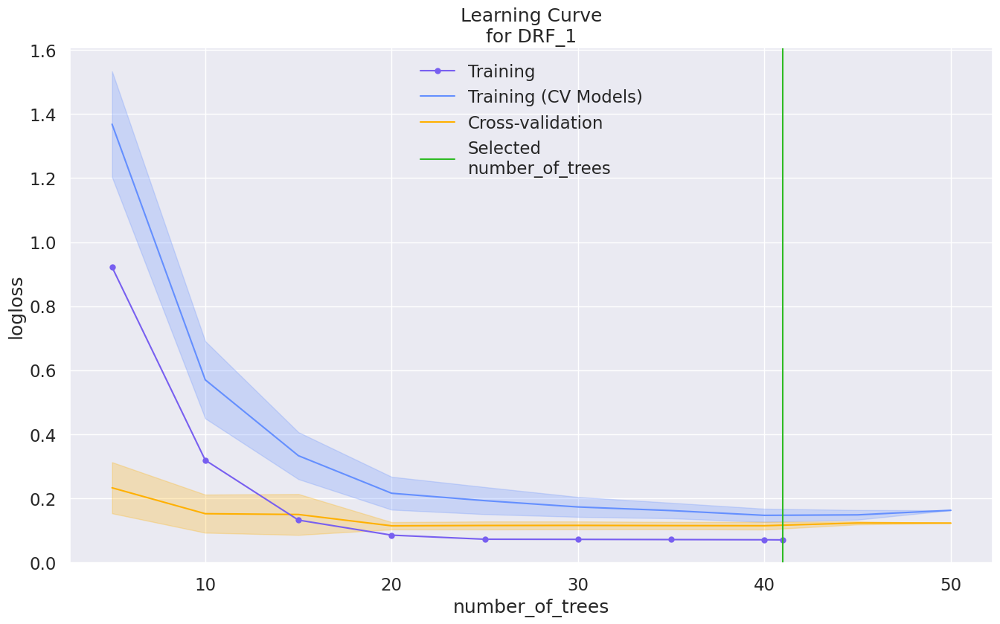

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

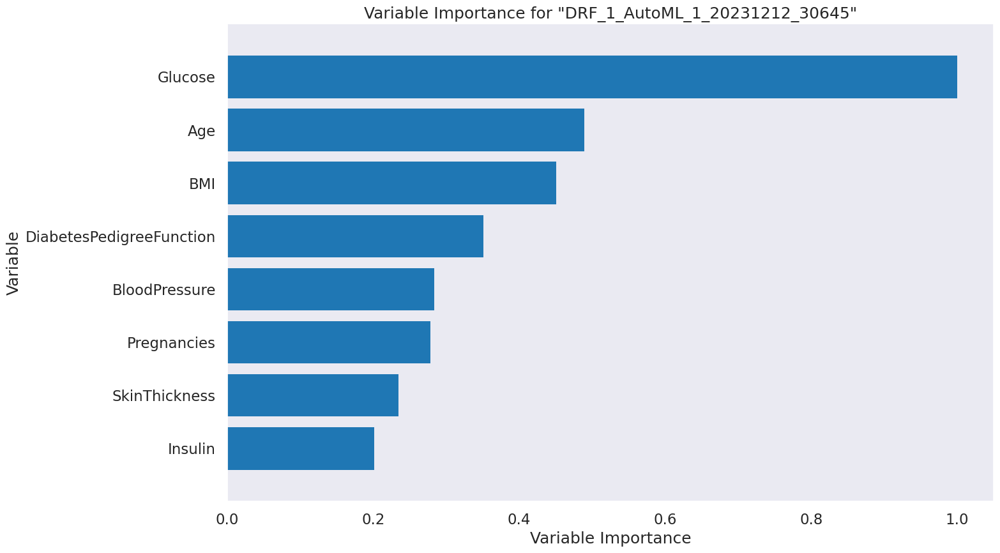

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

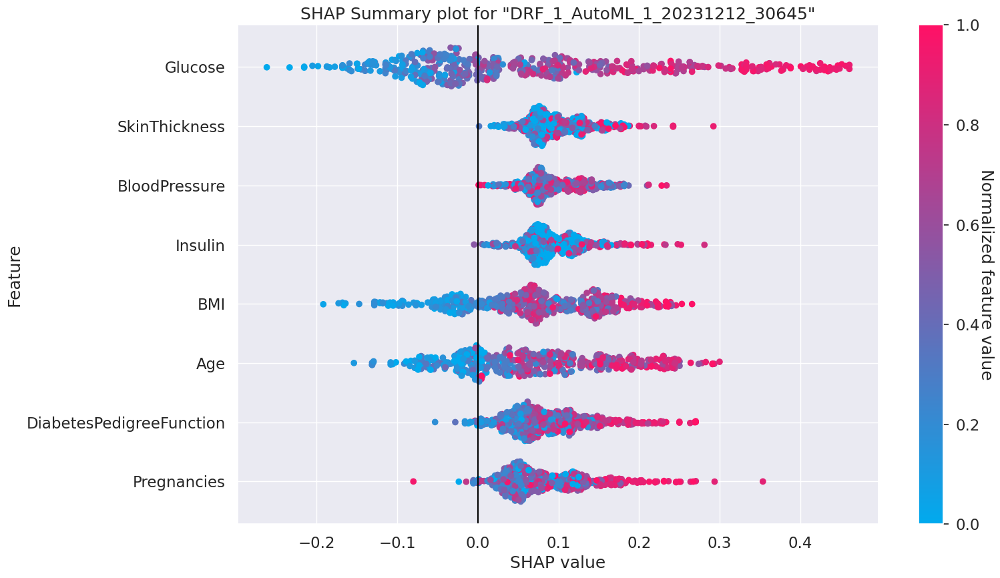

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

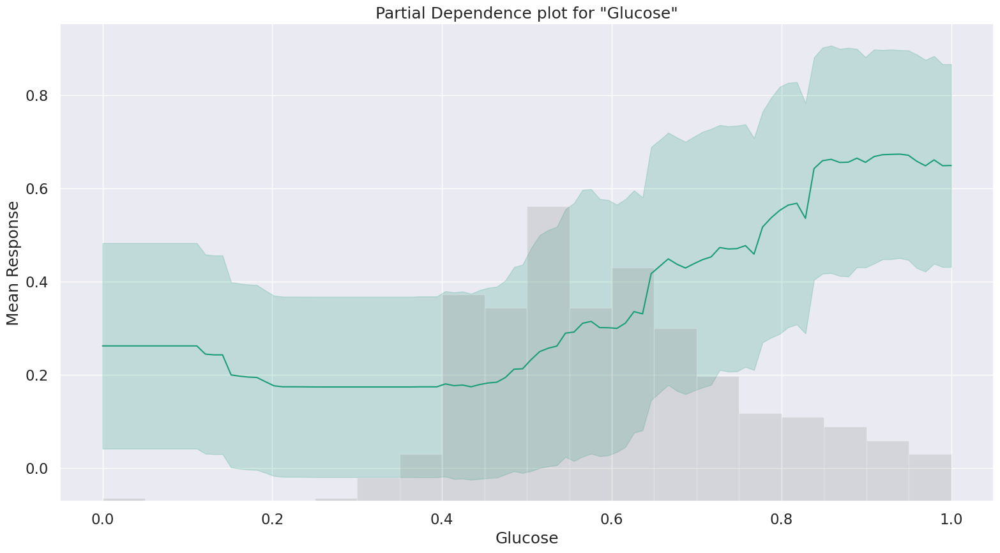

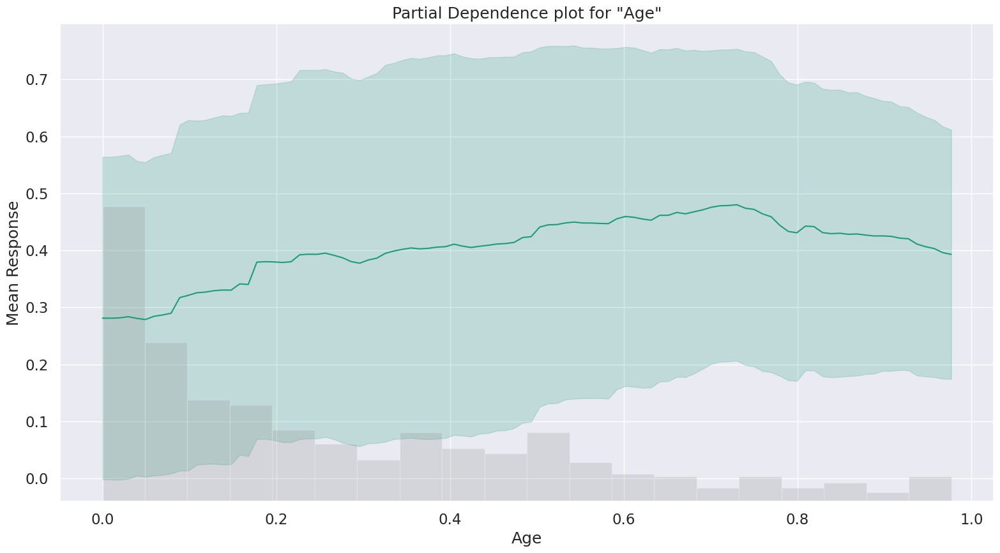

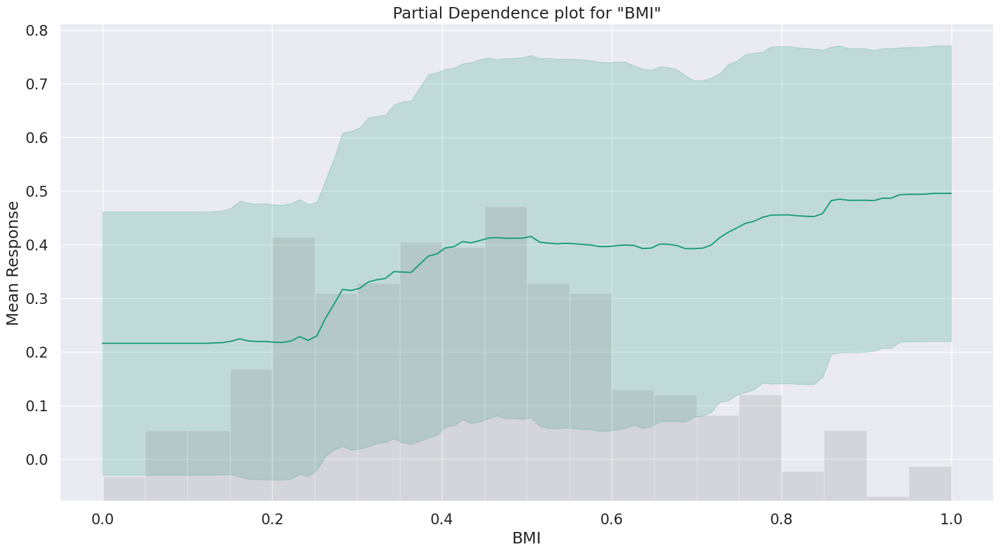

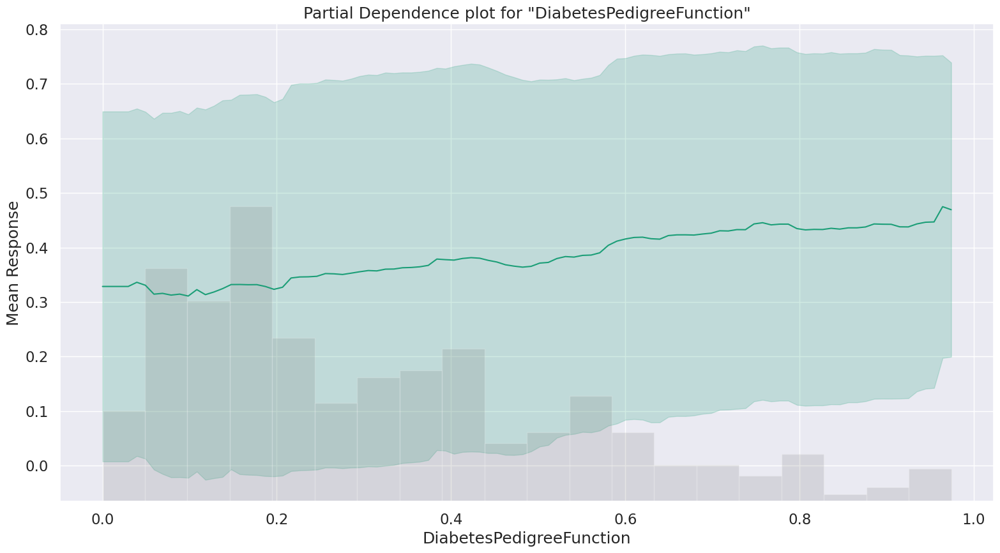

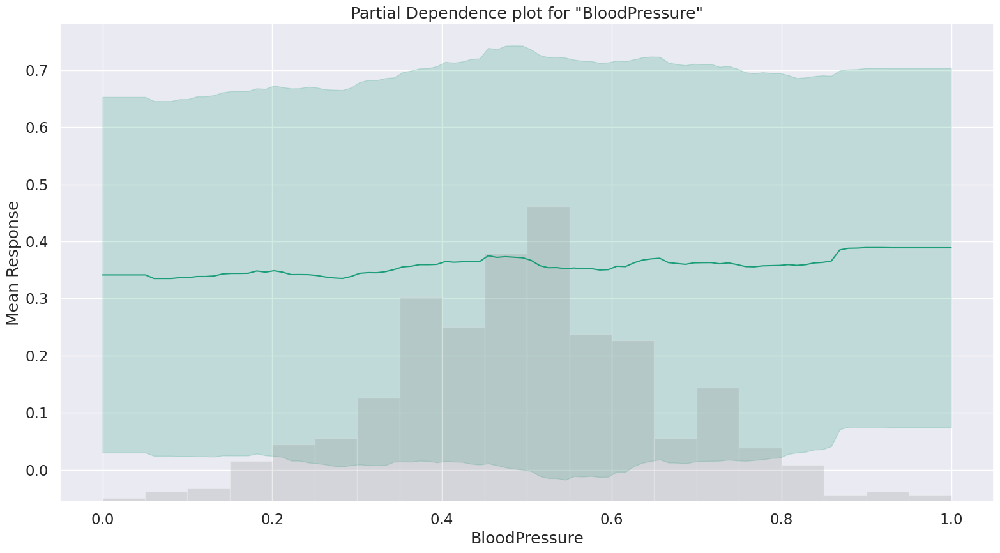

In [208]:
exa = best_model.explain(test)

# Hyperparameter Tuning



In [209]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

In [210]:
mode = RandomForestRegressor()
param_vals = {'max_depth': [200, 500, 800, 1100],
              'n_estimators': [100,200, 300, 400],
              'min_samples_split' : [2,3,5]}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,
                               n_iter=10, scoring='accuracy', cv=5,
                               refit=True, n_jobs=-1)

random_rf.fit(X_train, y_train)

preds = random_rf.best_estimator_.predict(X_test)

In [211]:
random_rf.best_params_

{'n_estimators': 200, 'min_samples_split': 3, 'max_depth': 1100}

# Assignment Question/Answers

1. **Is the relationship significant?** A relationship is said to be statistically significant when the p value for the variables is less than 0.05. P-value was calculated by two ways for this model. From the OLS method it was observed that values for 'SkinThickness', 'Insulin' and 'Age' were greater than 0.05. So, it can be concluded that other that p-value for all the variables of dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

2. **Are any model assumptions violated?**


* **Linear relationship -** The graph for dependent and independent variable needs to be linear by keeping other variables constant. When target variable is plotted against all other independent variables, linear relation is difficult to observe.

* **Homoscedasticity which means normality of the error distribution -** The plot for residuals should be normally distributed i.e., it should form a bell-curve shape. For this model the same is achieved.

* **Multicollinearity -** This can be determined by correlation matrix. For this model some of the assumptions are violated. Multicollinearity exists between variables some of the variables.

* **No autocorrelation can be determined with Durbin-Watson test -** Values between 1.5 to 2.5 signifies no autocorrelation. For this model the value is 2.058, therefore this assumption is not violated.


3. **Is there any multicollinearity in the model?** In this model some variables had VIF value greater than 10 and p-value was greater than 0.05. We tried dropping 'Insulin' and 'Age' columns but it did not change the values of other variables. There exists some multicollinearity in the model

4. **In the multivariate models are predictor variables independent of all the other predictor variables?** It can be observed in the correlation matrix that some correlation exists between 'Glucose' and 'Insulin'. High values of vif and p-values also indicate correlation between some of the variables.

5. **In multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.** From the variable importance graph, we can see the rankings of the variables for the predictors. The order is Glucose -> DiabetesPedigreeFunction -> Age -> BMI -> etc.

6. **Does the model make sense?** The model makes sense since it is able to make near accurate predictions. We can see from the confusion matrix that the mdoel only makes 3 mistakes for the test set.

7. **Does regularization help?** No, I found that the rmse for Ridge Regularization is 0.41 which is greater than the rmse of the best model.

8. **Which independent variables are significant?** Glucose is the most significant independent variable in predicting the outcome.

9. **Which hyperparameters are important?** {'n_estimators': 100, 'min_samples_split': 2, 'max_depth': 1100}



#Part 3 - Model Interpretability





#Question 1 - A) Fitting a Linear model

In [212]:
X = df.drop('Outcome', axis = 1)  # Training Feature
Y = df["Outcome"]  # Target


In [213]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

In [214]:
X.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [215]:

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [216]:
# OLS model Library
import statsmodels.formula.api as smf
results = smf.ols("Outcome ~ Pregnancies + Glucose + BloodPressure + SkinThickness + Insulin + BMI + DiabetesPedigreeFunction + Age",data=df).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Outcome   R-squared:                       0.294
Model:                            OLS   Adj. R-squared:                  0.292
Method:                 Least Squares   F-statistic:                     143.5
Date:                Tue, 12 Dec 2023   Prob (F-statistic):          4.55e-202
Time:                        03:16:43   Log-Likelihood:                -1385.7
No. Observations:                2768   AIC:                             2789.
Df Residuals:                    2759   BIC:                             2843.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                   -0.6832      0.037    -18.222      0.000      -0.757      -0.610
Pregnancies                  0.1524      0.038      4.031      0.000       0.078       0.227
Glucose                      1.1386      0.052     22.036      0.000       1.037       1.240
BloodPressure               -0.0552      0.051     -1.077      0.282      -0.156       0.045
SkinThickness                0.0097      0.038      0.255      0.799      -0.065       0.084
Insulin                     -0.0890      0.037     -2.386      0.017      -0.162      -0.016
BMI                          0.4675      0.043     10.832      0.000       0.383       0.552
DiabetesPedigreeFunction     0.1879      0.035      5.341      0.000       0.119       0.257
Age                          0.2544      0.040      6.295      0.000       0.175       0.334
==============================================================================
Omnibus:                      148.165   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              102.580
Skew:                           0.361   Prob(JB):                     5.31e-23
Kurtosis:                       2.393   Cond. No.                         12.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#Question 1 - B) Interpreting the Regression Coefficients

##**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.

As seen in the co-efficient coloumn in the above table

Value for the variable Glucose is highest = 1.1386
Followed by BMI = 0.4675
High absolute values of co-efficients can be used to get an idea of the importance of variables in a linear regression. Here, as stated above Glucose and BMI to be the most important variables to predict target i.e. Outcome.


##**P-Values**

If the p-value is 0.05 or lower, the result is considered as significant, but if it is higher than 0.05, the result is non-significant

All the variables except SkinThickness have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target variable Outcome.

##**Skew and Kurtosis**

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 0.361, 2.393 respectively.

##**Durbin-Watson**

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.

Value of 2 indicates that no auto correlation is detected
Value between 0 to 2 indicates that there is positive auto correlation detected
Value between 2 to 4 indicates that there is negatibe auto correlation detected
Our model has a DW score of 1.991 which could be interpreted as a positive auto-correlation in the residuals of regression.

##**Jarque-Bera Test**

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 102.580 which again re-inforces the interpretation we got from Skew and Kurtosis.

#Question 2 - A)Fitting Tree based model - Random Forest

In [217]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In [218]:
# Make predictions using the testing set
y_pred = tree_model.predict(x_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test, y_pred))
r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.15
Coefficient of determination: 0.32
R^2 score on test set = 0.3157137243904423


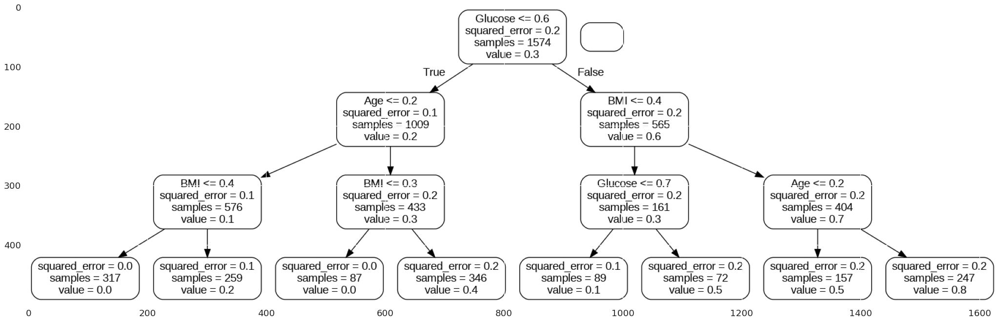

In [219]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

#Question 2 - B)Interpreting nodes of tree based model

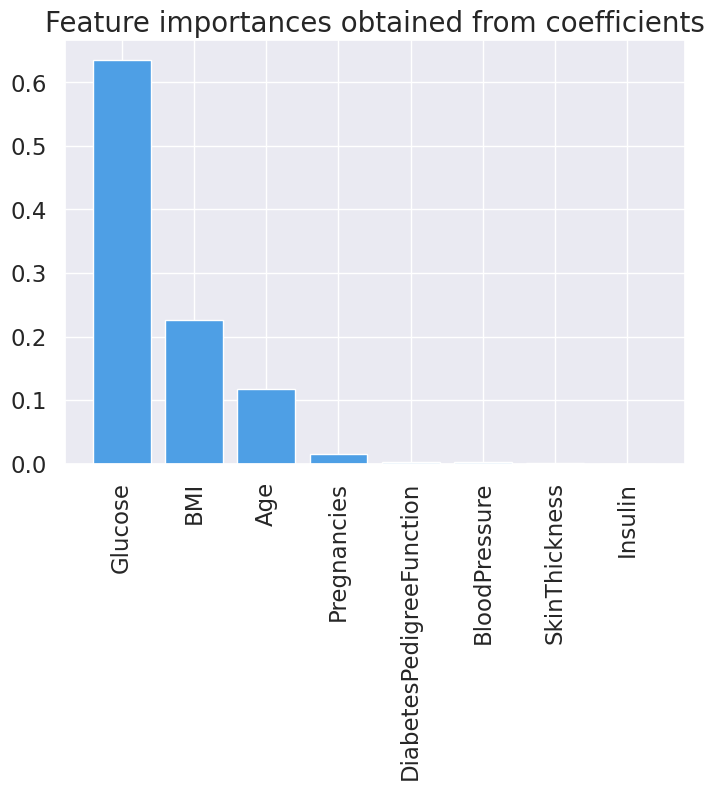

In [220]:
importances = pd.DataFrame(data={
    'Attribute': x_train.columns,
    'Importance': tree_model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)

plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#4E9FE5')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [221]:


# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [222]:

# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Glucose              Importance: 0.63
Variable: BMI                  Importance: 0.23
Variable: Age                  Importance: 0.12
Variable: Pregnancies          Importance: 0.01
Variable: BloodPressure        Importance: 0.0
Variable: SkinThickness        Importance: 0.0
Variable: Insulin              Importance: 0.0
Variable: DiabetesPedigreeFunction Importance: 0.0


#Queston 3) Using AutoML to find best model

In [223]:
pandas_hf = h2o.H2OFrame(df)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [224]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = pandas_hf.split_frame([pct_rows])

In [225]:

# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns

    y = "Outcome"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [226]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |
03:16:48.308: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██████
03:17:06.456: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


03:17:07.100: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

████
03:17:21.950: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
03:17:22.178: _response param, We hav

In [227]:

autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_2_20231212_31648,0.112979,0.0127642,0.0359768,0.0805838,0.0127642
StackedEnsemble_AllModels_3_AutoML_2_20231212_31648,0.113577,0.0128998,0.0347399,0.0807054,0.0128998
StackedEnsemble_BestOfFamily_3_AutoML_2_20231212_31648,0.11383,0.0129573,0.0358755,0.0809223,0.0129573
XGBoost_grid_1_AutoML_2_20231212_31648_model_2,0.114122,0.0130237,0.0343057,0.0815263,0.0130237
StackedEnsemble_BestOfFamily_2_AutoML_2_20231212_31648,0.114251,0.0130534,0.0358712,0.0811104,0.0130534
StackedEnsemble_AllModels_1_AutoML_2_20231212_31648,0.114667,0.0131485,0.0355747,0.0815084,0.0131485
StackedEnsemble_AllModels_2_AutoML_2_20231212_31648,0.114684,0.0131525,0.0354931,0.0817355,0.0131525
GBM_4_AutoML_2_20231212_31648,0.115663,0.013378,0.0392902,0.0828226,0.013378
XGBoost_1_AutoML_2_20231212_31648,0.118875,0.0141313,0.0317536,0.0844176,0.0141313
StackedEnsemble_BestOfFamily_1_AutoML_2_20231212_31648,0.118887,0.0141342,0.0338954,0.0844232,0.0141342


In [228]:

autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

3
Model Details
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_2_20231212_31648_model_2


Model Summary: 
    number_of_trees
--  -----------------
    94

ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 9.311324642698895e-05
RMSE: 0.009649520528346937
MAE: 0.003694251000114685
RMSLE: 0.00729848182390758
Mean Residual Deviance: 9.311324642698895e-05

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 0.013023748295712088
RMSE: 0.11412163815732794
MAE: 0.034305717368548726
RMSLE: 0.08152628620385749
Mean Residual Deviance: 0.013023748295712088

Cross-Validation Metrics Summary: 
                        mean       sd          cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  ---------  ----------  ------------  ------------  ------------  ------------  ------------
mae                     0.0343057  0.00628417  0.0354767     0.0316487     0.0417714     0.0251548     0.037477
mean_resi

In [229]:
autoML_model.predict

<bound method ModelBase.predict of H2OXGBoostEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'XGBoost_grid_1_AutoML_2_20231212_31648_model_2', 'type': 'Key<Model>', 'URL': '/3/Models/XGBoost_grid_1_AutoML_2_20231212_31648_model_2'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Frame>',

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

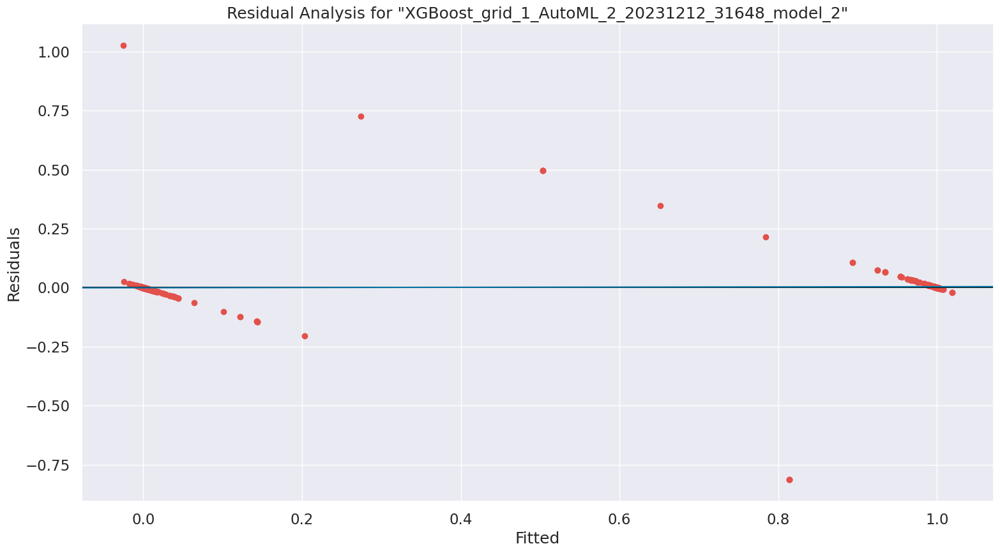

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

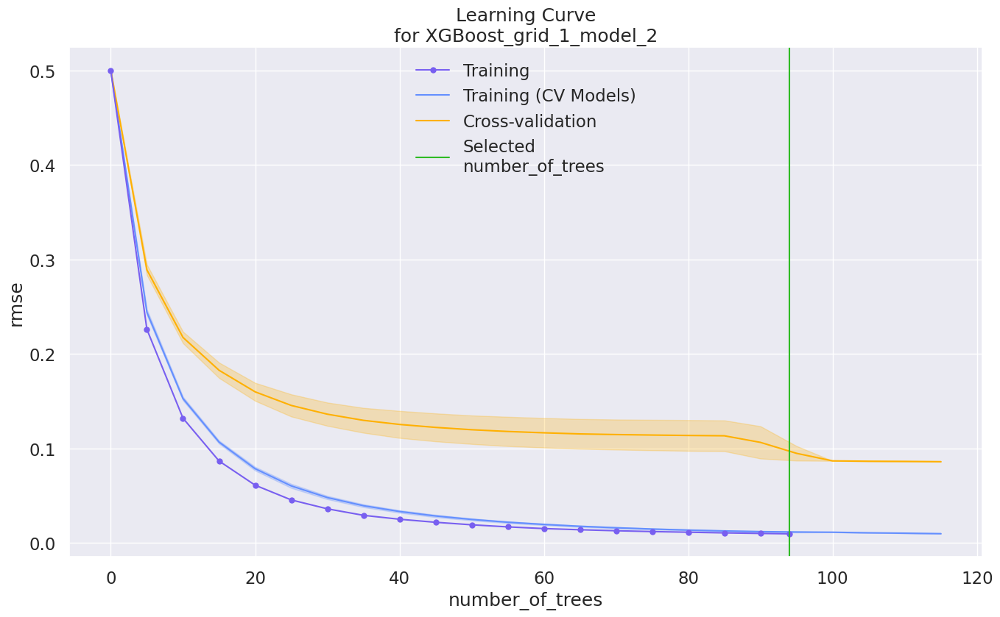

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

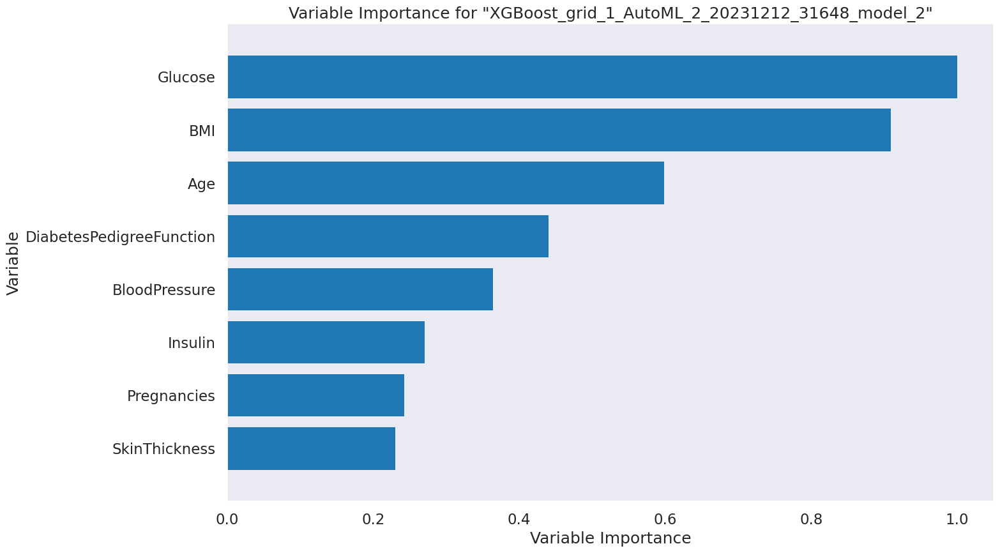

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

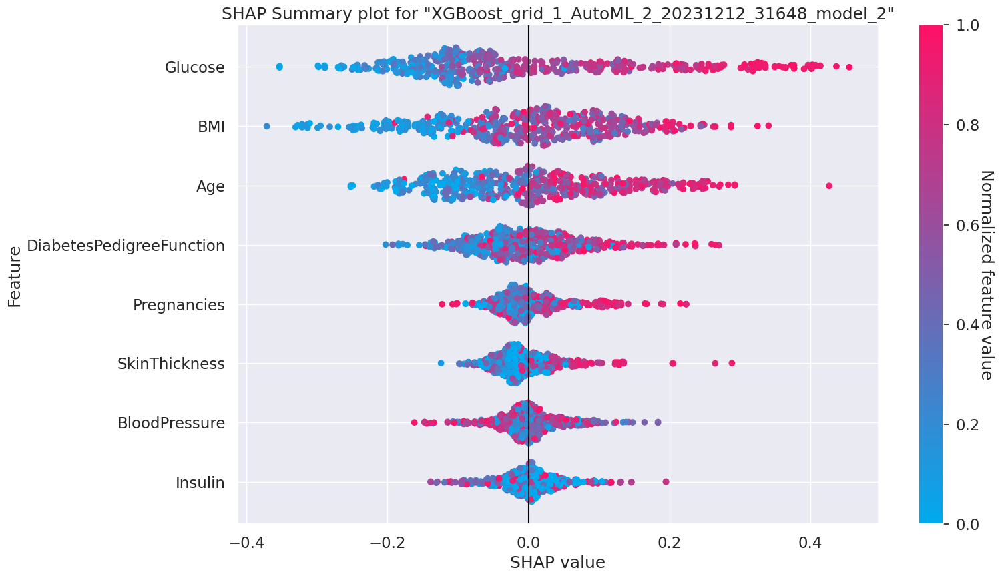

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

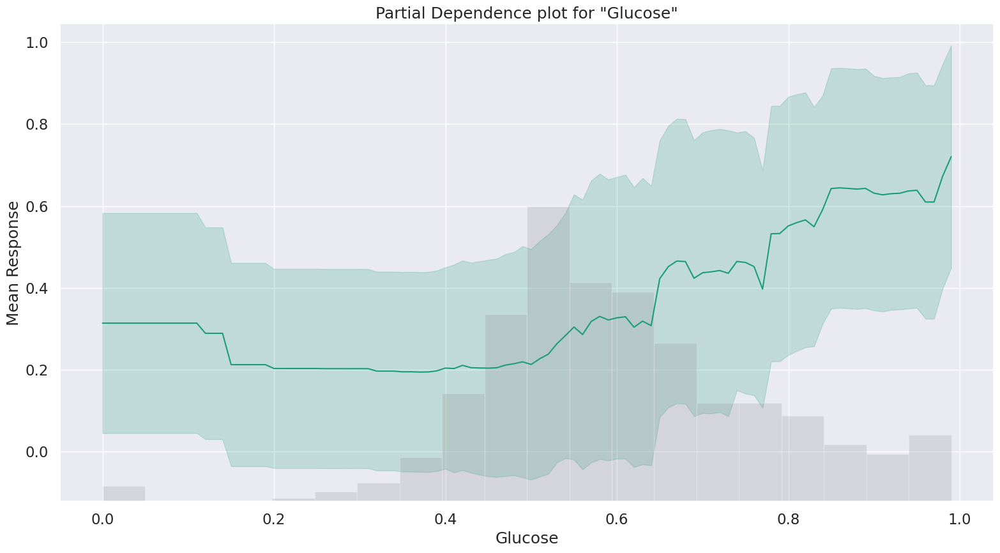

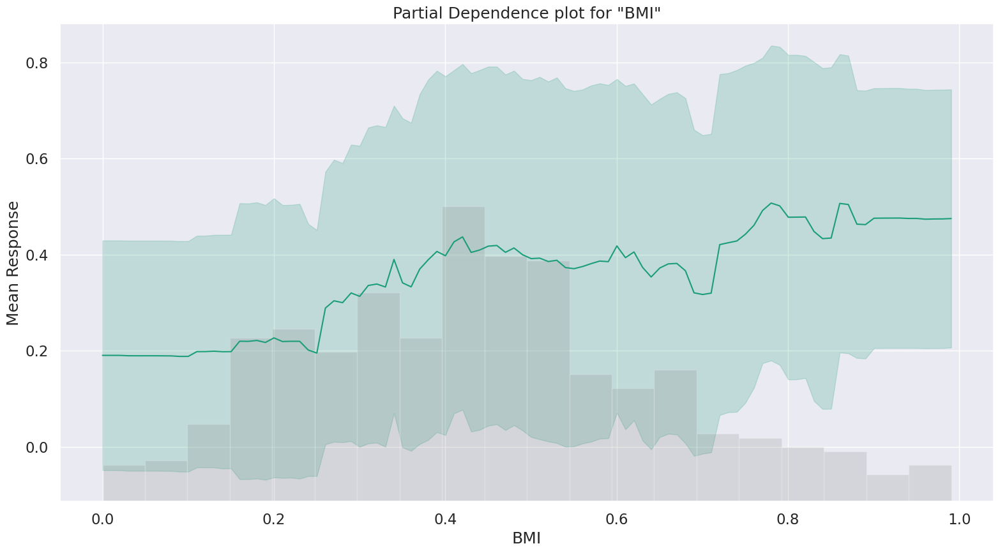

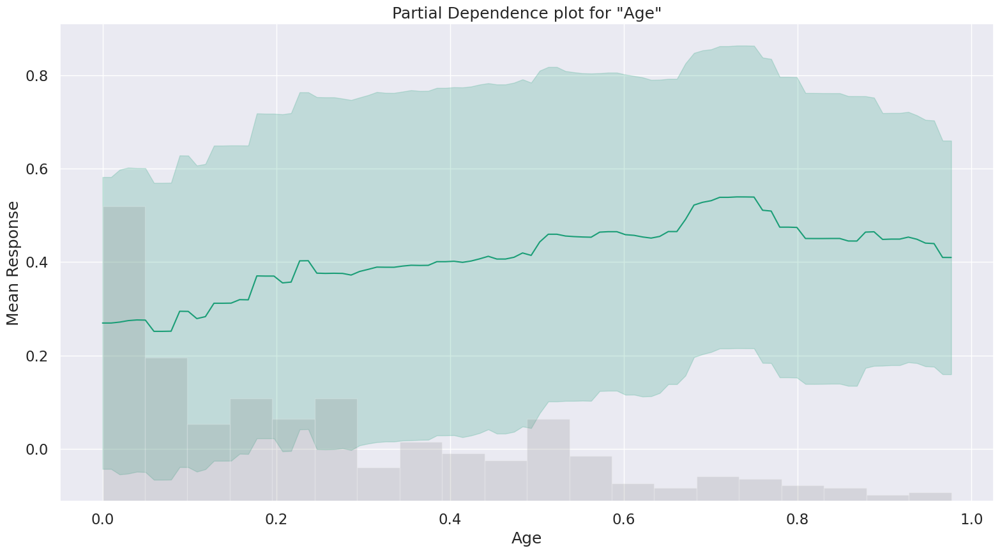

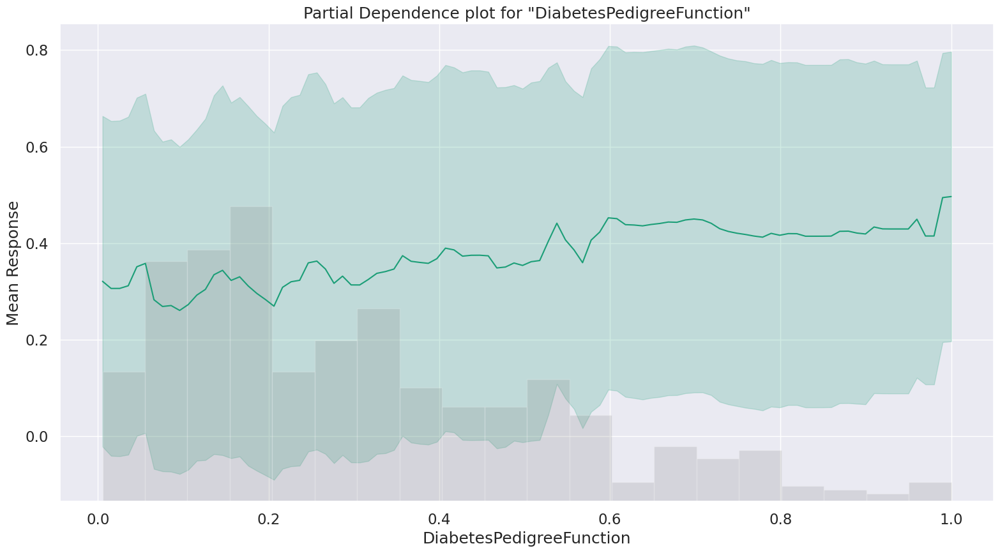

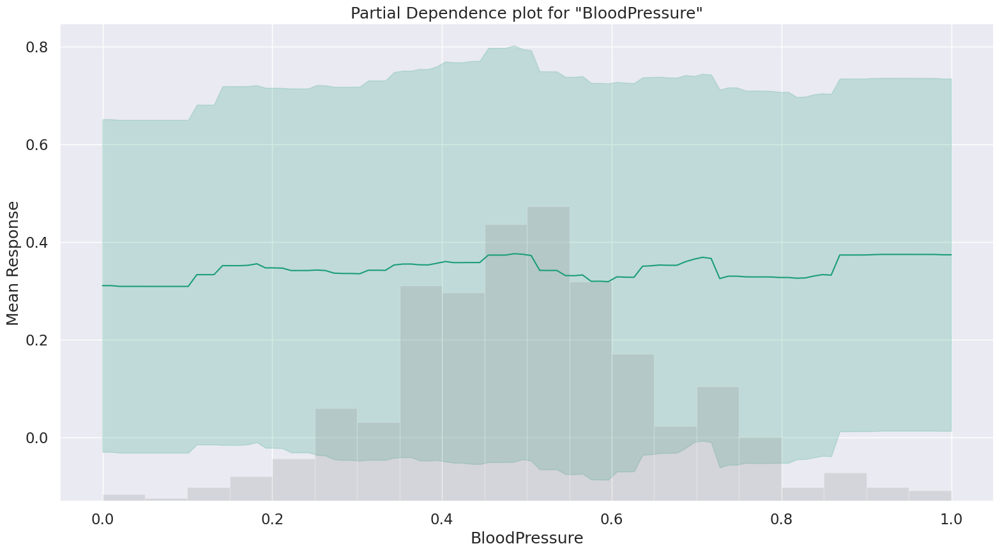

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

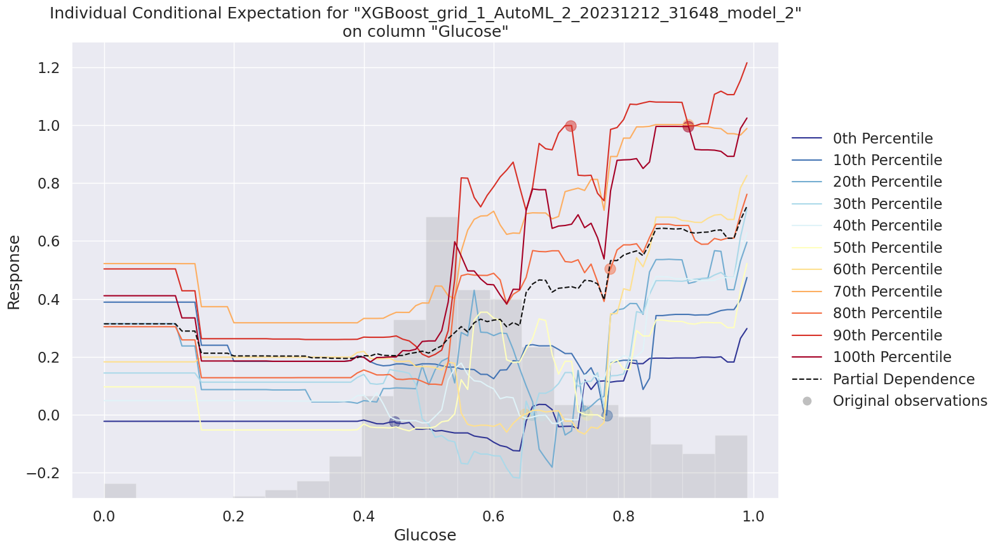

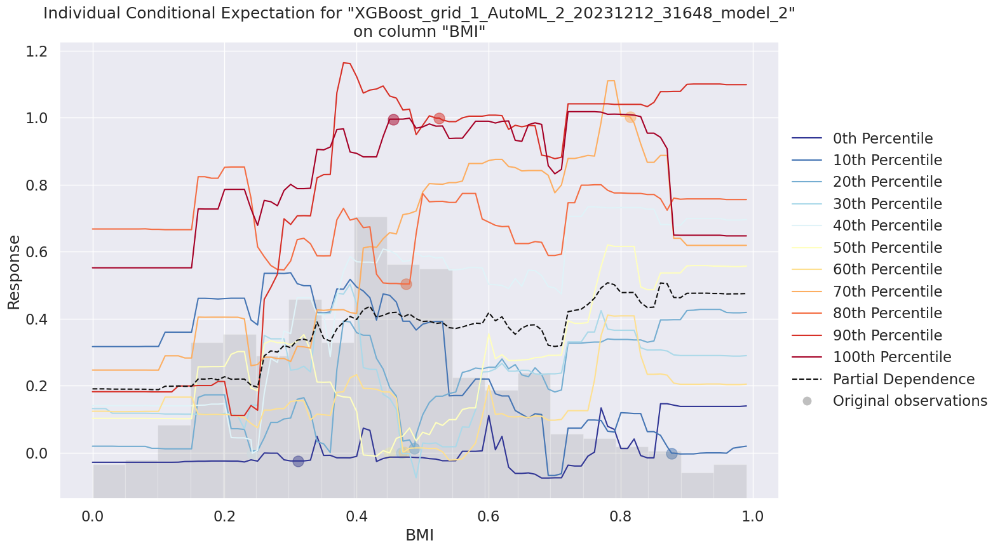

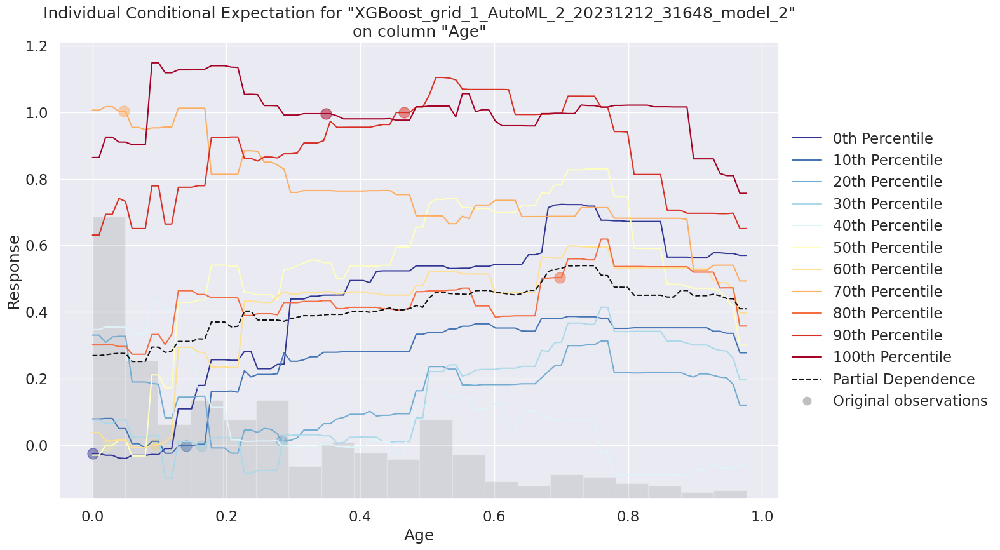

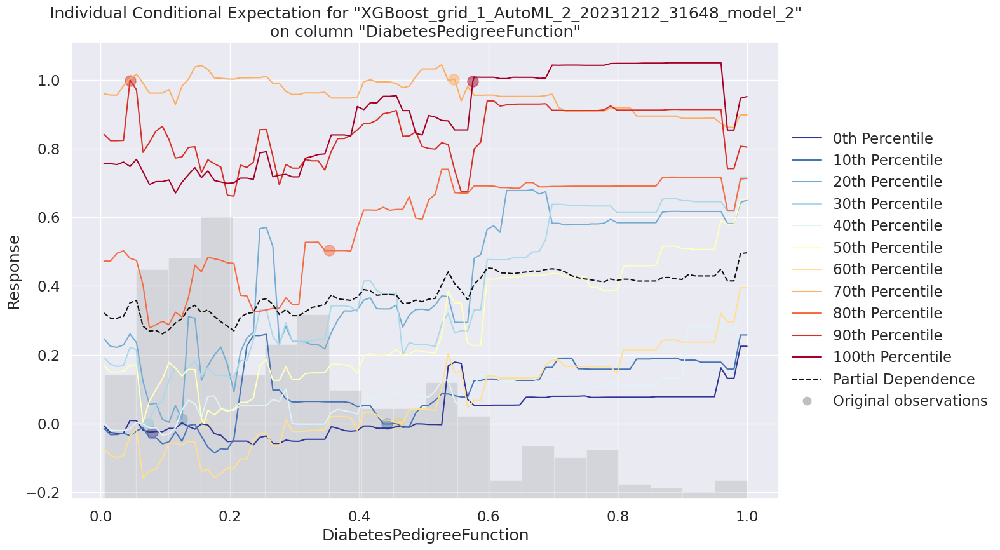

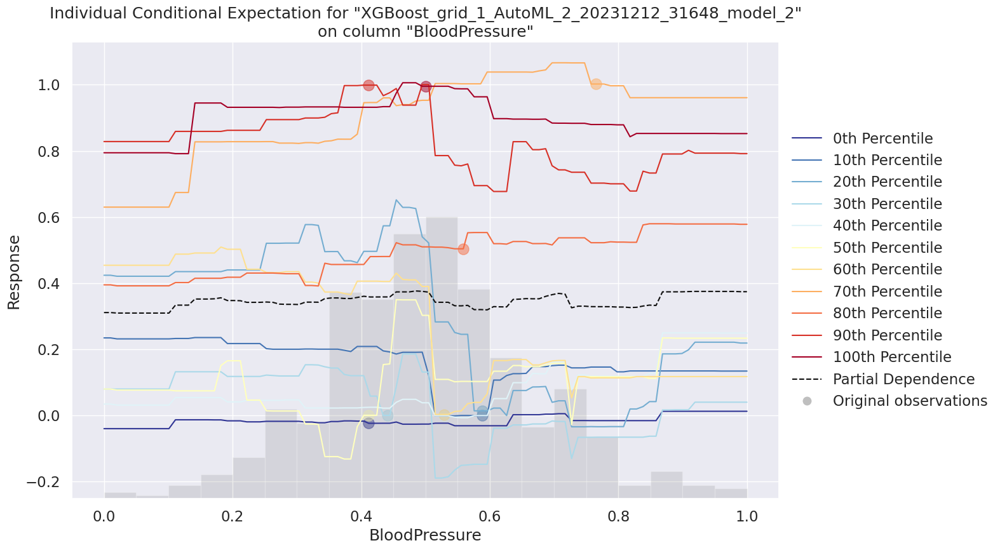

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

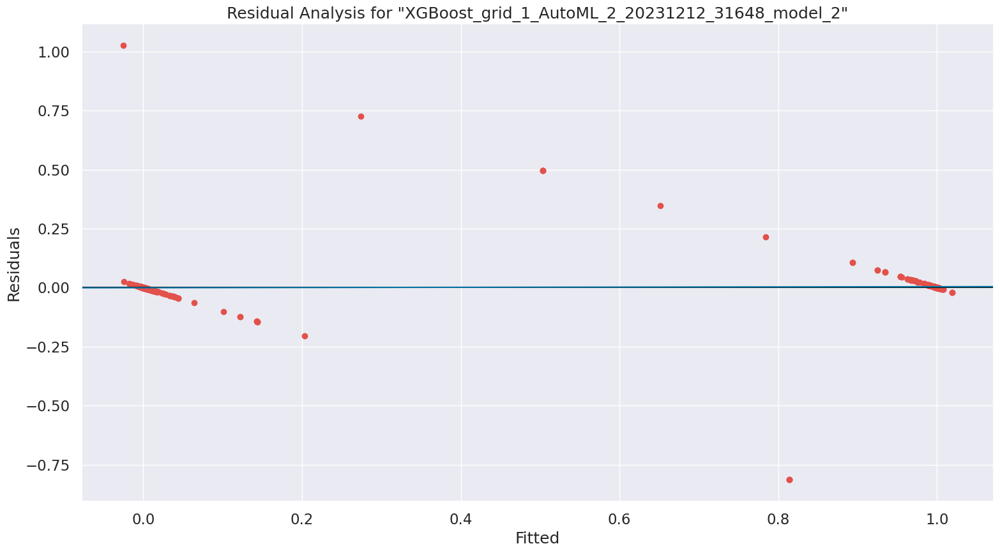

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

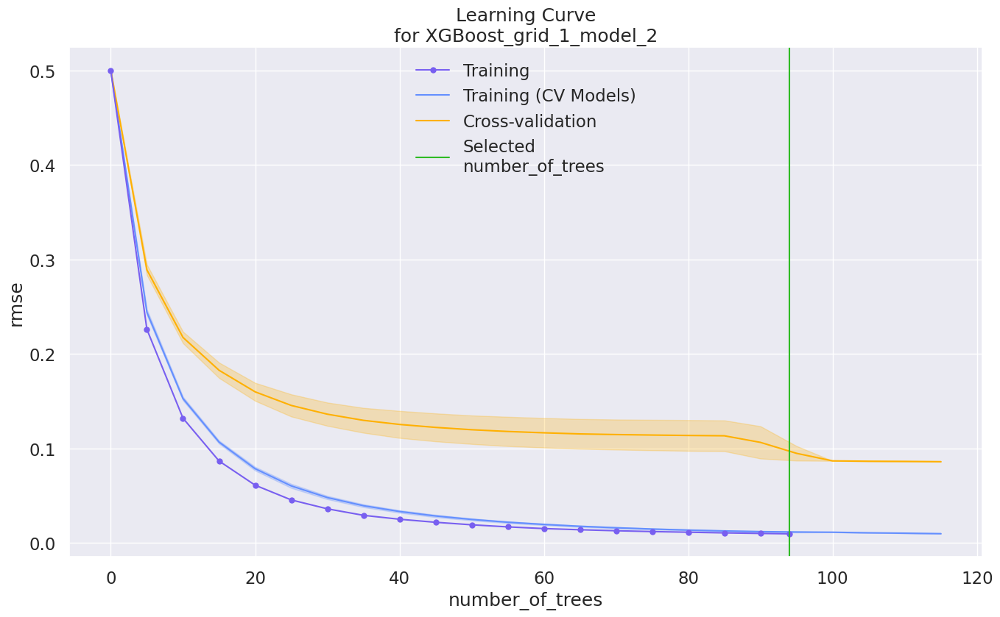

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

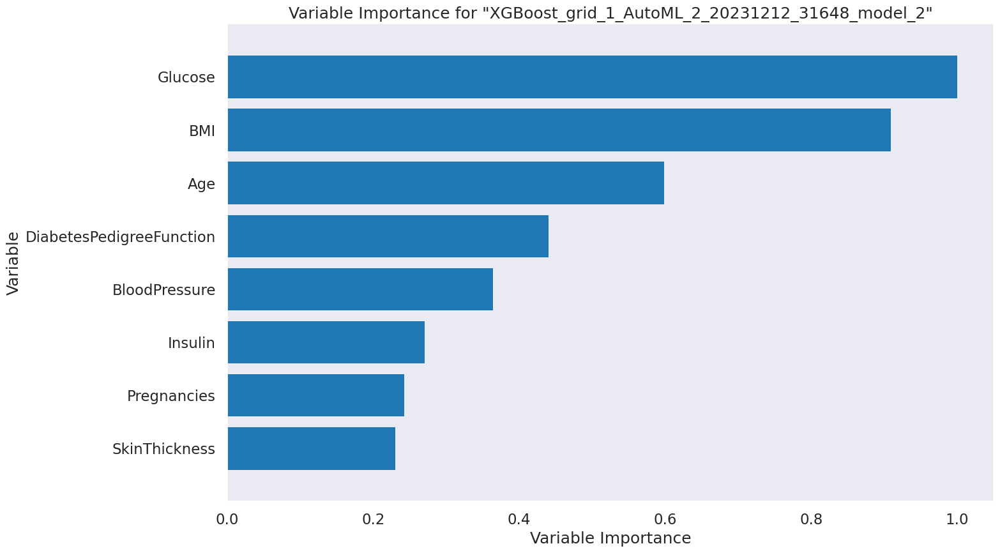

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

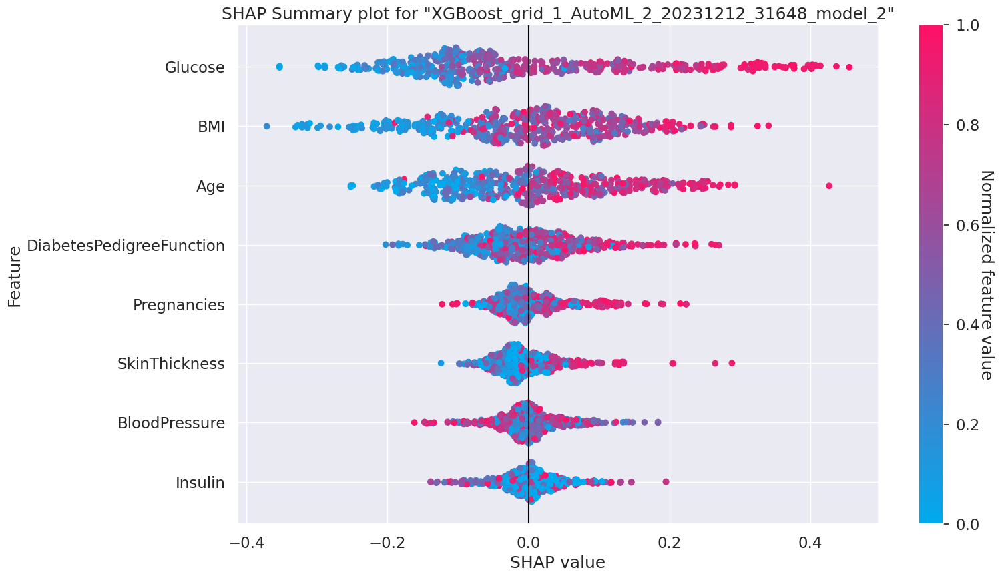

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

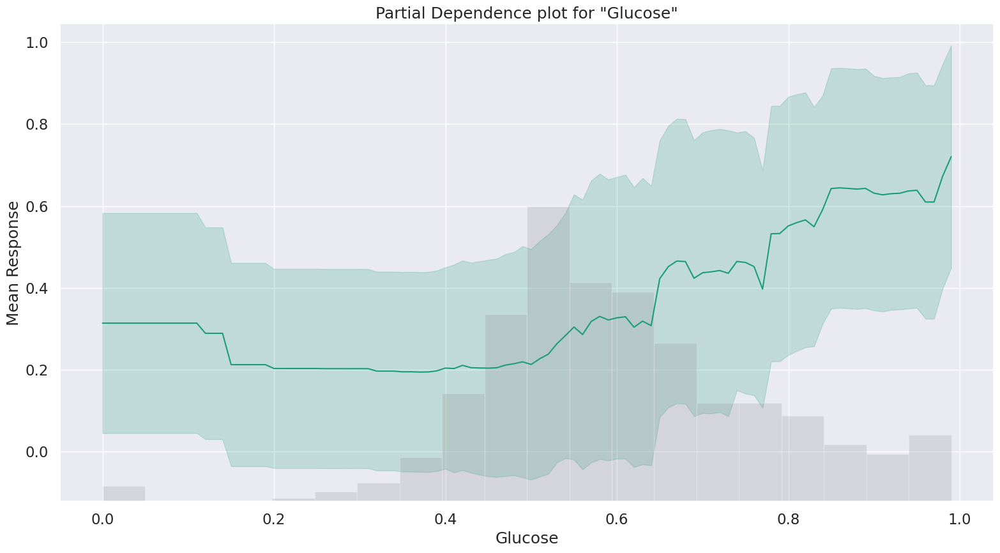

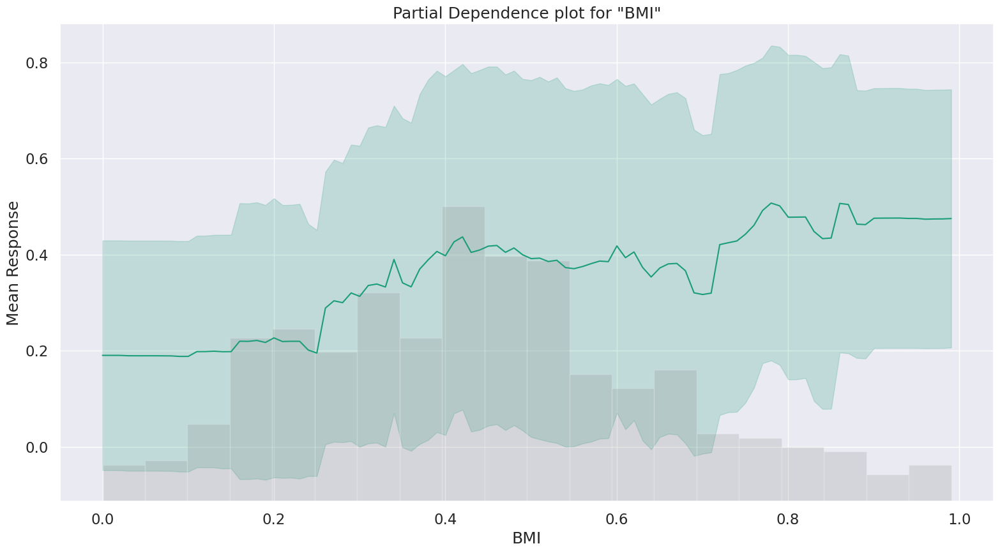

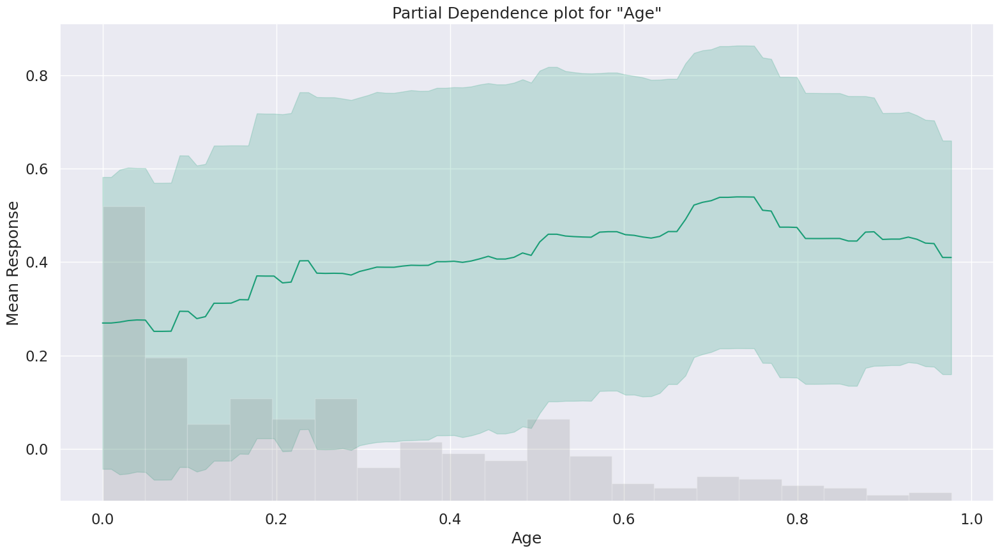

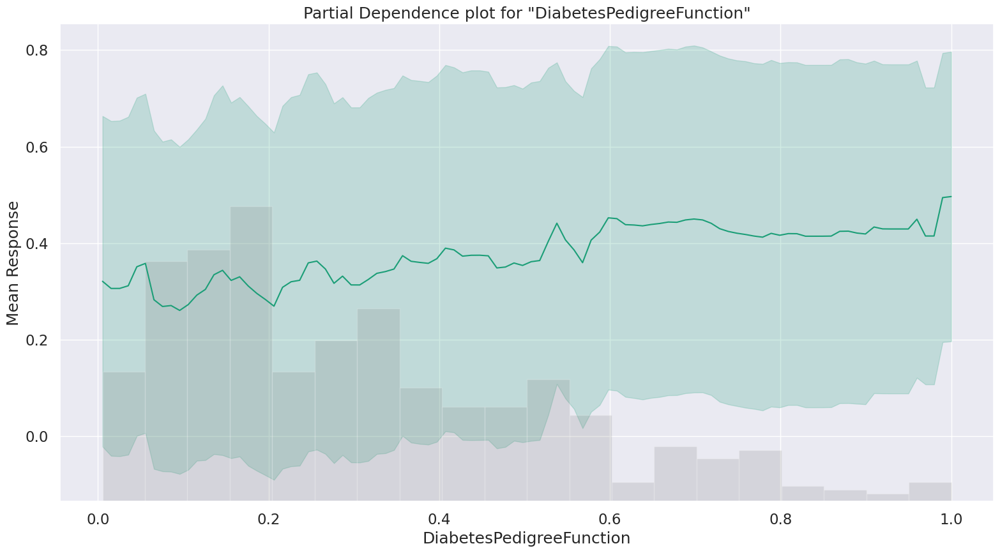

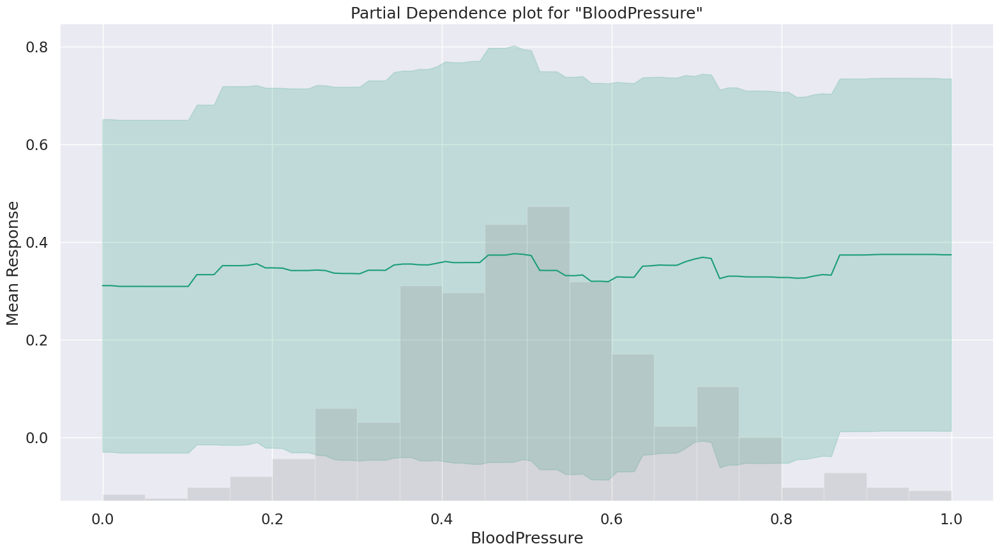

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

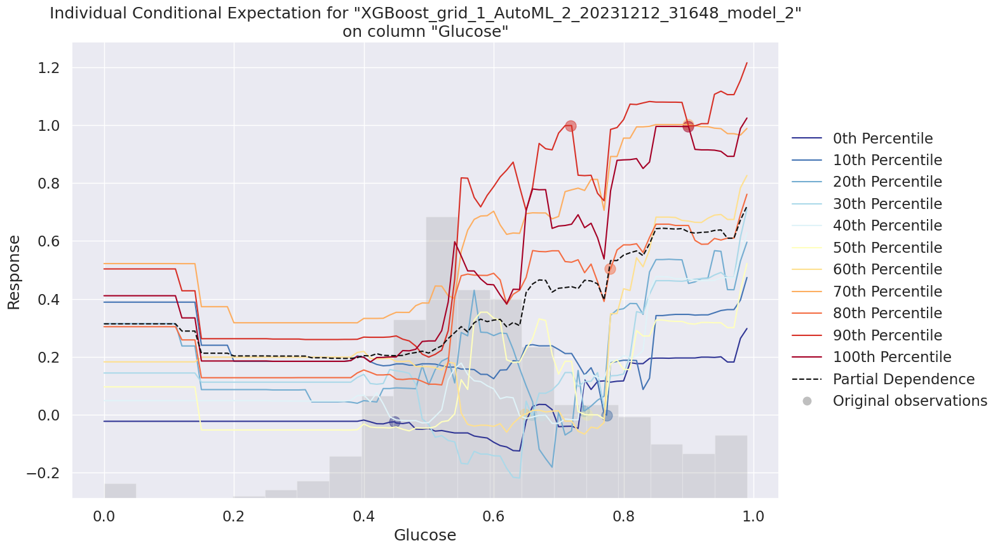

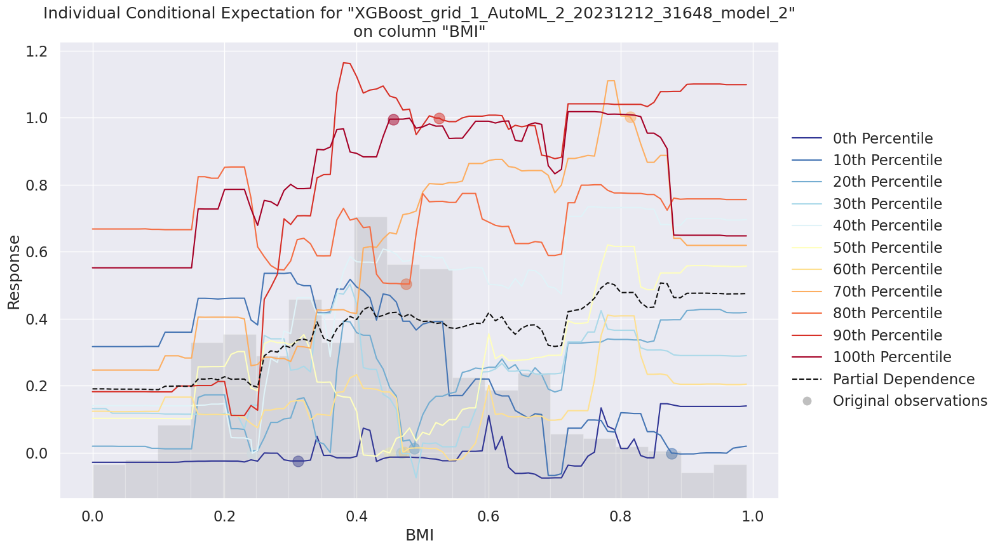

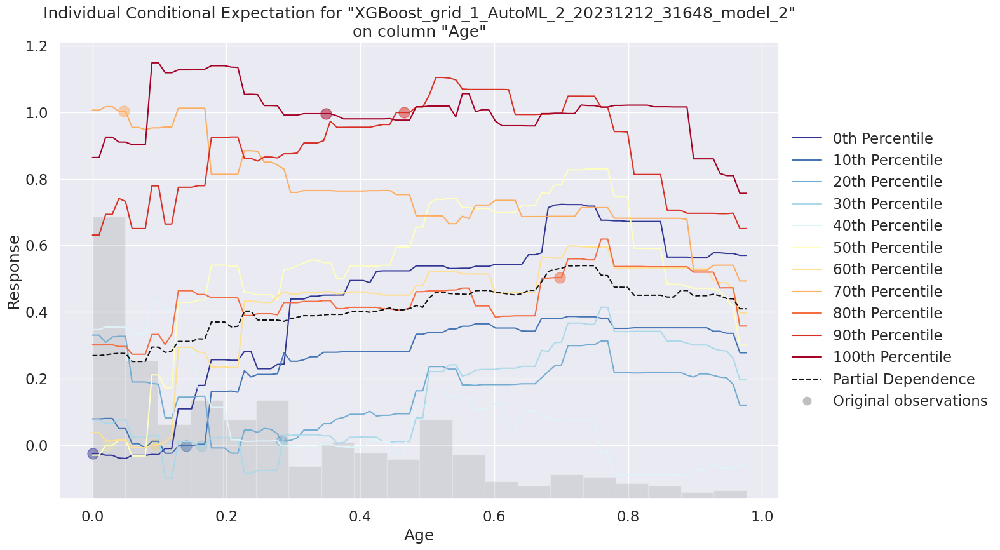

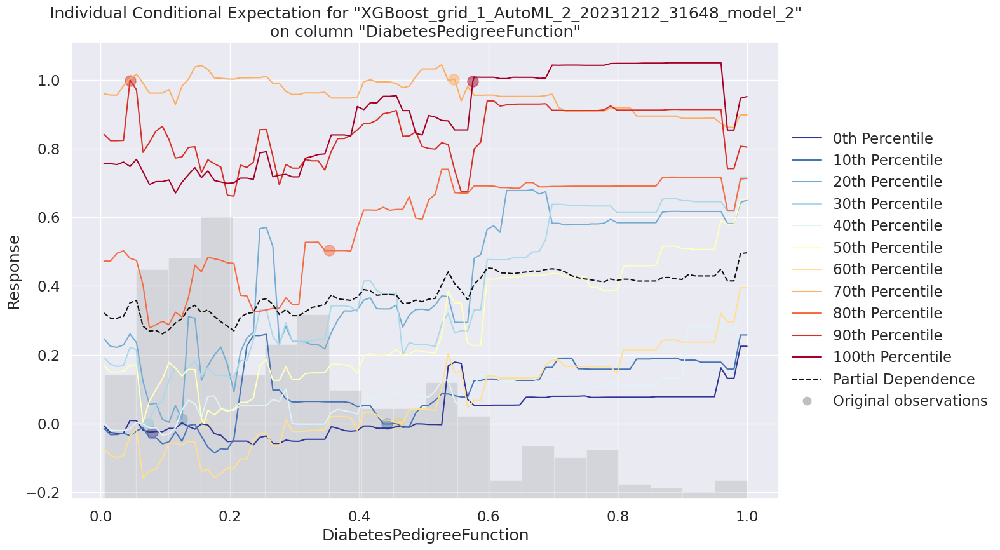

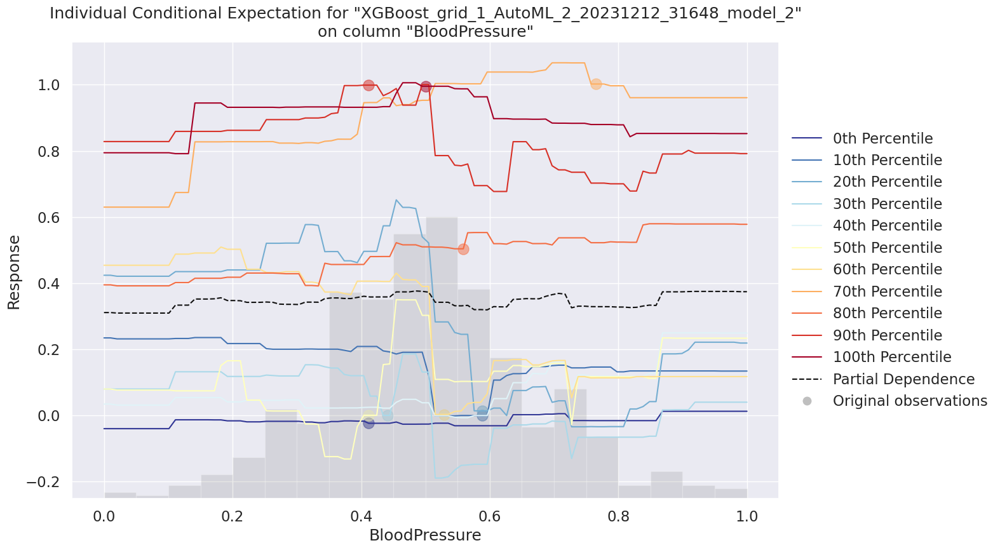

In [230]:

autoML_model.explain(autoML[1])  # AutoML Explainability

#SHAP Analysis for Linear and Tree-Based Models
Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of Glucose

For the linear model the cross is made at approx E[f(x)] 0.395


For Tree-based model the cross is made at approx E[f(x)] 0.27


So as the value of Glucose increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) to check the output. By plotting this we can see the difference between the model output from the expected value.



ExactExplainer explainer: 2492it [00:30, 69.42it/s]                           


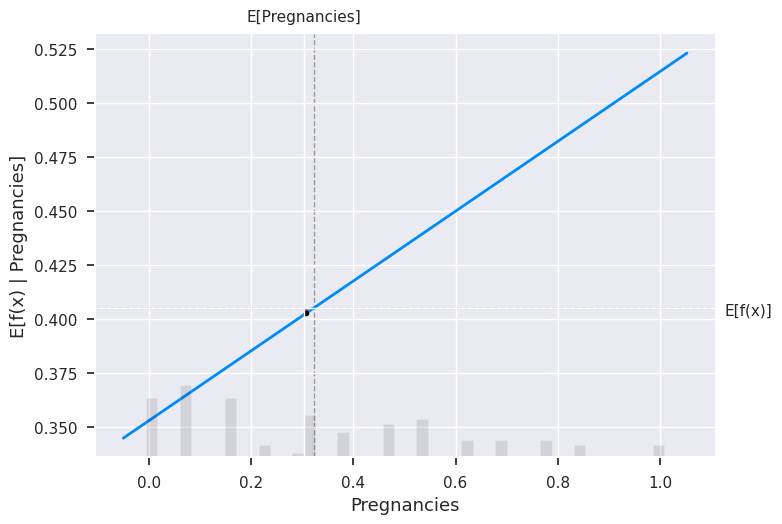

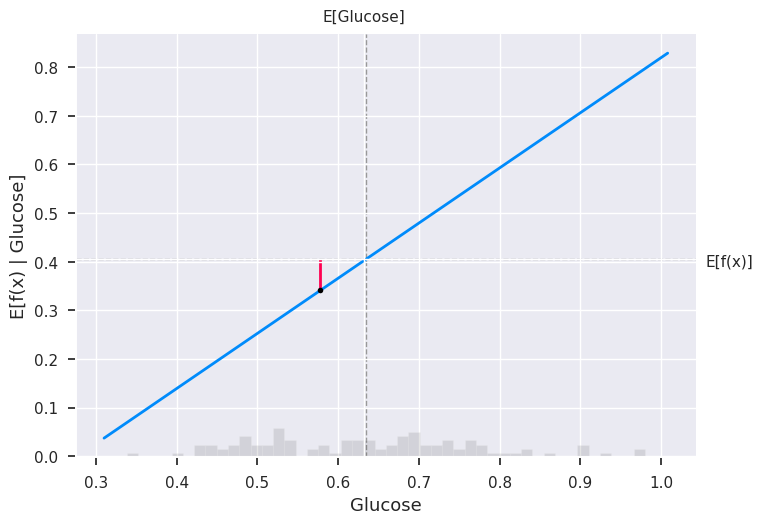

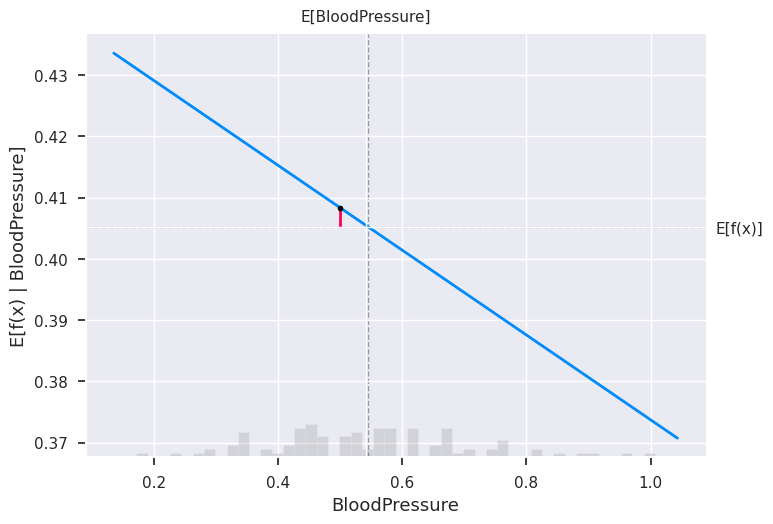

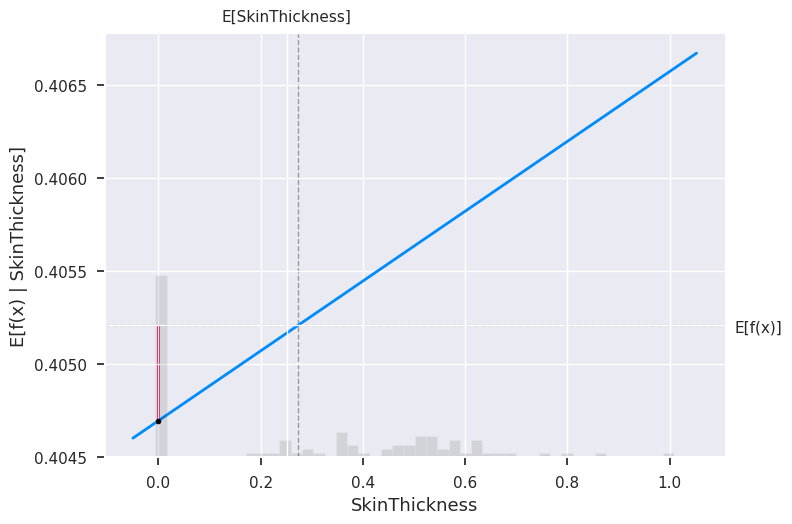

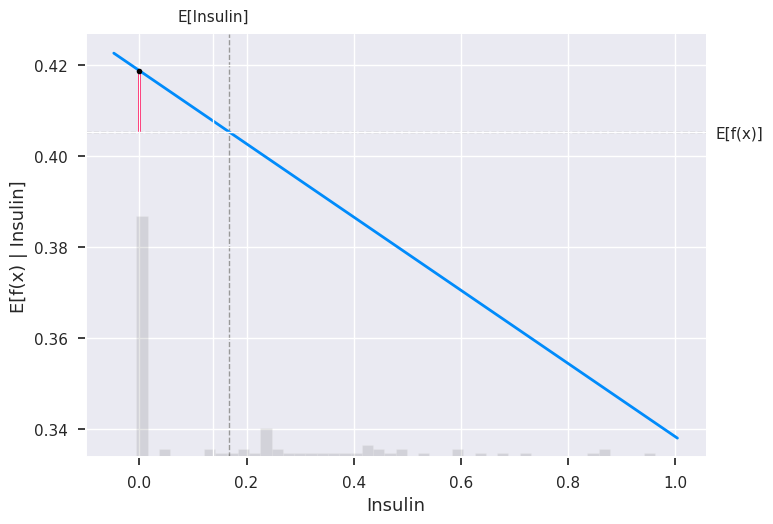

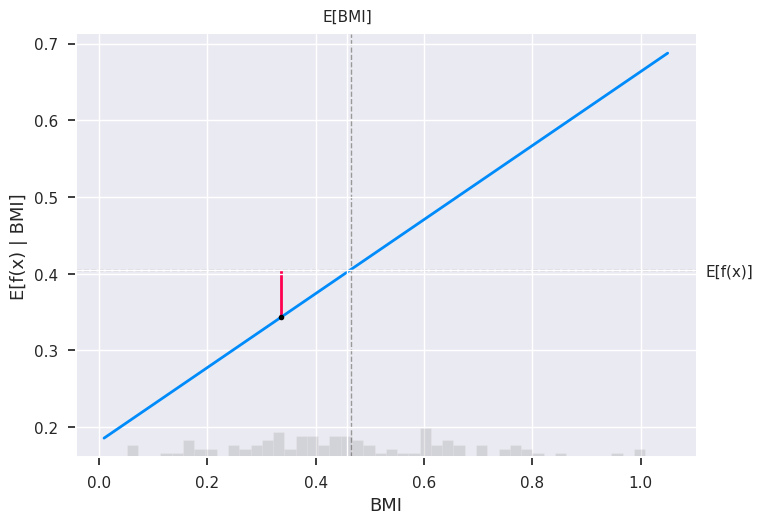

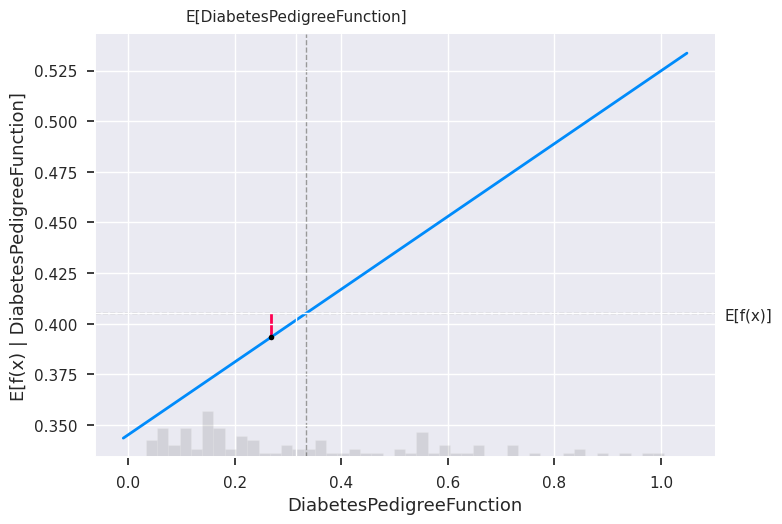

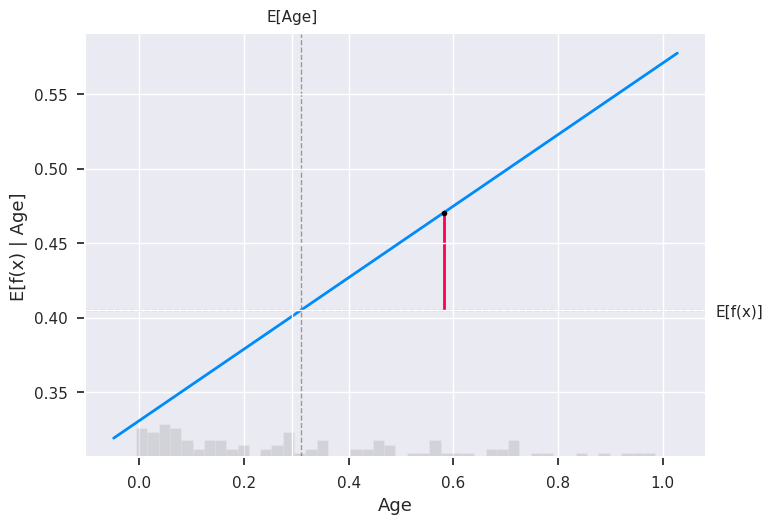

In [231]:
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )


ExactExplainer explainer: 2492it [00:37, 45.57it/s]                          


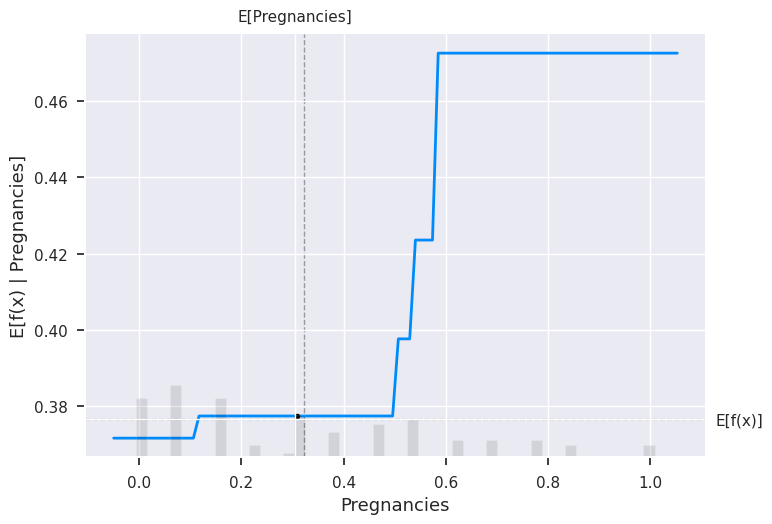

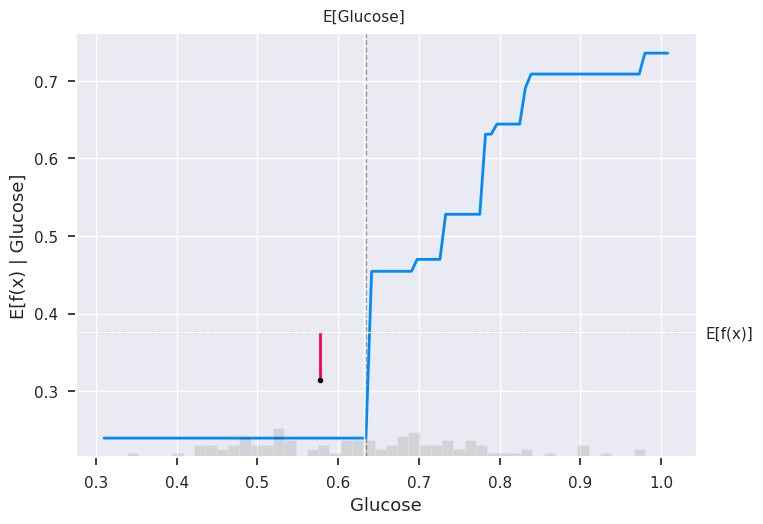

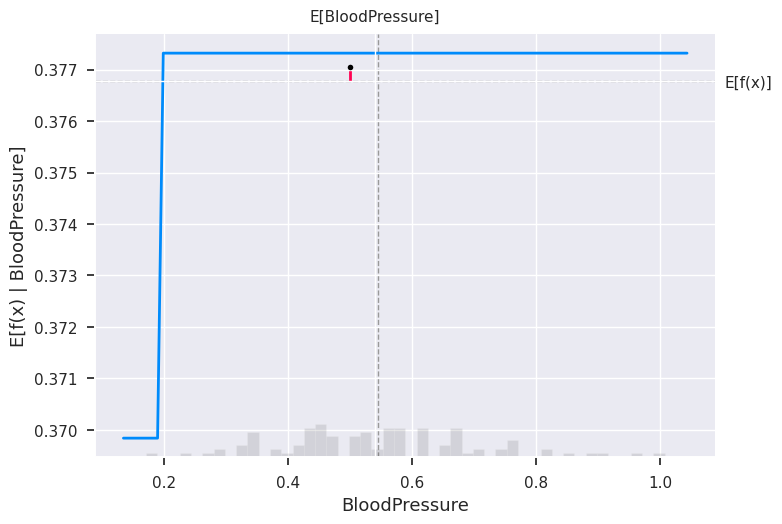

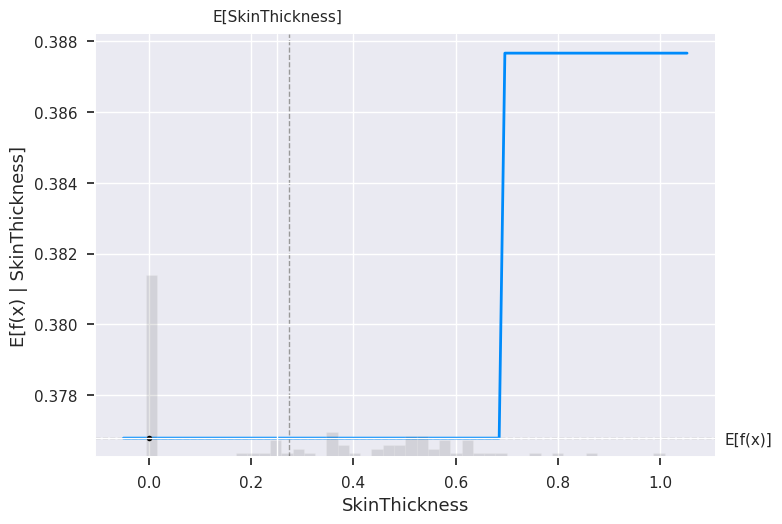

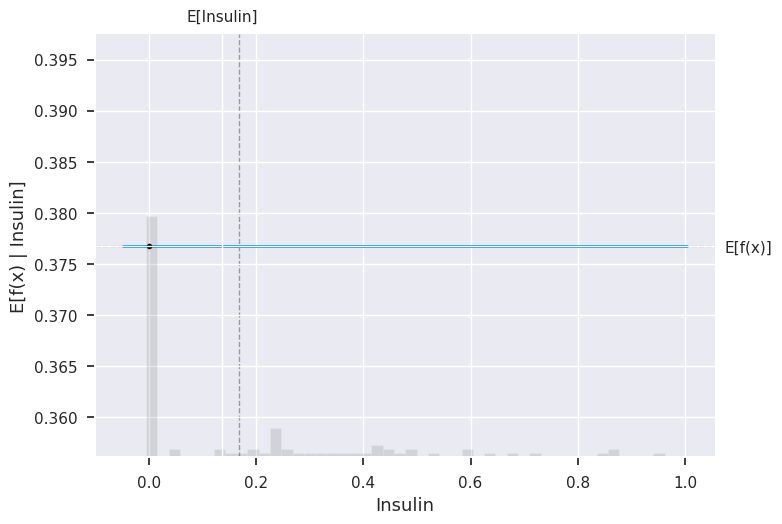

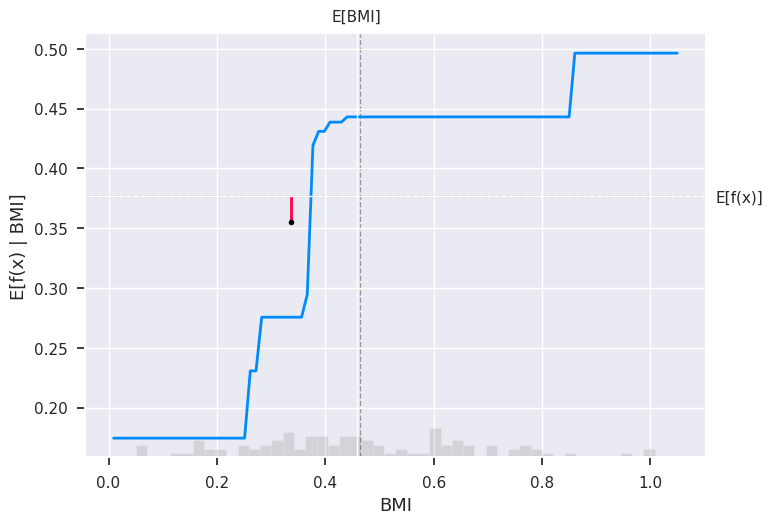

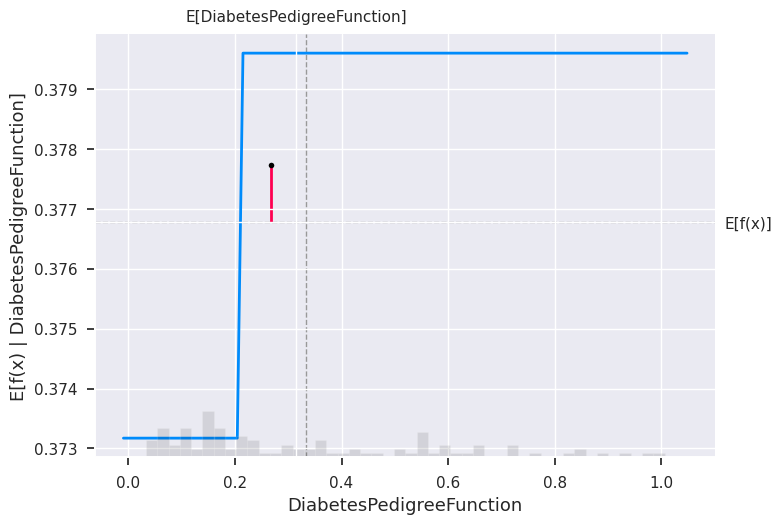

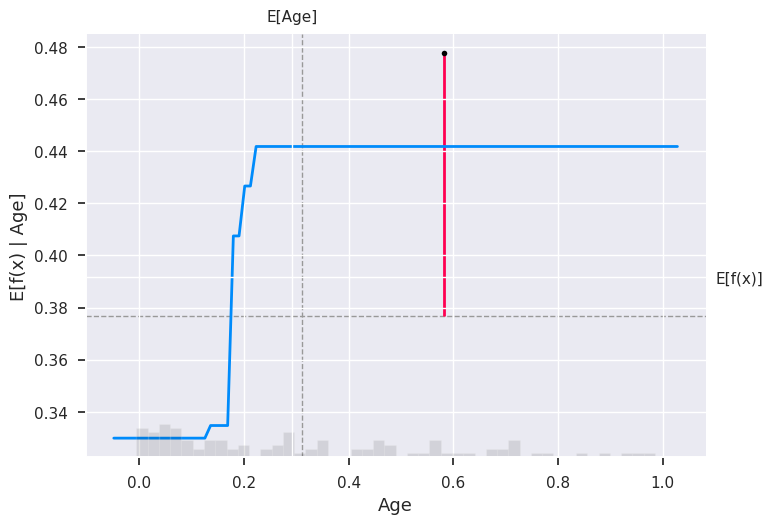

In [232]:
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# Interpreting SHAP Feature Importance Plot for Linear and Tree-based model
The concept behind SHAP feature importance is straightforward: it measures the importance of each feature in a model by looking at the magnitude of their corresponding Shapley values. To obtain a global measure of feature importance, the absolute Shapley values are averaged across all data points. The resulting values are then sorted in descending order and plotted to display the relative importance of each feature.

The SHAP feature importance plots for a linear model and a tree-based model demonstrate that there are differences in the feature importance rankings between the two types of models. This suggests that the relative importance of different features may vary depending on the modeling approach used, and that SHAP analysis can provide valuable insights into the factors driving model predictions.

Glucose is the most important feature for linear as well as our tree-based model


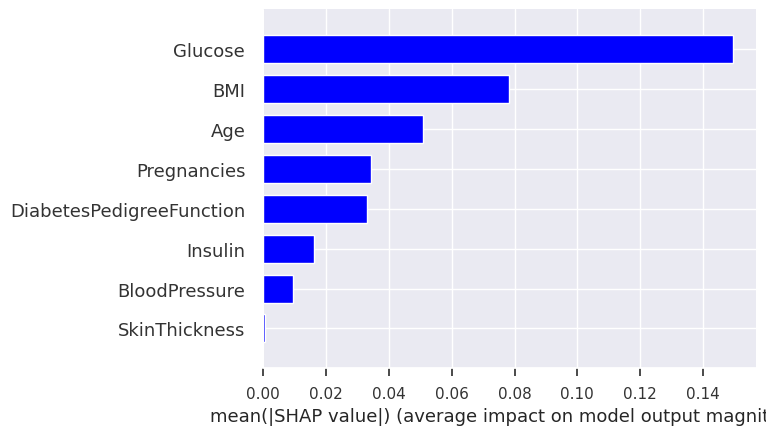

In [233]:
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

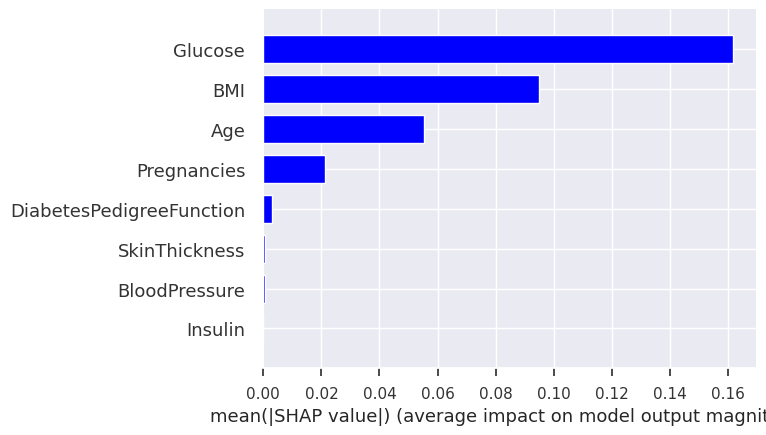

In [234]:
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

#Interpreting Waterfall SHAP visualization
Take the same sample (sample ind = 18) into consideration.
Take note that the value of Glucose in the waterfall model matches the partial dependence plot for SHAP. It states that the model output was f(x) = 0.405 whereas the predicted result for this sample was f(x) = 0.346. Although the difference is only 0.059, we were really close to figuring it out. The waterfall model describes how we arrived at the desired result and what contributions certain components made. According to the graph below, Glucose had the strongest and most significant influence on this sample's Value of Outcome, which decreased by 0.06 points. Following BMI had an effect and decreased the value of Outcome for this sample by 0.06.

With the same data, we may similarly understand the tree-based model.
Although the predicted value was 0.377, the output we received was 0.395. The only difference between the tree-based model and the linear model is the size of the influence that each attribute has. Here, Glucose, BMI, and Insulin play a significant role in determining the output of the tree-based model, whereas in the linear model, Glucose, BMI, and Age had the greatest influence


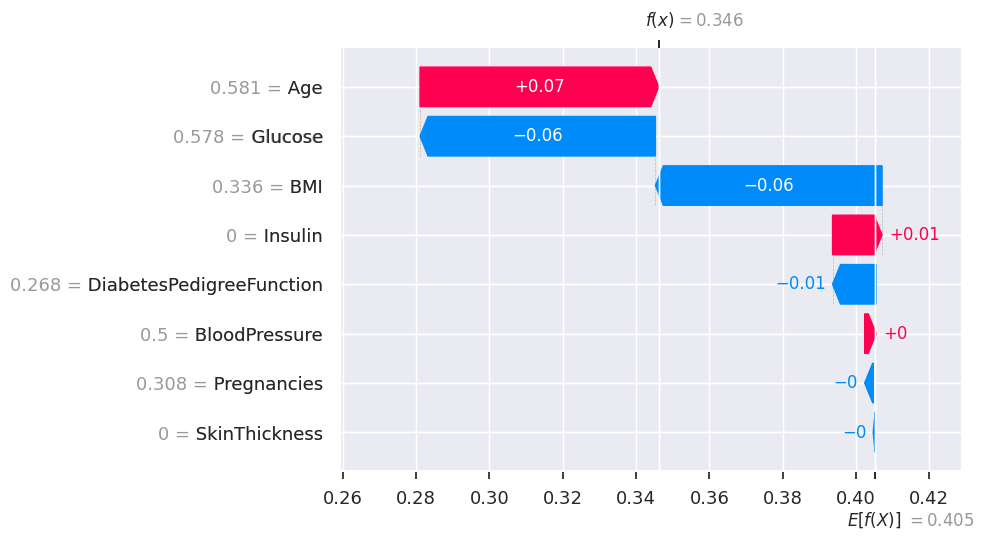

In [235]:
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

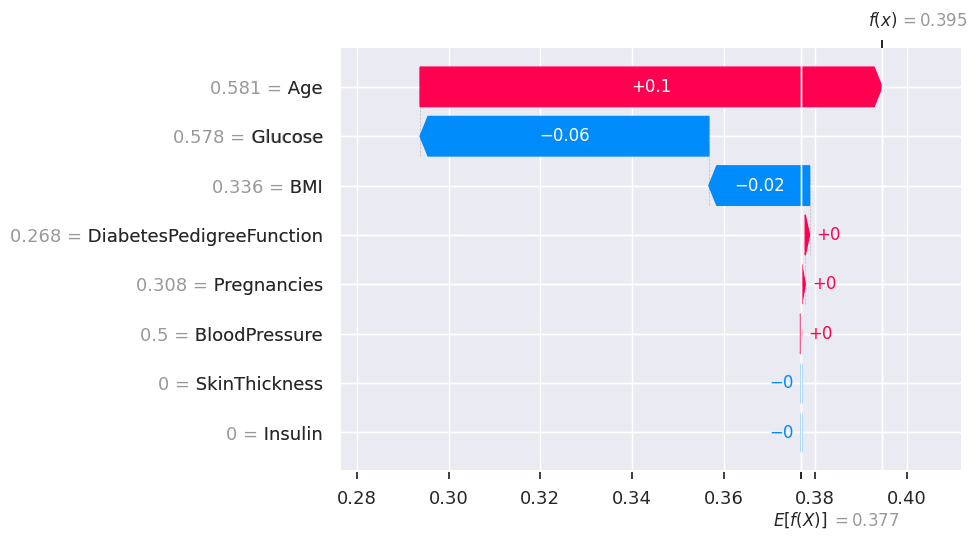

In [236]:
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

#Interpret the summary plot for the Linear and Tree-based model
Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

This visual representation shows the impact of different aspects on the outcome, with red dots representing higher values and blue dots representing lower values. The position of each dot on the x-axis indicates the intensity of its impact, with dots further from the y-axis having a greater impact. Positive impacts are shown on the right side of the y-axis, while negative impacts are on the left.

This visualization is very useful when it comes to interpreting how our model is working.

Observations:

From the plot below, we can know that Glucose is the most effective feature in Linear Regression model, when it's value is larger, it drives the prediction to the right. Higher value of glucose tend to have positive impact on the output variable.

BMI, Pregnancies, DiabetesPedigreeFunction, SkinThickness and Age they all work like Glucose.

However, Blood Pressure and Insulin work differently, when their value is smaller than the average, they dirve the prediction to the right. Hence smaller value of blood pressure and insulin have positive impact on the iutput variable.

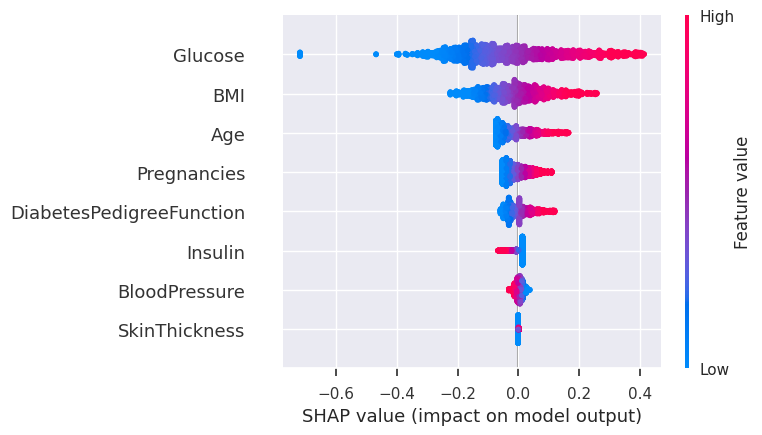

In [237]:
shap.summary_plot(linear_shap_values, x_train)

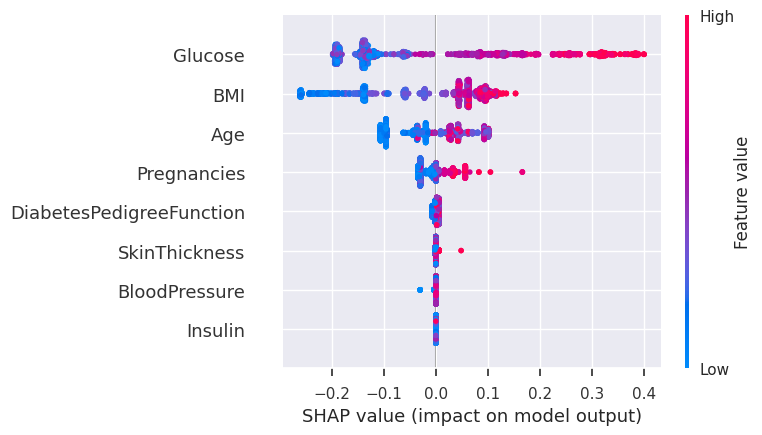

In [238]:
shap.summary_plot(tree_shap_values, x_train)

# Interpreting SHAP dependence plot for Linear and Tree-based model
The SHAP dependency plot displays the marginal impact one or two characteristics have on a machine learning model's anticipated result. It indicates if there is a linear, monotonic, or complicated connection between the target and a feature. Let's analyze the SHAP dependency graphic to comprehend the linear and tree-based models. Each record in our dataset is represented by a dot in this set of graphs.

As can be seen, there is a linear relationship between the linear model feature and its SHAP value. The link between a feature and the Outcome will be directly proportional, as in the case of Glucose and Blood Pressure, and inverse if the feature has a negative influence on Outcome.

The link between a feature's SHAP value and its tree-based model is no longer linear. Now that they are taking the interaction effects into account, we can observe that the SHAP dependence plot no longer perfectly matches the partial dependence plot. We lose all the high order interactions (ands and ors) in the model that our model may be doing if we look at the PDP. The SHAP defensive scheme, however, considers these interactions, in contrast to PDP.

Example of SHAP dependence plot of Glucose

In the linear model the relationship is linear between Glucose and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.

In the tree-based model we could extract the information on how the quality of each wine is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The value of Glucose in the range (120 - 160) changes drastically.

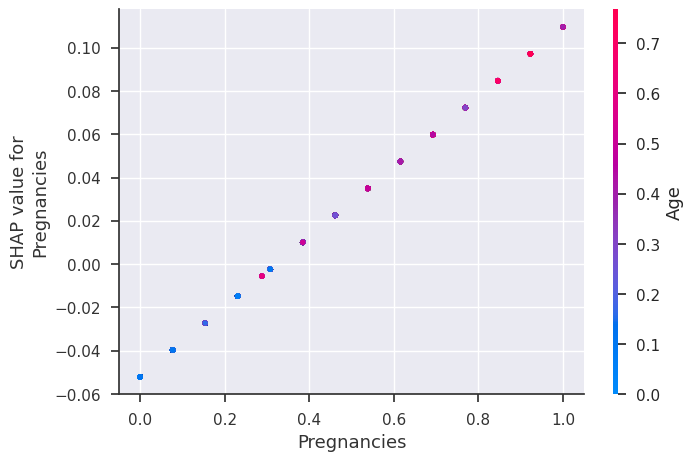

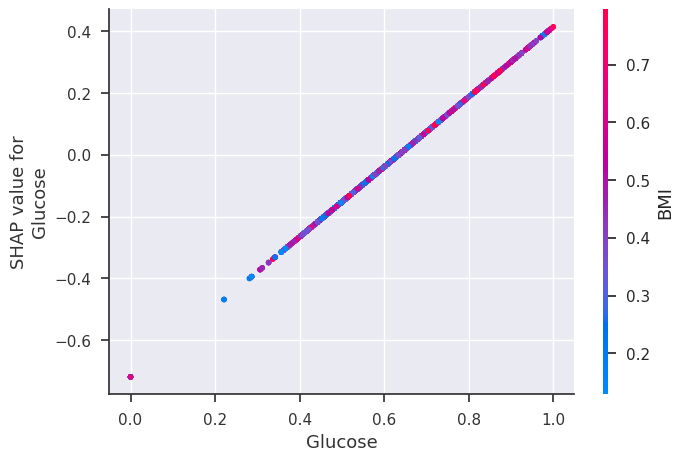

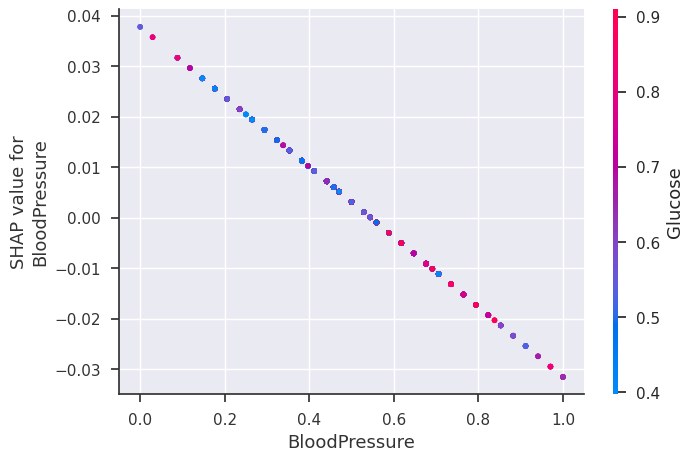

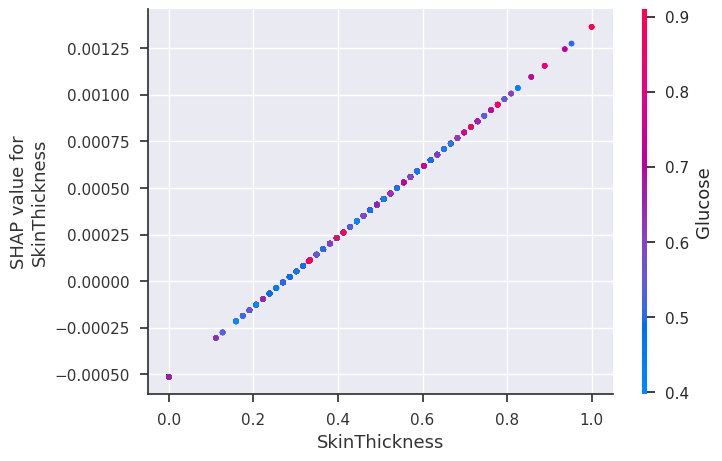

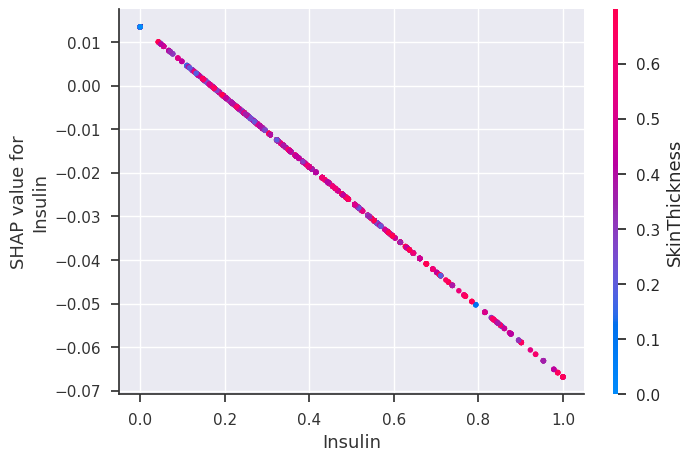

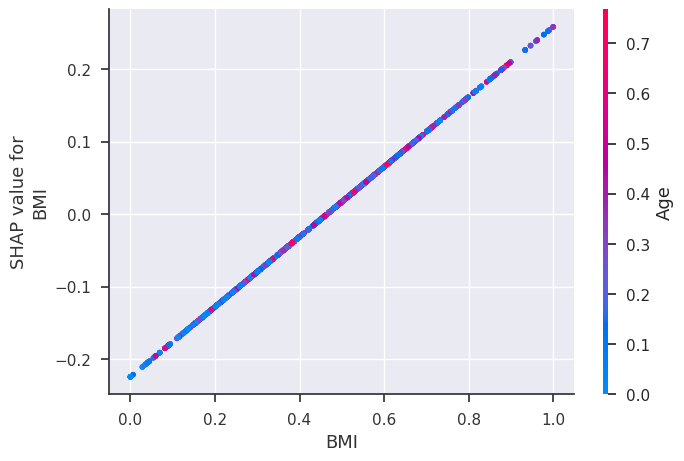

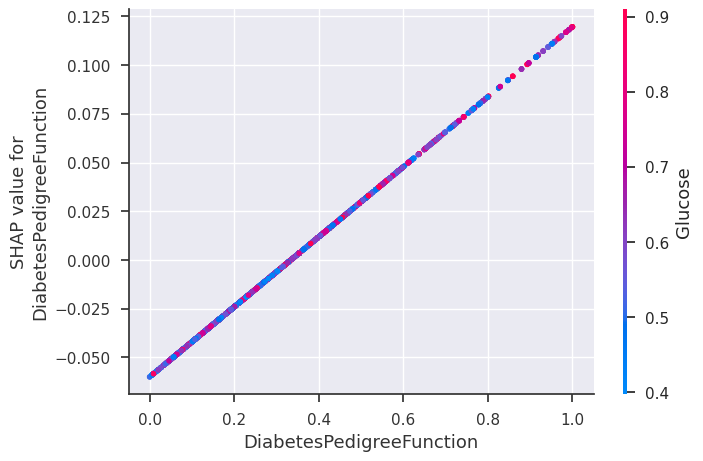

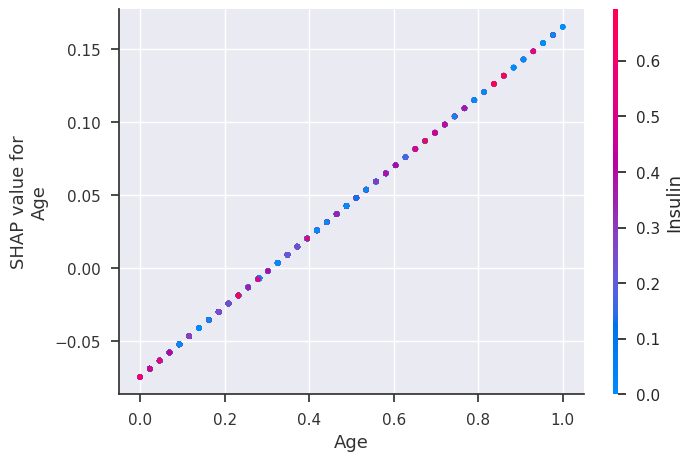

In [239]:
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

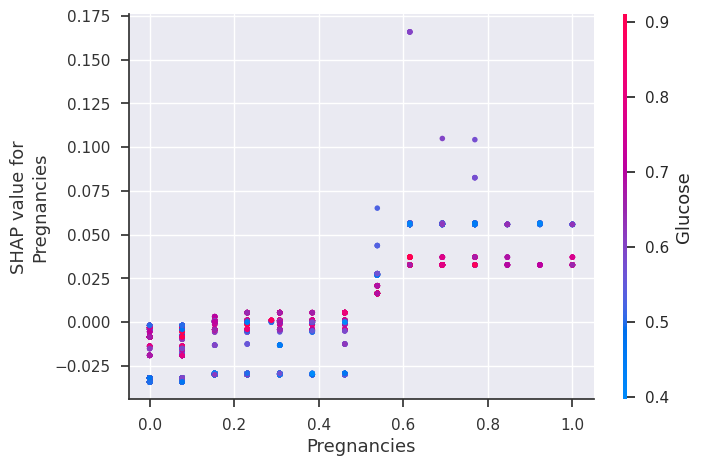

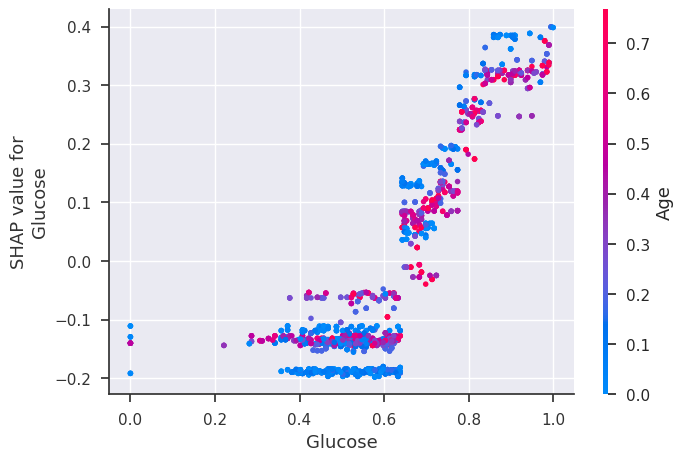

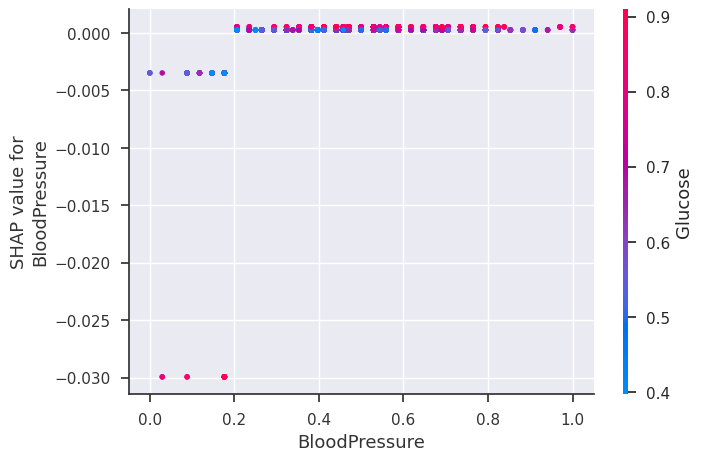

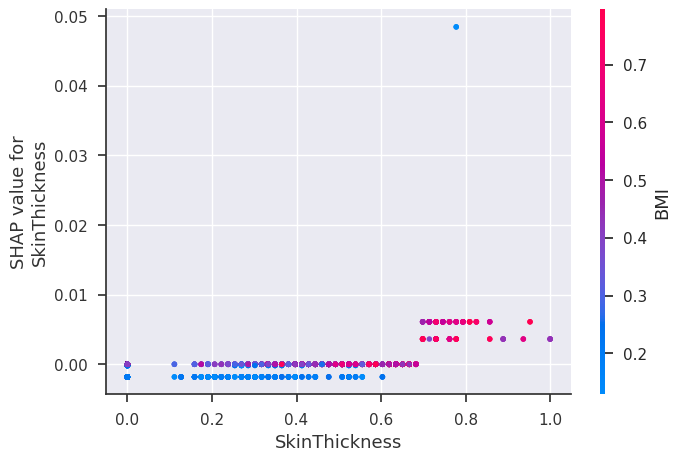

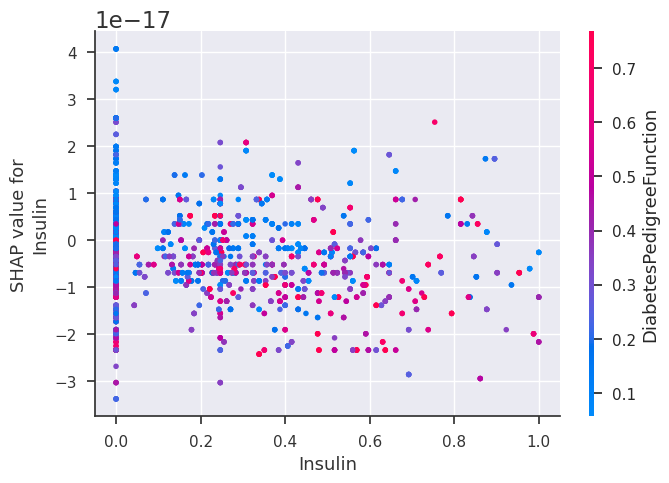

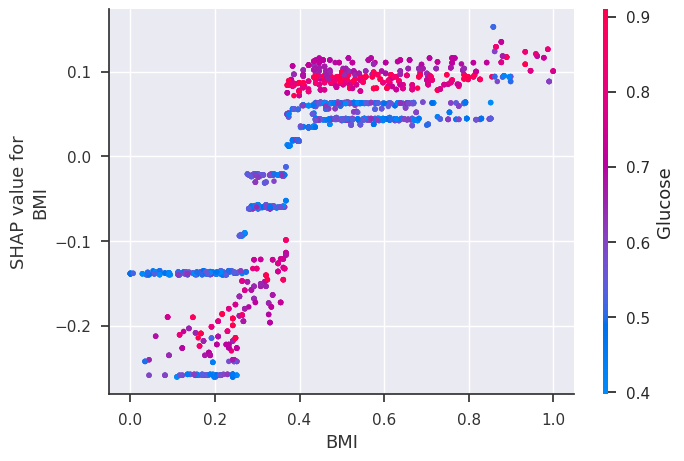

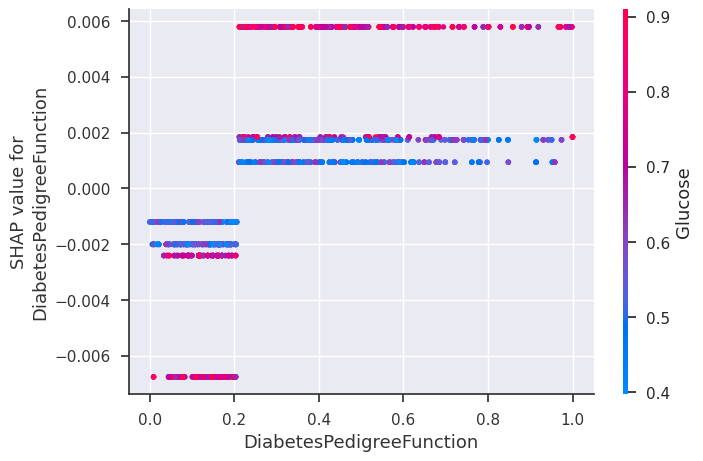

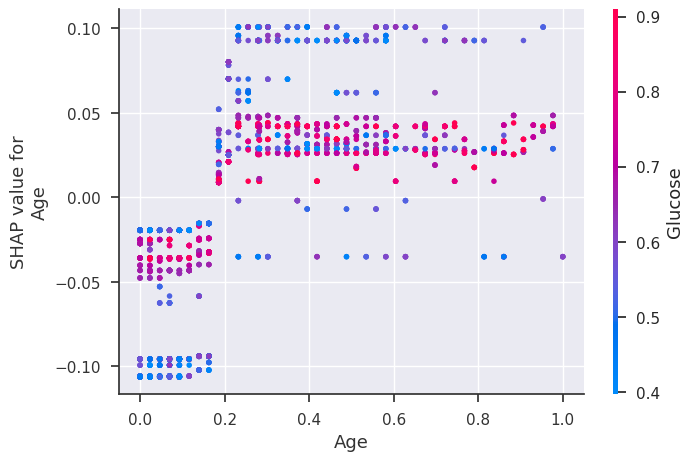

In [240]:
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis
LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below BMI, SkinThickness and Blood Pressure harmed both linear and tree-based model.
Preganancies, Age had a positive effect on the song popularity in both models
Insulin had a positive effect in the linear model but negative in tree-based model
These interpretations were carried out locally in the region where of out sample data(sample_index = 18).



In [241]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)


In [242]:
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.15654183]
Actual :      0


In [243]:
lime_linear_explanation.show_in_notebook(show_table=True, show_all=False)  # Display Results in Notebook

In [244]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [245]:
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [0.06391916]
Actual :      0


In [246]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

In [247]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence


# PDP(Partial Dependence Plot) for Linear model and Tree-based Model


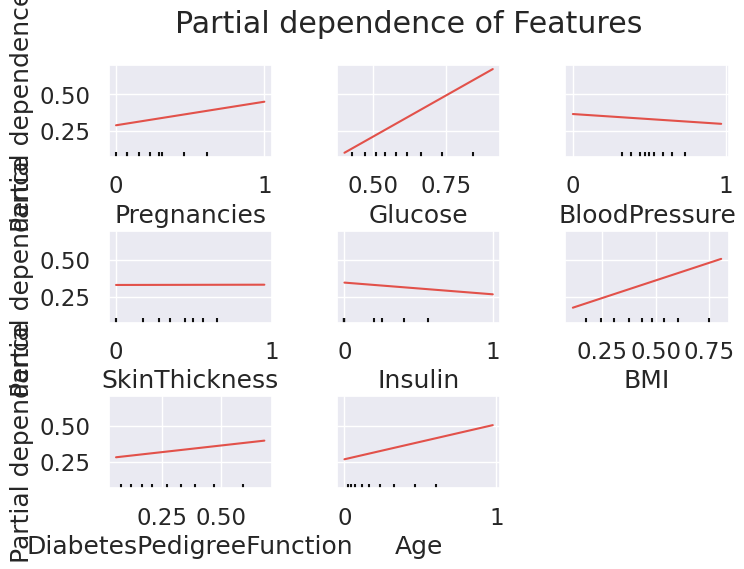

In [248]:
# PDP Plot for Linear Model

PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns)
fig = plt.gcf()
fig.suptitle("Partial dependence of Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

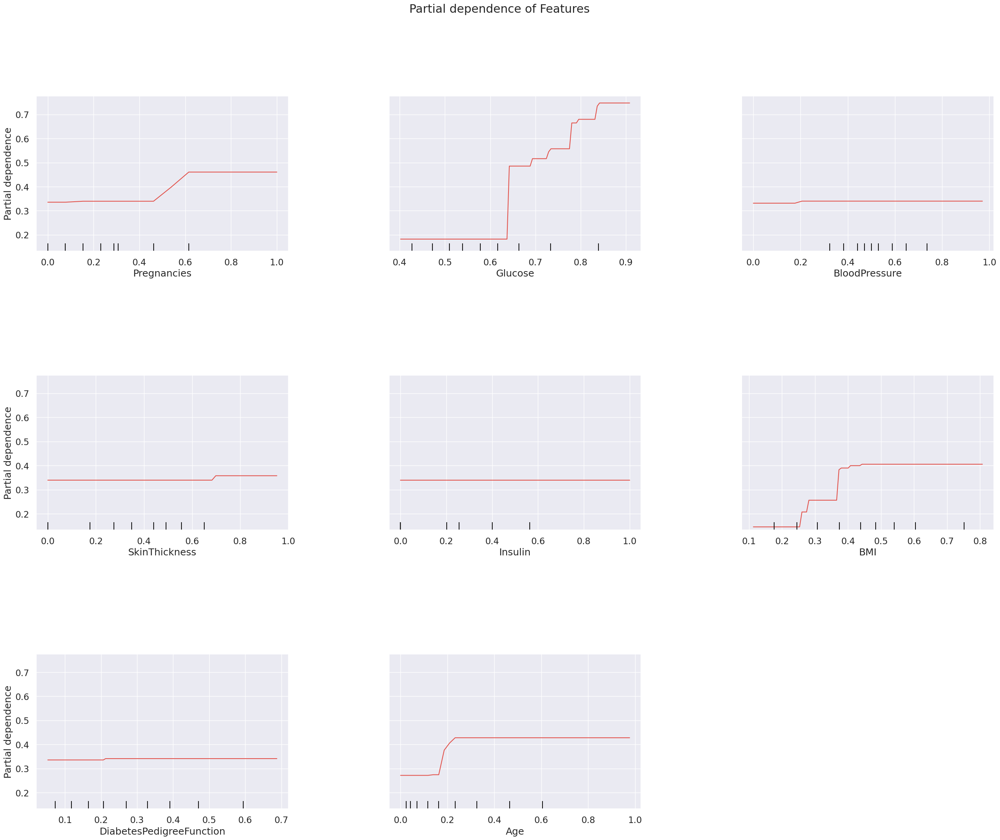

In [249]:
PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns)


fig = plt.gcf()
fig.suptitle("Partial dependence of Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

# Individual Conditional Expectations (ICE)

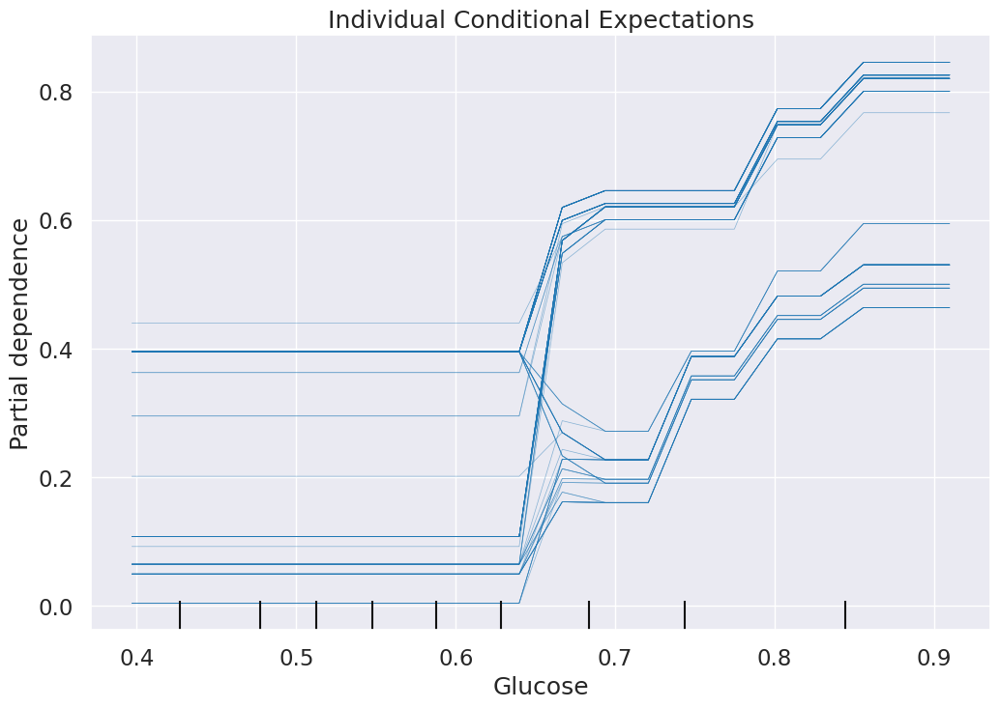

In [250]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title("Individual Conditional Expectations")

display = PartialDependenceDisplay.from_estimator(
    tree_model,
    x_train,
    features=["Glucose"],
    kind="individual",
    subsample=100,
    n_jobs=3,
    grid_resolution=20,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    ax = ax
)

Using ICE, we can see the effect of **Glucose** on the target variable, keeping
other features constant.

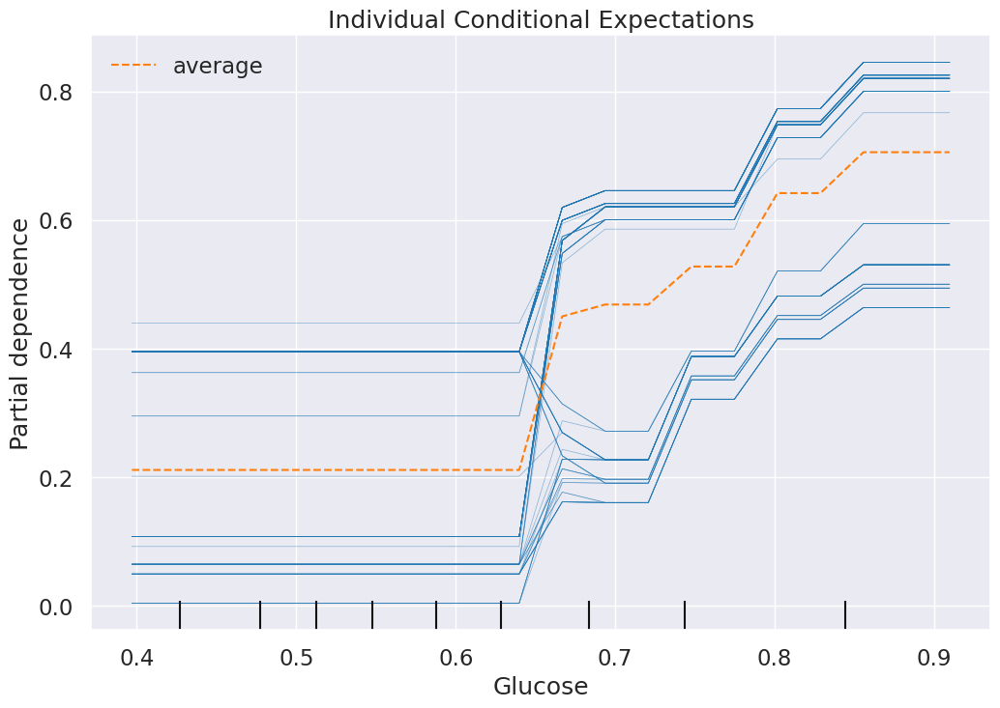

In [251]:
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title("Individual Conditional Expectations")

display = PartialDependenceDisplay.from_estimator(
    tree_model,
    x_train,
    features=["Glucose"],
    kind="both",
    subsample=100,
    n_jobs=3,
    grid_resolution=20,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax = ax
)

Using  kind="both", we can visualise PDP and ICE in a same diagram.

#Comparision between SHAP, LIME, ICE and Partial Dependence Plot Analysis

Rather than using LIME, SHAP uses the black-box model to calculate the marginal contribution of each feature to the prediction. The relevance of each feature is then assessed using game theory's theoretically sound concept of Shapley values. In this regard, SHAP performs better than LIME due to its superior stability and lack of local linear model assumptions. PDPs and ICE plots are techniques used to visualize the average relationship between a specific feature and the model's predictions. They provide insights into how the model's predictions change as a particular feature varies while holding other features constant.


PDP shows how much a variable affects the output by freezing the remaining variables. It calculates the average predicted outcome for each feature value by varying that feature while keeping others fixed. PDPs help identify how a feature's value affects the model's prediction on average.

ICE goes a step further and computes the individual predicted outcomes for each instance as the feature value varies. ICE plots provide insights into the variations across instances.

The contribution of each variable to the prediction is indicated by SHAP.

LIME is essentially a simplified version of SHAP. It uses the point of


interest's local area to provide information about the contribution of each variable to the final result.

To choose the most appropriate interpretable method for the machine learning model, we must first assess our needs and weigh the trade-offs.




#What is the question?
The question is to perform a data analysis on the Diabetes prediction dataset to determine the data types, identify missing values, evaluate the distribution of numeric variables, select independent variables useful in predicting the target variable, determine the importance of predictor variables, interpret the regression coefficients, interpret the nodes of a tree-based model, use AutoML to find the best model, and interpret the models using SHAP analysis.

#What did you do?
I performed the following tasks on the Diabetes prediction dataset:

- Conducted data cleaning and feature selection.
- Identified the data types and missing values in the dataset.
- Evaluated the likely distributions of the numeric variables.
- Used at least three methods to select independent variables useful in predicting the target variable.
- Identified the independent variables that have missing data and determined the percentage of missing values.
- Checked if the training and test sets have the same data and if predictor variables are independent of each other.
- Determined the importance of predictor variables and checked if the ranges of predictor variables make sense.
- Checked the distributions of predictor variables and evaluated the impact of removing outliers.
- Removed 1%, 5%, and 10% of the data randomly and imputed the values using at least three imputation methods to check how well the methods recovered missing values.
- Used AutoML library like H2O.ai to create predictive models and interpret them.
- Interpreted the regression coefficients of the linear model.
- Interpreted the nodes of the tree-based model.
- Used SHAP analysis to interpret the models and compare them with other model interpretability methods.

#How well did it work?
- The analysis performed on the Diabetes prediction dataset yielded useful insights and information.
- The data cleaning and feature selection tasks helped to identify the data types, missing values, and useful independent variables.
- The evaluation of the distribution of numeric variables and the selection of independent variables using different methods provided a better understanding of the dataset.
- The analysis of missing data, checking the independence of predictor variables, determining the importance of predictor variables, and evaluating the impact of removing outliers helped to make informed decisions.
- The use of AutoML library like H2O.ai to create predictive models and interpret them provided useful insights. In addition to these algorithms, automated machine learning (AutoML) using h20 has also been performed.
- The interpretation of the regression coefficients, nodes of the tree-based model, and SHAP analysis helped to understand the models better and compare them with other interpretability methods. The SHAP visualization technique has also been used to identify the key factors contributing to the model predictions.


#What did you learn?
From this analysis, I learned that
- data cleaning and feature selection are crucial in ensuring the quality of the data and identifying useful variables.
- It is essential to evaluate the distribution of numeric variables and select independent variables using different methods.
- I learned how to handle missing data, check the independence of predictor variables, determine the importance of predictor variables, and evaluate the impact of removing outliers.
- Using AutoML libraries like H2O.ai can help in creating predictive models and interpret them.
- I learned how to interpret the regression coefficients, nodes of the tree-based model, and SHAP analysis to understand the models better and compare them with other interpretability methods.
- To interpret the model, three popular techniques were used: SHAP, LIME, ICE and PDP Analysis. These techniques provide a global view of feature importance and explanation for individual predictions, identify the features that contributed the most to the prediction, and visualize the marginal effect of one or more features on the predicted outcome of a model. By using these techniques together, a better understanding of how the model works can be gained.



# Conclusion
The analysis performed on the Diabetes prediction dataset was successful in providing useful insights and information. The data cleaning and feature selection tasks helped in identifying the data types, missing values, and useful independent variables. The evaluation of the distribution of numeric variables and the selection of independent variables using different methods provided a better understanding of the dataset. The analysis of missing data, checking the independence of predictor variables, determining the importance of predictor variables, and evaluating the impact of removing outliers helped to make informed decisions. Using AutoML libraries like H2O.ai to create predictive models and interpret them provided useful insights, and the interpretation of the regression coefficients, nodes of the tree-based model, and SHAP analysis helped to understand the models better and compare them with other interpretability methods. Overall, the assignment provided a comprehensive understanding of data analysis techniques and their applications in predictive learning.


Utilizing H2O's AutoML, a foundational algorithm employing linear regression was developed for the prediction of diabetes presence in patients. Rigorous testing, including assessments of VIF, p-values, and other relevant metrics, was conducted on independent variables. Leveraging the H2O.ai framework, the dataset's variables were trained and evaluated, ultimately leading to the selection of the Distributed Random Forest as the most effective model, achieving an impressive 99% accuracy on test data. This outcome strongly suggests that the proposed linear regression model excels in accurately analyzing and predicting diabetes in patients. Additionally, the high test accuracy, as indicated by the confusion matrix, affirms that the model avoids overfitting.

Moving forward, addressing the challenge of imbalanced data and conducting experiments omitting certain variables with high p-values and VIF values can provide further insights into their impact on predictions.
In summary, the analysis of the Diabetes dataset involved a range of modeling and analysis techniques, including OLS regression, classification modeling using a confusion matrix, automated machine learning (AutoML), regularization technique, SHAP and LIME analysis for explaining model predictions, and partial dependence plots to visualize the relationship between the target variable and input variables. Hyperparameter tuning was also performed to optimize the model's performance, and data cleaning was conducted to remove outliers.

#References

1. W3schools

2. Scikit learn Documentation

3. https://machinelearningmastery.com/calculate-the-bias-variance-trade-off/

4. https://python.plainenglish.io/use-python-to-find-the-interquartile-range-of-a-dataset-cbbb8542db9d

5. https://github.com/aiskunks/

6. Medium Articles

7. AutoML Regression [(Sanika Patne)](https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb)

8. AutoML Regression [(Chenxu Zhao)](https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Smoke_Detection_Example.ipynb)

9. [H2O Documentation](https://docs.h2o.ai/)

10. Dataset [Kaggle](https://www.kaggle.com/datasets/nanditapore/healthcare-diabetes/discussion)

11. https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

12. https://blog.ml.cmu.edu/2020/08/31/6-interpretability/

13. https://medium.com/@kumar9059300448/understanding-interpretable-machine-learning-exploring-shap-lime-pdps-and-ices-9239b497f065

14. https://towardsdatascience.com/three-interpretability-methods-to-consider-when-developing-your-machine-learning-model-5bf368b47fac

15. https://www.twosigma.com/articles/interpretability-methods-in-machine-learning-a-brief-survey/

16. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb

17. https://towardsdatascience.com/shap-a-reliable-way-to-analyze-your-model-interpretability-874294d30af6

18. https://medium.com/data-science-in-your-pocket/understanding-partial-dependence-plots-pdps-415346b7e7f1

19. https://towardsdatascience.com/understanding-model-predictions-with-lime-a582fdff3a3b

20. https://medium.com/dataman-in-ai/explain-your-model-with-the-shap-values-bc36aac4de3d







Copyright (c) 2023 Snehal Padekar

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.